# 0.0 Imports

## 0.1 Imports

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import inflection
import re
import math

from IPython.core.display import HTML

from sklearn.cluster import KMeans
from sklearn import metrics as m
from sklearn.preprocessing import FunctionTransformer, MinMaxScaler, StandardScaler, OrdinalEncoder
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.compose import ColumnTransformer, make_column_transformer 
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import NearestNeighbors

from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from pandas_profiling import ProfileReport

from umap import UMAP

from boruta import BorutaPy
from heatmap import corrplot

from sklearn.cluster import DBSCAN, AffinityPropagation, SpectralClustering
from sklearn.mixture import GaussianMixture
from scipy.cluster import hierarchy as hc 

from sklearn.metrics import silhouette_score, silhouette_samples

from matplotlib import cm
from plotly import io as pio, express as px

## 0.2 Helper Functions



In [2]:
# Defining some plot settings
def jupyter_settings():
    %matplotlib inline
    #%pylab inline
    #matplotlib notebook
    plt.style.use( 'bmh' )
    plt.rcParams['figure.figsize'] = [25, 12]
    plt.rcParams['font.size'] = 24
    display( HTML( '<style>.container { width:100% !important; }</style>') )
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option( 'display.expand_frame_repr', False )
    sns.set()

jupyter_settings()

def plot_silhouette(X, cluster_labels, ax1 = None):
    '''
    Plots a Silhoutte Visualizer image with a silhouette coefficient for each sample on a per-cluster basis.
    '''    

    if ax1 is None:
        ax1 = plt.gca()
    
    silhouette_avg = silhouette_score(X, cluster_labels)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    min_x = 0

    clusters = np.unique(cluster_labels)
    n_clusters = len(clusters)        
    for i in clusters:
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        min_ith = ith_cluster_silhouette_values.min()
        if min_ith < min_x:
            min_x = min_ith

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        
        # ploting silhouette
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for {} clusters.".format(n_clusters))
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks(np.arange(-1, 1.1, 0.1))
    ax1.set_xlim([min_x - 0.05, 1])

    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    print("For n_clusters = {} the average silhouette_score is : {:.4f}".format(n_clusters,silhouette_avg))

    return(ax1)

pio.renderers.default = 'notebook_connected'
# run this to use jupyter notebook or check pio.renderers to select a renderer
# pio.renderers.default = 'notebook'


## 0.3 Data Loading



In [3]:
df0 = pd.read_csv('../data/raw/ecommerce.csv', encoding='ISO-8859-1', sep = ',')
# source https://www.kaggle.com/vik2012kvs/high-value-customers-identification
# other https://github.com/provezano/UK-High-Value-Customers-Identification/tree/main/data

## 0.4 Columns Description



### Attribute Description
- InvoiceNo Invoice number (A 6-digit integral number uniquely assigned to each transaction)
- StockCode Product (item) code
- Description Product (item) name
- Quantity The quantities of each product (item) per transaction
- InvoiceDate The day when each transaction was generated
- UnitPrice Unit price (Product price per unit)
- CustomerID Customer number (Unique ID assigned to each customer)
- Country Country name (The name of the country where each customer resides)

## 0.5 Solution Method

### IOT Input Output Visualizing

The aim is to build a data solution similar to this [draft](https://docs.google.com/spreadsheets/d/1zmBQAxvlx-nWgziQZmoL7lx-F1maMAMp5qlVD2c6AyA/edit?usp=sharing)

Situation: The organization will roll out a fidelity program (Insiders Program) to these customers. Customers should be segmented in a way that it is possible to find the most valuable customers. 

Inputs:
- Data from customer transactions (11-2016 ~ 12-2017)

Outputs:
 - Which customers are eligible to participate in the Insiders program?
 - How many customers will be part of the group?
 - What are the main characteristics of these customers?
 - What percentage of revenue contribution comes from Insiders?
 - What is the revenue expectation of this group for the coming months?
 - What are the conditions for a person to be eligible for Insiders?
 - What are the conditions for a person to be removed from Insiders?
 - Are there any guarantees that the Insiders Program customers' have indeed higher value than the rest of the customer base?
 - What actions can the marketing team take to increase revenue?

### Tasks:
- Which customers are eligible to participate in the Insiders program?
    - High Value
    - High Average Transaction Value
    - High Frequency (customer is frequently buying)
    - Low Recency (customer has bough recently)
    - High LTV
    - High Basket Size

- How many customers will be part of the group?
- What are the main characteristics of these customers?
- What percentage of revenue contribution comes from Insiders?
- What is the revenue expectation of this group for the coming months?
- What are the conditions for a person to be eligible for Insiders?
- What are the conditions for a person to be removed from Insiders?
- Are there any guarantees that the Insiders Program customers' have indeed higher value than the rest of the customer base?
- What actions can the marketing team take to increase revenue?

### Business Understanding and Metrics
- RFM Recency Frequency Monetary Analysis
    - Formula: ((Total distinct customers at end of period) - (Total new distinct customers acquired during period)) / (Total distinct customers at start of period)
- Average Customer Spend = Customers Annual Average Spend Per Purchase * Annual Purchase Frequency
- Average Transaction Value = Annual Revenue/ Invoces Raised


# 1.0 Data Description


In [51]:
df1 = pd.read_csv('../data/raw/ecommerce.csv', encoding='ISO-8859-1', sep = ',')

## 1.1 Rename Columns

In [52]:
cols_old = df1.columns.tolist()

cols_new = [inflection.underscore(col) for col in cols_old]
cols_new

['invoice_no',
 'stock_code',
 'description',
 'quantity',
 'invoice_date',
 'unit_price',
 'customer_id',
 'country',
 'unnamed: 8']

In [53]:
df1.rename(columns = dict(zip(cols_old, cols_new)), inplace = True )

## 1.2 Data Dimensions

In [54]:
print( 'Number of rows: {}'.format( df1.shape[0] ) )
print( 'Number of cols: {}'.format( df1.shape[1] ) )

Number of rows: 541909
Number of cols: 9


## 1.3 Data Types

In [55]:
df1.dtypes

invoice_no       object
stock_code       object
description      object
quantity          int64
invoice_date     object
unit_price      float64
customer_id     float64
country          object
unnamed: 8      float64
dtype: object

## 1.4 NA Check

In [56]:
df1.isna().sum()/df1.shape[0]*100

invoice_no        0.000000
stock_code        0.000000
description       0.268311
quantity          0.000000
invoice_date      0.000000
unit_price        0.000000
customer_id      24.926694
country           0.000000
unnamed: 8      100.000000
dtype: float64

In [57]:
df1.drop(columns=['unnamed: 8'], inplace = True)
df1.columns

Index(['invoice_no', 'stock_code', 'description', 'quantity', 'invoice_date',
       'unit_price', 'customer_id', 'country'],
      dtype='object')

## 1.5 NA Fillout

Won't use in this cycle

In [58]:
df1.dropna(subset=['customer_id'], axis = 0, inplace =  True)
df1.isna().sum()

invoice_no      0
stock_code      0
description     0
quantity        0
invoice_date    0
unit_price      0
customer_id     0
country         0
dtype: int64

## 1.6 Changing Data Types


In [59]:
df1.head()

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,29-Nov-16,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,29-Nov-16,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,29-Nov-16,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,29-Nov-16,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,29-Nov-16,3.39,17850.0,United Kingdom


In [60]:
df1.dtypes

invoice_no       object
stock_code       object
description      object
quantity          int64
invoice_date     object
unit_price      float64
customer_id     float64
country          object
dtype: object

In [61]:
df1['invoice_date'] = pd.to_datetime( df1['invoice_date'], format = '%d-%b-%y' )

df1['customer_id'] = df1['customer_id'].astype(int)

df1.head()

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2016-11-29,2.55,17850,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2016-11-29,3.39,17850,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2016-11-29,2.75,17850,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2016-11-29,3.39,17850,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2016-11-29,3.39,17850,United Kingdom


In [62]:
df1.dtypes

invoice_no              object
stock_code              object
description             object
quantity                 int64
invoice_date    datetime64[ns]
unit_price             float64
customer_id              int64
country                 object
dtype: object

## 1.7 Descriptive Statistics

### 1.7.1 Numerical Attributes

In [16]:
num_att = df1.select_dtypes(include= ['int','float'])
d1 = pd.DataFrame( num_att.min() ).T
d2 = pd.DataFrame( num_att.max() ).T
d3 = pd.DataFrame( num_att.max() - num_att.min() ).T
d4 = pd.DataFrame( num_att.mean() ).T
d5 = pd.DataFrame( num_att.median() ).T
d6 = pd.DataFrame( num_att.std() ).T
d7 = pd.DataFrame( num_att.skew() ).T
d8 = pd.DataFrame( num_att.kurtosis() ).T

desc = pd.concat( [d1, d2, d3, d4, d5, d6, d7, d8] ).T
desc.columns = ['min', 'max', 'range', 'mean', 'median', 'std', 'skew', 'kurtosis' ]
desc.style.format( "{:,.2f}" )

,min,max,range,mean,median,std,skew,kurtosis
quantity,"-80,995.00","80,995.00","161,990.00",12.06,5.00,248.69,0.18,"94,317.56"
unit_price,0.00,"38,970.00","38,970.00",3.46,1.95,69.32,452.22,"246,924.54"
customer_id,"12,346.00","18,287.00","5,941.00","15,287.69","15,152.00","1,713.60",0.03,-1.18


### Things to check on Variable Filtering

- quantity min and max seems to be outliers (negatives are returns)
- unit price 0 makes no sense (promo? return?)

### 1.7.2 Categorical Attributes

In [17]:
cat_att = df1.select_dtypes(include = 'object')
cat_att.head()

,invoice_no,stock_code,description,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,United Kingdom
1,536365,71053,WHITE METAL LANTERN,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,United Kingdom


In [18]:
# Select all rows that have non numerical values (\D = digit)
idx = cat_att['invoice_no'].apply( lambda x : bool(re.search( "\D", x ) ) )
print( 'number of occurrences: ', len(cat_att.loc[ idx == True, 'invoice_no' ]))
print( 'number of invoices: ', len(cat_att.loc[ idx == True, 'invoice_no' ].drop_duplicates()))

# bool(re.search( '\D', '123') )

number of occurrences:  8905
number of invoices:  3654


In [19]:
# contains any letter
idx = cat_att['stock_code'].apply( lambda x : bool(re.search( "[a-zA-Z]+", x ) ) )
print( 'number of occurrences: ', len(cat_att.loc[ idx == True, 'stock_code' ]))
print( 'number of invoices: ', len(cat_att.loc[ idx == True, 'stock_code' ].drop_duplicates()))

cat_att.loc[ idx == True ].head()

number of occurrences:  35809
number of invoices:  886


,invoice_no,stock_code,description,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,United Kingdom
45,536370,POST,POSTAGE,France


# 2.0 Data Filtering

## 2.1 Data Inspection

In [20]:
df2 = df1.copy()

### Invoice Number

In [21]:
# selecting all non digits
df_invoice = df2.loc[ df2['invoice_no'].apply( lambda x: bool(re.search( '\D+', x )) )]
df_invoice.head(10)

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
141,C536379,D,Discount,-1,2016-11-29,27.50,14527,United Kingdom
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,2016-11-29,4.65,15311,United Kingdom
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2016-11-29,1.65,17548,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2016-11-29,0.29,17548,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2016-11-29,0.29,17548,United Kingdom
238,C536391,21980,PACK OF 12 RED RETROSPOT TISSUES,-24,2016-11-29,0.29,17548,United Kingdom
239,C536391,21484,CHICK GREY HOT WATER BOTTLE,-12,2016-11-29,3.45,17548,United Kingdom
240,C536391,22557,PLASTERS IN TIN VINTAGE PAISLEY,-12,2016-11-29,1.65,17548,United Kingdom
241,C536391,22553,PLASTERS IN TIN SKULLS,-24,2016-11-29,1.65,17548,United Kingdom
939,C536506,22960,JAM MAKING SET WITH JARS,-6,2016-11-29,4.25,17897,United Kingdom


In [22]:
df_invoice['quantity'].max()

# invoices that contain C are probably a chargeback operation
# all quantities are negative

-1

In [23]:
# selecting all non digits
df_invoice = df2.loc[ df2['invoice_no'].apply( lambda x: bool(re.search( '^[\D]+$', x )) )]
df_invoice.head(10)

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country


### Stock Code

In [24]:
# selecting rows with at least 1 occurrence of non digit
df_stock = df2.loc[df2['stock_code'].apply( lambda x: bool( re.search( '\D+' , x) ) )]
df_stock.head(10)


,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2016-11-29,2.55,17850,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2016-11-29,2.75,17850,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2016-11-29,3.39,17850,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2016-11-29,3.39,17850,United Kingdom
45,536370,POST,POSTAGE,3,2016-11-29,18.00,12583,France
49,536373,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2016-11-29,2.55,17850,United Kingdom
51,536373,84406B,CREAM CUPID HEARTS COAT HANGER,8,2016-11-29,2.75,17850,United Kingdom
60,536373,82494L,WOODEN FRAME ANTIQUE WHITE,6,2016-11-29,2.55,17850,United Kingdom
61,536373,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2016-11-29,3.39,17850,United Kingdom
62,536373,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2016-11-29,3.39,17850,United Kingdom


In [25]:
# selecting rows with only non digits
df_stock = df2.loc[df2['stock_code'].apply( lambda x: bool(re.search('^[\D]+$', x)) )]
df_stock.head(10)

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
45,536370,POST,POSTAGE,3,2016-11-29,18.00,12583,France
141,C536379,D,Discount,-1,2016-11-29,27.50,14527,United Kingdom
386,536403,POST,POSTAGE,1,2016-11-29,15.00,12791,Netherlands
1123,536527,POST,POSTAGE,1,2016-11-29,18.00,12662,Germany
2239,536569,M,Manual,1,2016-11-29,1.25,16274,United Kingdom
2250,536569,M,Manual,1,2016-11-29,18.95,16274,United Kingdom
4406,536779,BANK CHARGES,Bank Charges,1,2016-11-30,15.00,15823,United Kingdom
5073,536840,POST,POSTAGE,1,2016-11-30,18.00,12738,Germany
5258,536852,POST,POSTAGE,1,2016-12-01,18.00,12686,France
5325,536858,POST,POSTAGE,2,2016-12-01,40.00,13520,Switzerland


In [26]:
# values to remove
drop_stock = df_stock['stock_code'].unique().tolist()

df_stock['stock_code'].value_counts()

POST            1196
M                465
D                 77
DOT               16
CRUK              16
BANK CHARGES      12
PADS               4
Name: stock_code, dtype: int64

###  Quantity

In [27]:
# negative quantities
df2.loc[ df2['quantity'] <0 ].head(10)

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
141,C536379,D,Discount,-1,2016-11-29,27.50,14527,United Kingdom
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,2016-11-29,4.65,15311,United Kingdom
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2016-11-29,1.65,17548,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2016-11-29,0.29,17548,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2016-11-29,0.29,17548,United Kingdom
238,C536391,21980,PACK OF 12 RED RETROSPOT TISSUES,-24,2016-11-29,0.29,17548,United Kingdom
239,C536391,21484,CHICK GREY HOT WATER BOTTLE,-12,2016-11-29,3.45,17548,United Kingdom
240,C536391,22557,PLASTERS IN TIN VINTAGE PAISLEY,-12,2016-11-29,1.65,17548,United Kingdom
241,C536391,22553,PLASTERS IN TIN SKULLS,-24,2016-11-29,1.65,17548,United Kingdom
939,C536506,22960,JAM MAKING SET WITH JARS,-6,2016-11-29,4.25,17897,United Kingdom


In [28]:
df2[df2['invoice_no'] == 'C536391']

# invoice_no is of returns is different than that of purchases

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2016-11-29,1.65,17548,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2016-11-29,0.29,17548,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2016-11-29,0.29,17548,United Kingdom
238,C536391,21980,PACK OF 12 RED RETROSPOT TISSUES,-24,2016-11-29,0.29,17548,United Kingdom
239,C536391,21484,CHICK GREY HOT WATER BOTTLE,-12,2016-11-29,3.45,17548,United Kingdom
240,C536391,22557,PLASTERS IN TIN VINTAGE PAISLEY,-12,2016-11-29,1.65,17548,United Kingdom
241,C536391,22553,PLASTERS IN TIN SKULLS,-24,2016-11-29,1.65,17548,United Kingdom


In [29]:
df2[df2['customer_id'] == 17548].sort_values('stock_code')

# some returns appear to not have been bought outside the period the dataset was generated.
# It could either be a item purchased before min date, or an error

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
239,C536391,21484,CHICK GREY HOT WATER BOTTLE,-12,2016-11-29,3.45,17548,United Kingdom
238,C536391,21980,PACK OF 12 RED RETROSPOT TISSUES,-24,2016-11-29,0.29,17548,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2016-11-29,0.29,17548,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2016-11-29,0.29,17548,United Kingdom
177227,C552049,22079,RIBBON REEL HEARTS DESIGN,-10,2017-05-04,1.65,17548,United Kingdom
165027,550755,22079,RIBBON REEL HEARTS DESIGN,10,2017-04-18,1.65,17548,United Kingdom
165026,550755,22081,RIBBON REEL FLORA + FAUNA,10,2017-04-18,1.65,17548,United Kingdom
177226,C552049,22081,RIBBON REEL FLORA + FAUNA,-10,2017-05-04,1.65,17548,United Kingdom
177225,C552049,22082,RIBBON REEL STRIPES DESIGN,-10,2017-05-04,1.65,17548,United Kingdom
165025,550755,22082,RIBBON REEL STRIPES DESIGN,10,2017-04-18,1.65,17548,United Kingdom


In [30]:
df2.sort_values( 'quantity' ).head(10)

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
540422,C581484,23843,"PAPER CRAFT , LITTLE BIRDIE",-80995,2017-12-07,2.08,16446,United Kingdom
61624,C541433,23166,MEDIUM CERAMIC TOP STORAGE JAR,-74215,2017-01-16,1.04,12346,United Kingdom
4287,C536757,84347,ROTATING SILVER ANGELS T-LIGHT HLDR,-9360,2016-11-30,0.03,15838,United Kingdom
160145,C550456,21108,FAIRY CAKE FLANNEL ASSORTED COLOUR,-3114,2017-04-16,2.10,15749,United Kingdom
160144,C550456,21175,GIN + TONIC DIET METAL SIGN,-2000,2017-04-16,1.85,15749,United Kingdom
160143,C550456,85123A,WHITE HANGING HEART T-LIGHT HOLDER,-1930,2017-04-16,2.55,15749,United Kingdom
224419,C556522,22920,HERB MARKER BASIL,-1515,2017-06-11,0.55,16938,United Kingdom
187609,C552995,M,Manual,-1350,2017-05-10,0.16,18133,United Kingdom
160142,C550456,47566B,TEA TIME PARTY BUNTING,-1300,2017-04-16,2.55,15749,United Kingdom
390548,C570556,20971,PINK BLUE FELT CRAFT TRINKET BOX,-1296,2017-10-09,1.06,16029,United Kingdom


In [31]:
df2[df2.customer_id == 15749].sort_values('stock_code', ascending = True)

# it appears this customer indeed bought and returned these products

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
52711,540815,21108,FAIRY CAKE FLANNEL ASSORTED COLOUR,3114,2017-01-09,2.10,15749,United Kingdom
160145,C550456,21108,FAIRY CAKE FLANNEL ASSORTED COLOUR,-3114,2017-04-16,2.10,15749,United Kingdom
160546,550461,21108,FAIRY CAKE FLANNEL ASSORTED COLOUR,3114,2017-04-16,2.10,15749,United Kingdom
52710,540815,21175,GIN + TONIC DIET METAL SIGN,2000,2017-01-09,1.85,15749,United Kingdom
160144,C550456,21175,GIN + TONIC DIET METAL SIGN,-2000,2017-04-16,1.85,15749,United Kingdom
160545,550461,21175,GIN + TONIC DIET METAL SIGN,2000,2017-04-16,1.69,15749,United Kingdom
52771,540818,47556B,TEA TIME TEA TOWELS,1300,2017-01-09,2.55,15749,United Kingdom
160543,550461,47556B,TEA TIME TEA TOWELS,1300,2017-04-16,2.10,15749,United Kingdom
160142,C550456,47566B,TEA TIME PARTY BUNTING,-1300,2017-04-16,2.55,15749,United Kingdom
52772,540818,48185,DOORMAT FAIRY CAKE,670,2017-01-09,6.75,15749,United Kingdom


### Description

In [32]:
df2.sort_values('quantity', ascending = False).head(10)

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
540421,581483,23843,"PAPER CRAFT , LITTLE BIRDIE",80995,2017-12-07,2.08,16446,United Kingdom
61619,541431,23166,MEDIUM CERAMIC TOP STORAGE JAR,74215,2017-01-16,1.04,12346,United Kingdom
502122,578841,84826,ASSTD DESIGN 3D PAPER STICKERS,12540,2017-11-23,0.00,13256,United Kingdom
421632,573008,84077,WORLD WAR 2 GLIDERS ASSTD DESIGNS,4800,2017-10-25,0.21,12901,United Kingdom
206121,554868,22197,SMALL POPCORN HOLDER,4300,2017-05-25,0.72,13135,United Kingdom
97432,544612,22053,EMPIRE DESIGN ROSETTE,3906,2017-02-20,0.82,18087,United Kingdom
270885,560599,18007,ESSENTIAL BALM 3.5g TIN IN ENVELOPE,3186,2017-07-17,0.06,14609,United Kingdom
160546,550461,21108,FAIRY CAKE FLANNEL ASSORTED COLOUR,3114,2017-04-16,2.10,15749,United Kingdom
52711,540815,21108,FAIRY CAKE FLANNEL ASSORTED COLOUR,3114,2017-01-09,2.10,15749,United Kingdom
433788,573995,16014,SMALL CHINESE STYLE SCISSOR,3000,2017-10-31,0.32,16308,United Kingdom


In [33]:
df2['description'].nunique()

# nothing obvious to do with this feature in this cycle

3896

### Unit Price

In [34]:
df2.loc[df2['unit_price'] == 0]

# I don't know why some prices are zero. For now, I'll remove theese

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
9302,537197,22841,ROUND CAKE TIN VINTAGE GREEN,1,2016-12-03,0.0,12647,Germany
33576,539263,22580,ADVENT CALENDAR GINGHAM SACK,4,2016-12-14,0.0,16560,United Kingdom
40089,539722,22423,REGENCY CAKESTAND 3 TIER,10,2016-12-19,0.0,14911,EIRE
47068,540372,22090,PAPER BUNTING RETROSPOT,24,2017-01-04,0.0,13081,United Kingdom
47070,540372,22553,PLASTERS IN TIN SKULLS,24,2017-01-04,0.0,13081,United Kingdom
56674,541109,22168,ORGANISER WOOD ANTIQUE WHITE,1,2017-01-11,0.0,15107,United Kingdom
86789,543599,84535B,FAIRY CAKES NOTEBOOK A6 SIZE,16,2017-02-08,0.0,17560,United Kingdom
130188,547417,22062,CERAMIC BOWL WITH LOVE HEART DESIGN,36,2017-03-21,0.0,13239,United Kingdom
139453,548318,22055,MINI CAKE STAND HANGING STRAWBERY,5,2017-03-28,0.0,13113,United Kingdom
145208,548871,22162,HEART GARLAND RUSTIC PADDED,2,2017-04-02,0.0,14410,United Kingdom


In [35]:
# checking some customers
df2.loc[(df2.customer_id == 12444) & (df2.stock_code == '23407')]

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
393051,570793,23407,SET OF 2 TRAYS HOME SWEET HOME,2,2017-10-10,9.95,12444,Norway
480629,577314,23407,SET OF 2 TRAYS HOME SWEET HOME,2,2017-11-16,9.95,12444,Norway
480649,577314,23407,SET OF 2 TRAYS HOME SWEET HOME,2,2017-11-16,0.00,12444,Norway


In [36]:
df2.loc[(df2['unit_price'] < 0.1) & (df2['unit_price'] != 0) ].sort_values('unit_price').head()

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
157195,550193,PADS,PADS TO MATCH ALL CUSHIONS,1,2017-04-13,0.001,13952,United Kingdom
279045,561226,PADS,PADS TO MATCH ALL CUSHIONS,1,2017-07-24,0.001,15618,United Kingdom
361741,568375,BANK CHARGES,Bank Charges,1,2017-09-24,0.001,13405,United Kingdom
359871,568200,PADS,PADS TO MATCH ALL CUSHIONS,1,2017-09-23,0.001,16198,United Kingdom
108088,C545478,D,Discount,-720,2017-03-01,0.010,16422,United Kingdom


In [37]:
df2.sort_values( 'unit_price', ascending = False).head()

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
222681,C556445,M,Manual,-1,2017-06-08,38970.00,15098,United Kingdom
173382,551697,POST,POSTAGE,1,2017-05-01,8142.75,16029,United Kingdom
173277,C551685,POST,POSTAGE,-1,2017-05-01,8142.75,16029,United Kingdom
173391,C551699,M,Manual,-1,2017-05-01,6930.00,16029,United Kingdom
268027,C560372,M,Manual,-1,2017-07-16,4287.63,17448,United Kingdom


### Country

In [38]:
#df2['country'].value_counts(normalize = True)
df2['country'].unique()

array(['United Kingdom', 'France', 'Australia', 'Netherlands', 'Germany',
       'Norway', 'EIRE', 'Switzerland', 'Spain', 'Poland', 'Portugal',
       'Italy', 'Belgium', 'Lithuania', 'Japan', 'Iceland',
       'Channel Islands', 'Denmark', 'Cyprus', 'Sweden', 'Austria',
       'Israel', 'Finland', 'Greece', 'Singapore', 'Lebanon',
       'United Arab Emirates', 'Saudi Arabia', 'Czech Republic', 'Canada',
       'Unspecified', 'Brazil', 'USA', 'European Community', 'Bahrain',
       'Malta', 'RSA'], dtype=object)

In [39]:
#countries to drop
drop_country = ['Unspecified', 'European Community']

## 2.2 Data Filtering

In [40]:
# dropping stock code
df2 = df2.loc[~ df2['stock_code'].isin(drop_stock)]

# dropping countries
df2 = df2.loc[~ df2['country'].isin(drop_country)]

# price == 0

# separating returns from purchases
df_returns = df2.loc[ df2['quantity'] < 0 ]
df_purchases = df2.loc[ df2['quantity'] >= 0 ]

In [41]:
df2.to_csv('../data/interim/df2.csv', index = False)

# 3.0 Feature Engineering

Now lets calculate recency, frequency and monetary using only purchases (not considering returns as a interaction)

In [3]:
# Reading Data
# df3 = df2.copy()

df3 = pd.read_csv('../data/interim/df2.csv')
df3['invoice_date'] = pd.to_datetime( df3['invoice_date'] )

# separating returns from purchases
df_returns = df3.loc[ df3['quantity'] < 0 ]
df_purchases = df3.loc[ df3['quantity'] >= 0 ]

### Recency

In [4]:
# days since last purchase (considering first day as day after last invoice)
df_recency = df_purchases[['customer_id', 'invoice_date']].copy()
df_recency = df_recency.drop_duplicates(subset = 'customer_id', keep = 'last')

# using final date as max date + 1
df_recency['recency'] =  (pd.to_datetime('2017-12-08') - df_recency['invoice_date']).dt.days
df_recency.drop(columns=['invoice_date'], inplace = True)


### Average Days Between Purchases

In [5]:
df_dates = df_purchases[['customer_id', 'invoice_date']].copy()

# creates a column with the dates shifted by 1 to calculate difference betwenn last purchase and previous purchase
df_dates = df_dates.drop_duplicates()
df_dates['previous_date'] = df_dates.groupby('customer_id')['invoice_date'].shift()

# extracts days betwenn last purchase and previous purchase for each pair of dates
df_dates['days'] = df_dates.apply(lambda x : (x['invoice_date'] - x['previous_date']).days , axis = 1 )

# calculating average of days between purchases
df_dates = df_dates[['customer_id', 'days']].groupby('customer_id').mean().reset_index().rename(columns = {'days': 'avg_days_bw_purchases'})

df_dates.fillna(value = 0, inplace = True)
# df_dates.head()

In [30]:
df_dates = df_purchases[['customer_id', 'invoice_date']].copy()

# creates a column with the dates shifted by 1 to calculate difference betwenn last purchase and previous purchase
df_dates = df_dates.drop_duplicates()
df_dates['previous_date'] = df_dates.groupby('customer_id')['invoice_date'].shift()

# # extracts days betwenn last purchase and previous purchase for each pair of dates
df_dates['days'] = df_dates.apply(lambda x : (x['invoice_date'] - x['previous_date']).days , axis = 1 )

# # calculating average of days between purchases
df_dates = df_dates[['customer_id', 'days']].groupby('customer_id').mean().reset_index().rename(columns = {'days': 'avg_days_bw_purchases'})

df_dates.fillna(value = 0, inplace = True)
# df_dates.isna().sum()
# df_dates[df_dates.customer_id == 12346] #.mean()
# df_dates.head()

### Frequency

In [6]:
# Frequency
# nº of purchases a customer did
df_freq = df_purchases[['invoice_no', 'customer_id']].drop_duplicates('invoice_no').groupby(['customer_id']).count().reset_index().rename(columns = {'invoice_no' : 'num_purchases'} ) #'invoice_date',  #['num_of_purchases']

# difference between firts and last transaction
# if nº purchases made = 1: date range =  today - first purchase date
# else last purchase - first purchase
func = lambda x: (x.max() - x.min() if (x.max() - x.min()).days != 0 else pd.to_datetime('2017-12-08') - x.min() ).days

# aggregating things
df_date_range = df_purchases[[ 'customer_id', 'invoice_date' ]].groupby('customer_id').agg( func ).reset_index().rename(columns = {'invoice_date' : 'date_range'})

df_freq = df_freq.merge(df_date_range, on = 'customer_id', how = 'left')
df_freq['frequency'] = df_freq['num_purchases']/df_freq['date_range']

# df_freq.head()

### Revenue

In [7]:
# revenue
# copying from original dataset so that revenue represents net earnings (purchases - returns)
df_revenue = df3[['unit_price','quantity','customer_id']].copy()
df_revenue['quantity'] = df_revenue['quantity'].astype(float)
df_revenue['customer_spend'] = df_revenue['unit_price']*df_revenue['quantity']

# calculating revenue
df_revenue = df_revenue[['customer_id', 'customer_spend']].groupby('customer_id').sum().reset_index().rename(columns = {'customer_spend' : 'revenue'})

# defining number of purchases
df_revenue = df_revenue.merge( df_freq[['customer_id', 'num_purchases']], on = 'customer_id', how = 'left' )

# calculating avg ticket
df_revenue['avg_ticket'] = df_revenue['revenue']/df_revenue['num_purchases']
df_revenue.drop('num_purchases', axis = 1, inplace = True)

# # deleting rows that we have data about return and not about purchase (purchase outside time frame of dataset)
df_revenue = df_revenue[ df_revenue['revenue'] > 0.1 ].copy()
# df_revenue.head()

### Basket Size

In [33]:
# selecting cols
df_basket = df3[['customer_id', 'invoice_no', 'quantity']].copy()

# counting items per invoice
df_basket = df_basket.groupby(['customer_id', 'invoice_no']).sum().reset_index()

# calculating quantity of items purchased + avg basket size (men of quantities)
df_basket = df_basket.groupby(['customer_id']).agg( qty_items = ('quantity', 'sum'), avg_basket_size = ('quantity', 'mean') ).reset_index()

# renaming
df_basket = df_basket.rename( columns = {'quantity' : 'avg_basket_size'})

# df_basket.head()

### Average Unique Products Purchased Quantity

In [35]:
# selecting cols
df_unique = df_purchases[['customer_id', 'invoice_no', 'stock_code']].copy()

# counting number of different products per invoice
df_unique = df_unique.groupby(['customer_id', 'invoice_no']).nunique().reset_index()

# calculating mean of items per invoice
df_unique = df_unique.groupby(['customer_id']).mean().reset_index()

# # renaming
df_unique = df_unique.rename( columns = {'stock_code' : 'avg_unique_prods'})

# df_unique.head()

In [30]:
# # ATTEMPT THIS LATER IF THERE'S TIME
# ### Avg Amount of New Products Purchased
# df_basket = df_purchases[['customer_id', 'invoice_no', 'stock_code']].copy()

# # df_basket = df_basket.groupby(['customer_id', 'invoice_no']).count().reset_index()

# # df_basket = df_basket.groupby(['customer_id', 'invoice_no']).nunique().reset_index()

# # 12347
# # df_basket.head(10)
# a = df_basket[df_basket.customer_id.isin([17850,12348]) ] #.stock_code.unique()
# a.invoice_no.unique()

# # a['list'] = a.apply(lambda x: append.(x['stock_code']), axis = 0 )

# # a['list'] = a.groupby('invoice_no')['stock_code'].unique()

# a = df_basket[df_basket.customer_id.isin([17850,12348]) ].copy() #.stock_code.unique()

# # a.groupby('invoice_no')['stock_code'].unique()

# # g = a.groupby( 'customer_id')['invoice_no', 'stock_code'].apply(lambda x: list(np.unique(x)))
# g = a.groupby( ['customer_id', 'invoice_no'])[ 'stock_code'].apply(lambda x: list(np.unique(x)))
# g = pd.DataFrame(g).reset_index()
# # g = g.reset_index()
# g.head()

# df_basket.head()
# df_aux = ( df_purchases.loc[:, ['customer_id', 'invoice_no', 'stock_code']].groupby( 'customer_id' )
#                                                                             .agg( n_purchase=( 'invoice_no', 'nunique'),
#                                                                                    n_products=( 'stock_code', 'nunique' ) )
#                                                                             .reset_index() )
# df_aux['avg_unique_basket_size'] = df_aux['n_products'] / df_aux['n_purchase']
# df_aux.head()                                                                            

### Returns

In [44]:
# creating returns variables

df_returns = df_returns[['quantity', 'invoice_date', 'unit_price', 'customer_id', 'invoice_no']]

df_returns['customer_spend'] = df_returns['unit_price']*df_returns['quantity']

# sum and mean of revenue
df_returns_metrics = df_returns[['customer_id', 'customer_spend', 'quantity']].groupby('customer_id').agg( 
    returns_revenue = ('customer_spend', 'sum'),
    avg_return_revenue = ('customer_spend', 'mean'),
    num_returns = ('customer_spend', 'count'),
    qty_returned = ('quantity', 'sum')  )

df_returns_metrics = pd.DataFrame( df_returns_metrics.to_records() )

# df_returns_metrics.head()

In [48]:
# merging every feature together

df_processed = df_purchases[['customer_id', 'country']].drop_duplicates('customer_id').copy()
df_processed = pd.merge( df_processed, df_recency, on = 'customer_id', how = 'left' )
df_processed = pd.merge( df_processed, df_dates, on = 'customer_id', how = 'left' )
df_processed = pd.merge( df_processed, df_freq, on = 'customer_id', how = 'left' )
df_processed = pd.merge( df_processed, df_revenue, on = 'customer_id', how = 'inner' )
df_processed = pd.merge( df_processed, df_basket, on = 'customer_id', how = 'left' )
df_processed = pd.merge( df_processed, df_unique, on = 'customer_id', how = 'left' )
df_processed = pd.merge( df_processed, df_returns_metrics, on = 'customer_id', how = 'left' )


# filling na as 0 for customers that never returned an item
df_processed.fillna(value = 0, inplace = True)


# df_processed.dropna( inplace = True)
# df_processed.shape
# df_processed.isna().sum()
# df_processed.head(10)

In [49]:
df_processed.to_csv('../data/processed/df3_processed.csv', index = False)

# 4.0 Exploratory Data Analysis

In [50]:
# Reading filtered data
df4 = pd.read_csv('../data/processed/df3_processed.csv')

## 4.1 Univariate Analysis

In [53]:
profile = ProfileReport(df4)
profile.to_file(output_file= '../reports/features_report_v3.html' ) 

Export report to file: 100%|██████████| 1/1 [00:00<00:00, 21.80it/s]


### 4.1.1 Revenue

In [54]:
df4.sort_values('revenue', ascending = False).head(10)

,customer_id,country,recency,avg_days_bw_purchases,num_purchases,date_range,frequency,revenue,avg_ticket,qty_items,avg_basket_size,avg_unique_prods,returns_revenue,avg_return_revenue,num_returns,qty_returned
844,14646,Netherlands,2,8.022727,73,353,0.206799,278778.02,3818.876986,197132,2663.945946,28.273973,-360.00,-180.000000,2.0,-288.0
419,18102,United Kingdom,1,14.680000,60,367,0.163488,259657.30,4327.621667,64124,1068.733333,7.183333,0.00,0.000000,0.0,0.0
372,17450,United Kingdom,9,13.807692,46,359,0.128134,189735.53,4124.685435,69041,1409.000000,7.304348,-4815.26,-1605.086667,3.0,-952.0
65,14911,EIRE,2,2.861538,199,372,0.534946,133007.13,668.377538,77181,317.617284,28.492462,-7443.59,-33.379327,223.0,-3332.0
912,12415,Australia,25,22.357143,20,313,0.063898,123638.18,6181.909000,77242,3218.416667,35.750000,-926.35,-15.186066,61.0,-427.0
199,14156,EIRE,10,8.619048,55,362,0.151934,114505.32,2081.914909,57026,877.323077,25.327273,-2874.31,-151.279474,19.0,-859.0
15,17511,United Kingdom,3,13.740741,31,371,0.083558,88138.20,2843.167742,63014,1400.311111,31.064516,-2924.18,-26.343964,111.0,-1535.0
800,16684,United Kingdom,5,23.600000,28,354,0.079096,65920.12,2354.290000,49391,1646.366667,9.892857,-733.44,-244.480000,3.0,-864.0
35,13694,United Kingdom,4,10.882353,50,370,0.135135,62924.10,1258.482000,61808,1084.350877,11.360000,-2115.52,-151.108571,14.0,-1504.0
8,15311,United Kingdom,1,4.191011,91,373,0.243968,59419.34,652.959780,37720,319.661017,25.901099,-1348.56,-12.040714,112.0,-474.0


In [55]:
# taking a look at the customers that bought more items and it seems like normal behaviour
df3[df3['customer_id'] == 14646]
df3[df3['customer_id'] == 18102]
df3[df3['customer_id'] == 17450]

len(df3.loc[ (df3['customer_id'] == 17450) & (df3['quantity'] < 0) ] )

3

In [56]:
### Returns

df4.sort_values(['returns_revenue'], ascending = True).head()

# This is propably an anomaly, error, or some data purposely inserted for unknown reasons
# df3[df3.customer_id == 16446]
# df3[df3.customer_id == 12346]

# These customers indeed appear to have returned high quantities
# df3[df3.customer_id == 15749]
# df3[df3.customer_id == 16029]
# df3[df3.customer_id == 12931]

# droping weird behaviour
cust_drop = [16446, 12346]
df4 = df4[ ~ df4['customer_id'].isin(cust_drop)].copy()

### 4.1.2 Basket Size

In [58]:
df4.sort_values('avg_basket_size', ascending=False).head()

,customer_id,country,recency,avg_days_bw_purchases,num_purchases,date_range,frequency,revenue,avg_ticket,qty_items,avg_basket_size,avg_unique_prods,returns_revenue,avg_return_revenue,num_returns,qty_returned
3393,18251,United Kingdom,88,0.000000,1,88,0.011364,4314.72,4314.720,7824,7824.000000,16.00,0.00,0.000000,0.0,0.0
2685,13135,United Kingdom,197,0.000000,1,197,0.005076,3096.00,3096.000,4300,4300.000000,1.00,0.00,0.000000,0.0,0.0
171,16754,United Kingdom,373,0.000000,1,373,0.002681,2002.40,2002.400,4280,4280.000000,2.00,0.00,0.000000,0.0,0.0
912,12415,Australia,25,22.357143,20,313,0.063898,123638.18,6181.909,77242,3218.416667,35.75,-926.35,-15.186066,61.0,-427.0
3230,12688,Israel,114,0.000000,1,114,0.008772,4873.81,4873.810,3028,3028.000000,171.00,0.00,0.000000,0.0,0.0


In [9]:
df4.sort_values('avg_basket_size', ascending=True).head()

,customer_id,country,recency,avg_days_bw_purchases,num_purchases,date_range,frequency,revenue,avg_ticket,avg_basket_size,avg_unique_prods,returns_revenue,avg_return_revenue,num_returns,qty_returned
2720,17900,United Kingdom,191,0.0,2,191,0.010471,15.00,7.50,0.25,3.0,-97.2,-19.44,5.0,-72.0
2158,17956,United Kingdom,250,0.0,1,250,0.004000,12.75,12.75,1.00,1.0,0.0,0.00,0.0,0.0
1867,13452,United Kingdom,260,11.0,2,11,0.181818,590.00,295.00,1.00,1.0,0.0,0.00,0.0,0.0
3662,16454,United Kingdom,65,0.0,1,65,0.015385,5.90,5.90,2.00,1.0,0.0,0.00,0.0,0.0
2845,16257,United Kingdom,177,0.0,1,177,0.005650,46.95,46.95,2.00,2.0,0.0,0.00,0.0,0.0


## 4.2 Bivariate Analysis

In [62]:
# Saving Filtered Data
df4.to_csv('../data/processed/df4_processed.csv', index = False)

In [59]:
df_bi = df4.select_dtypes(include=['int', 'float'])

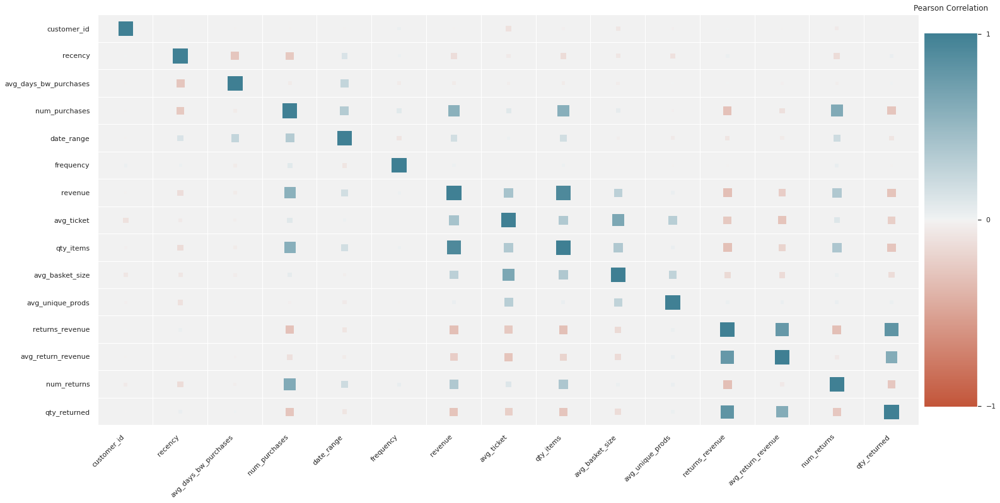

In [60]:
corrplot( df4.corr('pearson') )
plt.title('Pearson Correlation');

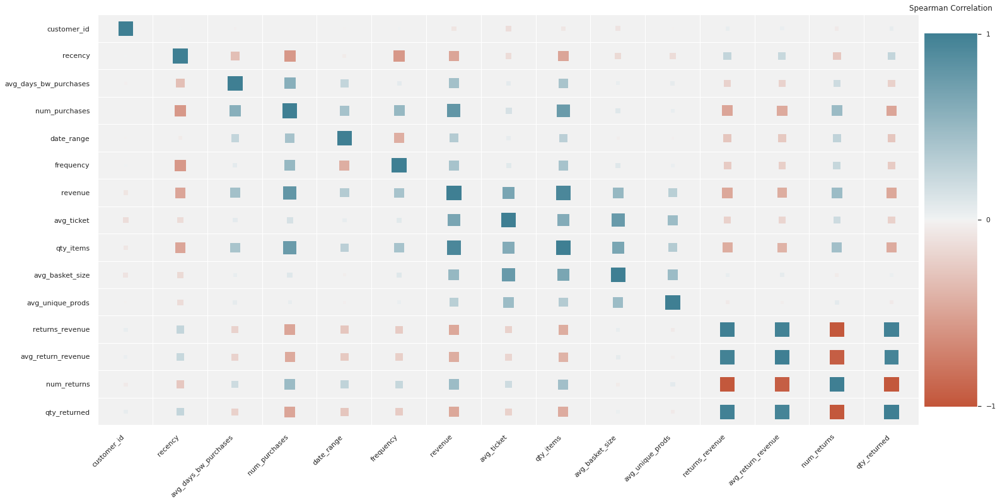

In [61]:
corrplot( df4.corr('spearman') )
plt.title('Spearman Correlation');

Some features are moderately to highly correlated, this could be an issue for supervised learning algorithms and therefore these features should be removed if we were using such class of algorithms.

However, since we are using clustering algorithms we can't take such action based on correlation since we might be losing information.

EDA however showed that some features might not help due to low variance:
 - Avg Ticket
 - Frequency

## 4.3. Feature Selection using Boruta

In [5]:
rf = RandomForestRegressor(n_jobs = -1, random_state = 42, max_depth = 8)

X = df4.drop(['revenue', 'country'], axis = 1).copy()
X = np.array(X)
y = df4[['revenue']]
y = np.array(y).ravel()

feat_selector = BorutaPy(rf, n_estimators='auto', verbose=2, random_state=1)
feat_selector.fit(X, y)


Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	13
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	13
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	13
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	13
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	13
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	13
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	13
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	2
Tentative: 	6
Rejected: 	5
Iteration: 	9 / 100
Confirmed: 	2
Tentative: 	6
Rejected: 	5
Iteration: 	10 / 100
Confirmed: 	2
Tentative: 	6
Rejected: 	5
Iteration: 	11 / 100
Confirmed: 	2
Tentative: 	6
Rejected: 	5
Iteration: 	12 / 100
Confirmed: 	5
Tentative: 	3
Rejected: 	5
Iteration: 	13 / 100
Confirmed: 	5
Tentative: 	3
Rejected: 	5
Iteration: 	14 / 100
Confirmed: 	5
Tentative: 	3
Rejected: 	5
Iteration: 	15 / 100
Confirmed: 	5
Tentative: 	3
Rejected: 	5
Iteration: 	16 / 100
Confirmed: 	5
Tentative: 	3
Rejected: 	5
Iteration:

BorutaPy(estimator=RandomForestRegressor(max_depth=8, n_estimators=46,
                                         n_jobs=-1,
                                         random_state=RandomState(MT19937) at 0x7F0995524140),
         n_estimators='auto',
         random_state=RandomState(MT19937) at 0x7F0995524140, verbose=2)

In [6]:
cols = df4.drop(['revenue', 'country'], axis = 1).columns.tolist()

sup = feat_selector.support_
cols
[cols[i] for i, _ in enumerate(cols) if sup[i]]

['num_purchases',
 'avg_ticket',
 'avg_basket_size',
 'returns_revenue',
 'num_returns']

In [8]:
rank = feat_selector.ranking_
importance = list(zip(rank, cols))
sorted(importance)


[(1, 'avg_basket_size'),
 (1, 'avg_ticket'),
 (1, 'num_purchases'),
 (1, 'num_returns'),
 (1, 'returns_revenue'),
 (2, 'qty_returned'),
 (3, 'avg_days_bw_purchases'),
 (4, 'avg_return_revenue'),
 (5, 'customer_id'),
 (6, 'frequency'),
 (7, 'avg_unique_prods'),
 (8, 'recency'),
 (9, 'date_range')]

I attempted using Boruta to evaluate features predictive power to select features for clustering. However, the algorithm didn't seem to find relevance in possibly important features

## 4.4 Embedded Space Analysis

### 4.4.1 Preprocessing

In [91]:
# df4.hist();

In [64]:
# # selecting numerical cols
# numerical_cols = df4.select_dtypes(include = ['int', 'float'] ).columns.tolist()
# numerical_cols.remove('customer_id')

# # applying min max transform
# ct = make_column_transformer( (MinMaxScaler(), numerical_cols) )
# df7 = ct.fit_transform(df4)

# testing other preprocessing 
# defining columns to be transformed
log_cols = ['recency','avg_days_bw_purchases'] 
min_max_cols = ['num_purchases','date_range','frequency','revenue', 'qty_items', 'avg_ticket','avg_basket_size','avg_unique_prods','returns_revenue','avg_return_revenue','num_returns','qty_returned']

log1p = FunctionTransformer(np.log1p)

# applying log and standard scaler to log cols
log_pipe = Pipeline(steps = [ ('log', log1p), ('std', StandardScaler()) ] )
ct_log = ColumnTransformer( transformers = [ ('log', log_pipe, log_cols) ] ) 

# applying min_max scaler to min_max cols
min_max_pipe = make_pipeline( MinMaxScaler() )

# Label Encoding and std_scaler to catgorical columns
label_pipe = make_pipeline( OrdinalEncoder(), MinMaxScaler() )

preprocessor = ColumnTransformer( 
    transformers=[ ('log', log_pipe, log_cols), 
    ('min_max', min_max_pipe, min_max_cols) ] )
df_proper = preprocessor.fit_transform(df4)

### 4.4.2 PCA

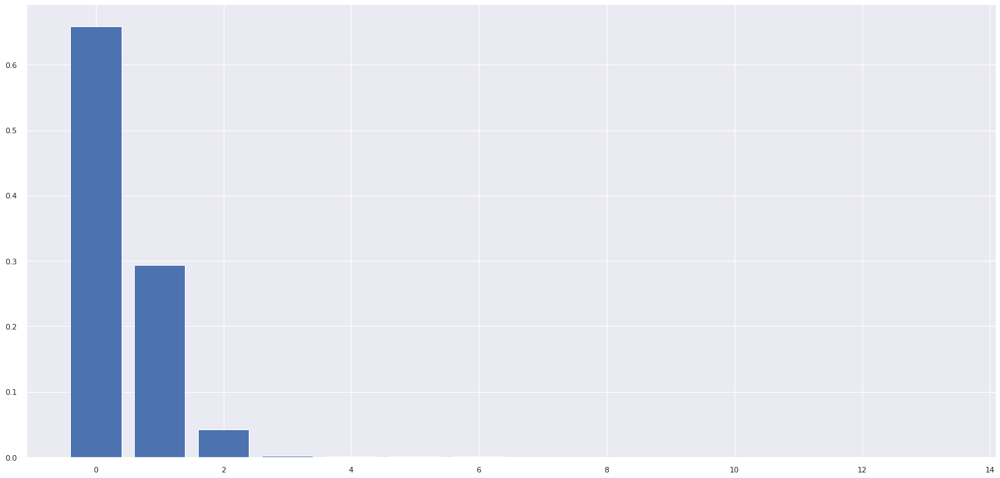

In [69]:
from sklearn.decomposition import PCA, KernelPCA

pca = PCA()
principal_components = pca.fit_transform(df_proper)

df_pca = pd.DataFrame( principal_components )

x = range(pca.n_components_)
y = pca.explained_variance_ratio_

plt.bar(x, y);

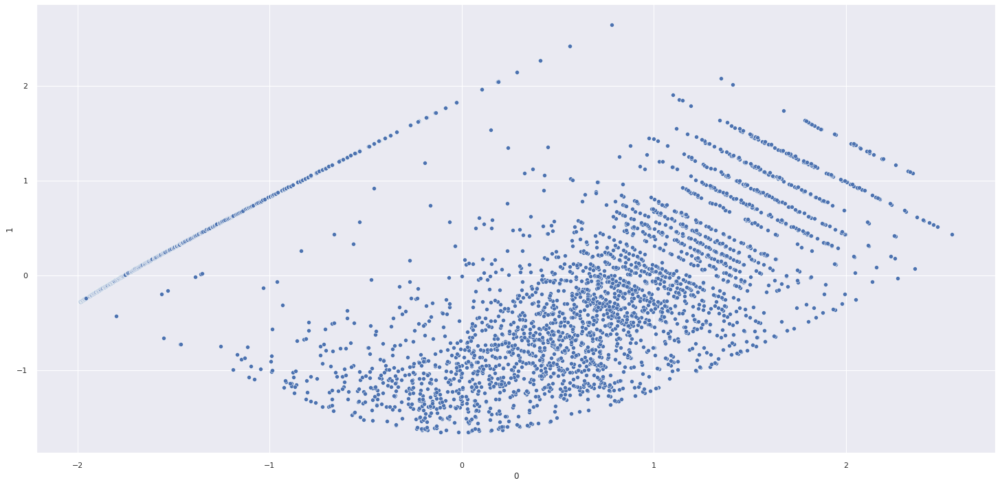

In [68]:
sns.scatterplot(data = df_pca, x = 0, y = 1);

### 4.4.3 UMAP Embedding

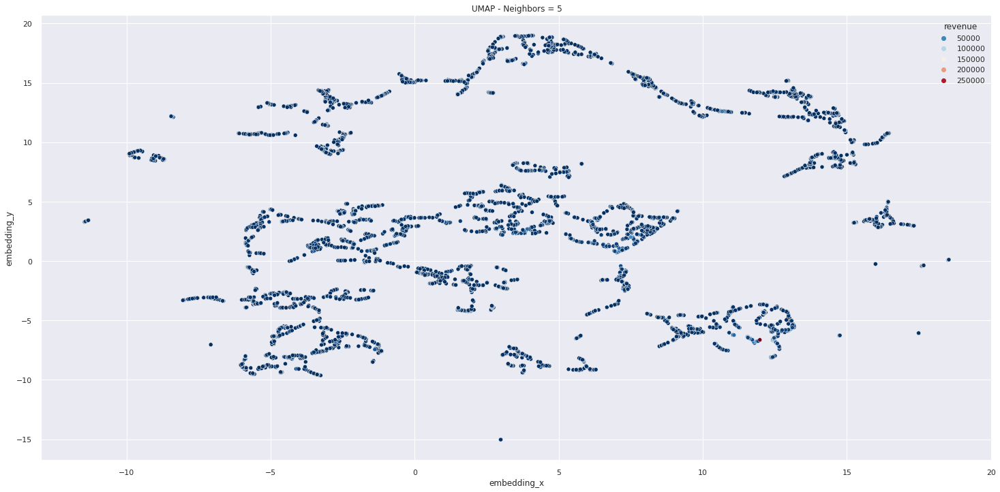

In [87]:
# Testing UMAP for 5, 15 and 25 neighbors
n_neighbors = 5
reducer = UMAP(n_neighbors = n_neighbors, random_state = 42)
embedding = reducer.fit_transform(df_proper)

df_viz = df4.copy()
df_viz['embedding_x'] = embedding[:,0]
df_viz['embedding_y'] = embedding[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap=True)
plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_viz, x = 'embedding_x', y = 'embedding_y', palette = cmap, hue = 'revenue' );

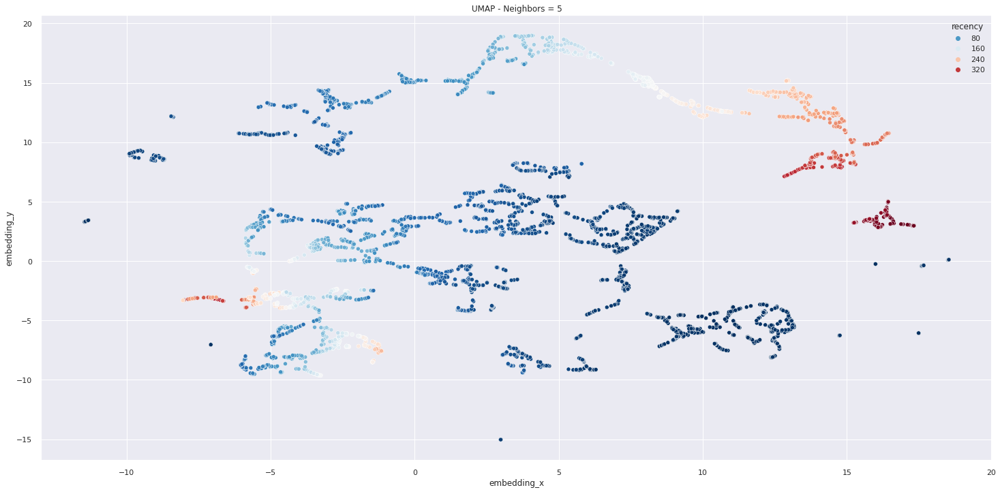

In [88]:
cmap = sns.color_palette('RdBu_r', as_cmap=True)
plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_viz, x = 'embedding_x', y = 'embedding_y', palette = cmap, hue = 'recency' );

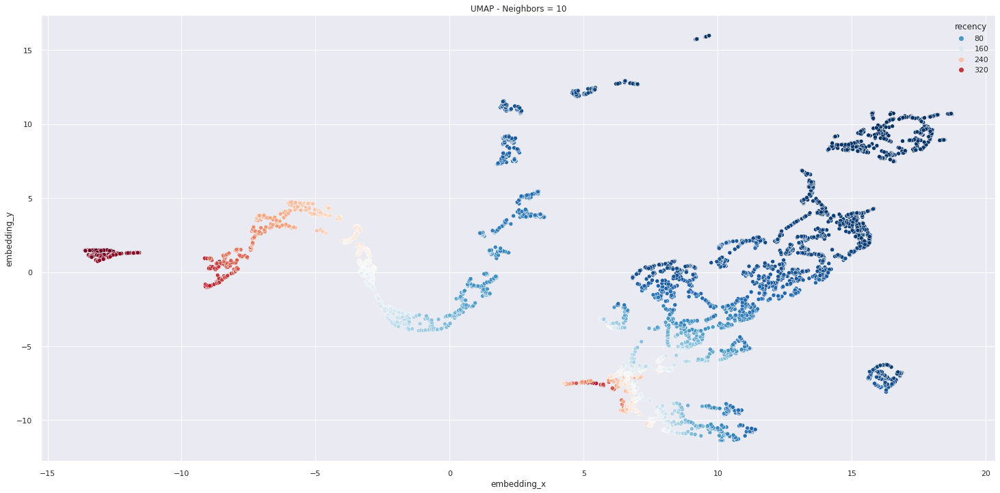

In [86]:
# Testing UMAP for 5, 15 and 25 neighbors
n_neighbors = 10
reducer = UMAP(n_neighbors = n_neighbors, random_state = 42)
embedding = reducer.fit_transform(df_proper)

df_viz = df4.copy()
df_viz['embedding_x'] = embedding[:,0]
df_viz['embedding_y'] = embedding[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap=True)
plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_viz, x = 'embedding_x', y = 'embedding_y', palette = cmap, hue = 'recency' );

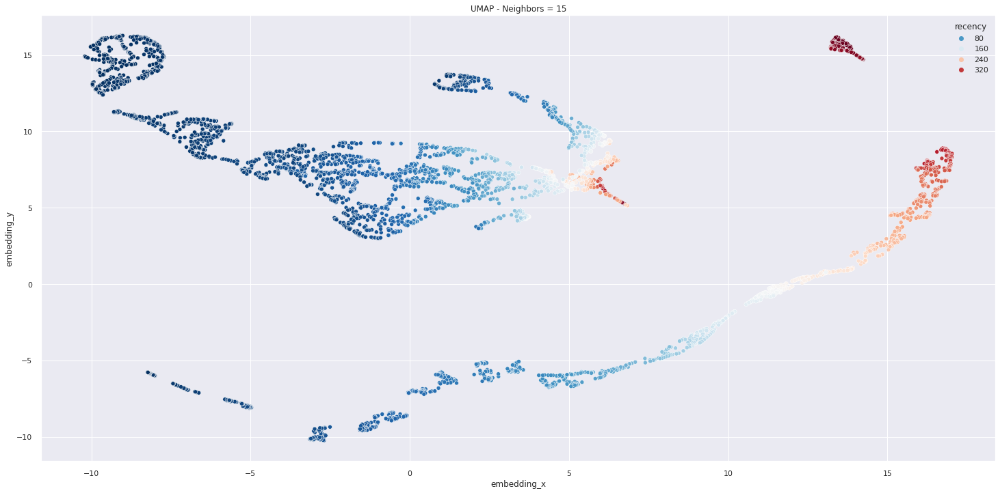

In [99]:
# Testing UMAP for 5, 15 and 25 neighbors
n_neighbors = 15
reducer = UMAP(n_neighbors = n_neighbors, random_state = 42)
embedding = reducer.fit_transform(df_proper)

df_viz = df4.copy()
df_viz['embedding_x'] = embedding[:,0]
df_viz['embedding_y'] = embedding[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap=True)
plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_viz, x = 'embedding_x', y = 'embedding_y', palette = cmap, hue = 'recency' );

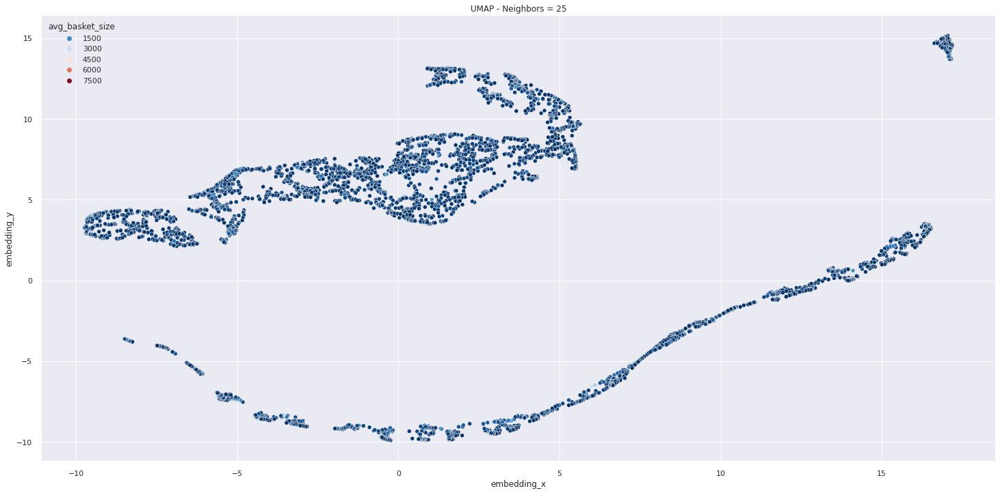

In [92]:
# Testing UMAP for 5, 15 and 25 neighbors
n_neighbors = 25
reducer = UMAP(n_neighbors = n_neighbors, random_state = 42)
embedding = reducer.fit_transform(df_proper)

df_viz = df4.copy()
df_viz['embedding_x'] = embedding[:,0]
df_viz['embedding_y'] = embedding[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap=True)
plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_viz, x = 'embedding_x', y = 'embedding_y', palette = cmap, hue = 'avg_basket_size' );

#### Quick Test UMAP MinMax

In [109]:
# selecting numerical cols
# numerical_cols = df4.select_dtypes(include = ['int', 'float'] ).columns.tolist()
# numerical_cols.remove('customer_id')

numerical_cols = ['recency','avg_days_bw_purchases'] + ['num_purchases','date_range','frequency','revenue', 'qty_items', 'avg_ticket','avg_basket_size','avg_unique_prods','returns_revenue','avg_return_revenue','num_returns','qty_returned']
# applying min max transform
ct = make_column_transformer( (MinMaxScaler(), numerical_cols) )
df_prep = ct.fit_transform(df4)

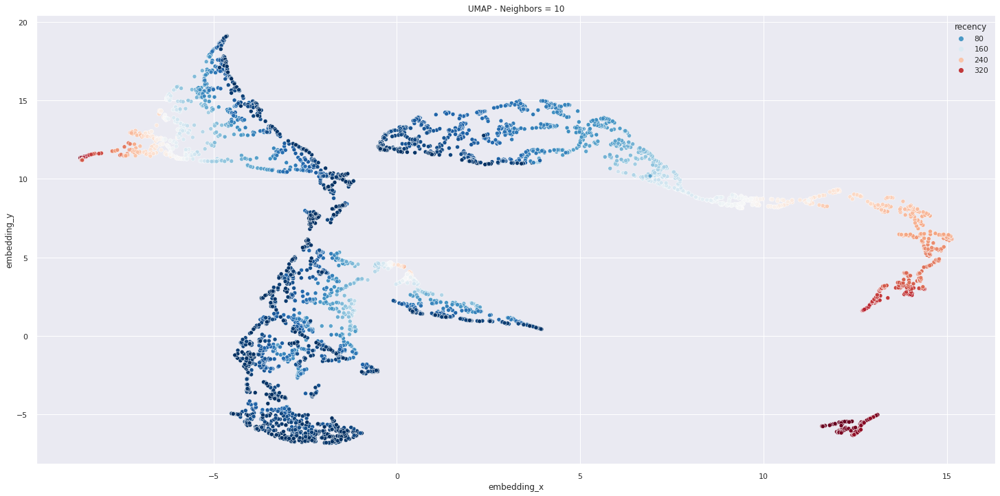

In [110]:
# Testing UMAP for 5, 15 and 25 neighbors
n_neighbors = 10
reducer = UMAP(n_neighbors = n_neighbors, random_state = 42)
embedding = reducer.fit_transform(df_prep)

df_viz = df4.copy()
df_viz['embedding_x'] = embedding[:,0]
df_viz['embedding_y'] = embedding[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap=True)
plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_viz, x = 'embedding_x', y = 'embedding_y', palette = cmap, hue = 'recency' );

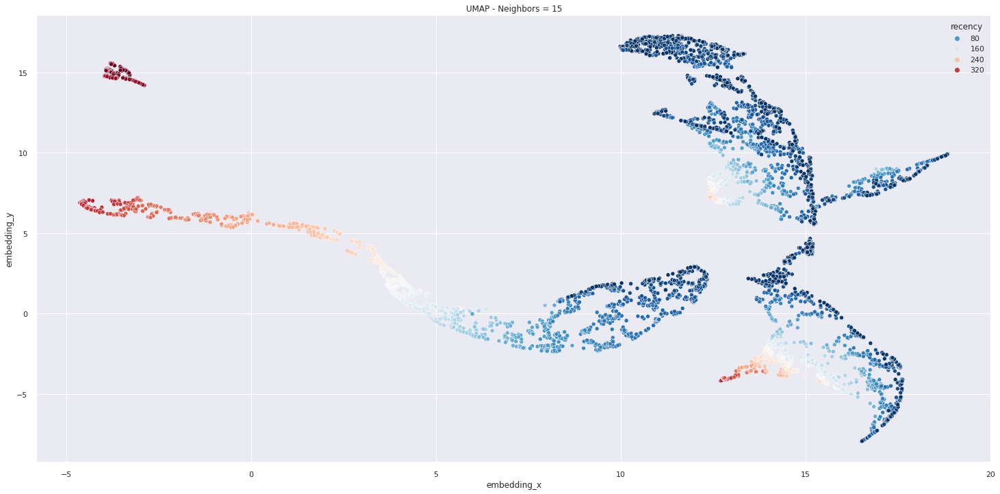

In [111]:
# Testing UMAP for 5, 15 and 25 neighbors
n_neighbors = 15
reducer = UMAP(n_neighbors = n_neighbors, random_state = 42)
embedding = reducer.fit_transform(df_prep)

df_viz = df4.copy()
df_viz['embedding_x'] = embedding[:,0]
df_viz['embedding_y'] = embedding[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap=True)
plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_viz, x = 'embedding_x', y = 'embedding_y', palette = cmap, hue = 'recency' );

Log Tranform + StdScaler did help separate recency and avg_days_between_purchases

### 4.4.4 TSNE

In [112]:
from sklearn.manifold import TSNE

tsne = TSNE(learning_rate= 'auto', random_state = 42, init = 'pca')

df_tsne = pd.DataFrame( tsne.fit_transform(df_proper) )

/home/humberto/.pyenv/versions/3.8.0/envs/insiders/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


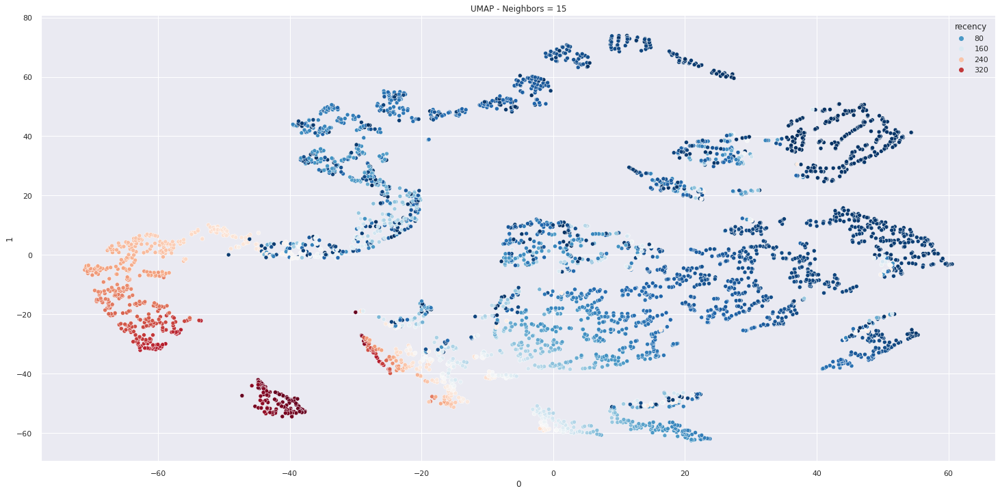

In [117]:
df_viz = df4.copy()
df_viz = pd.concat( [df_viz, df_tsne], axis = 1 )

cmap = sns.color_palette('RdBu_r', as_cmap=True)
plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_viz, x = 0, y = 1, palette = cmap, hue = 'recency' );

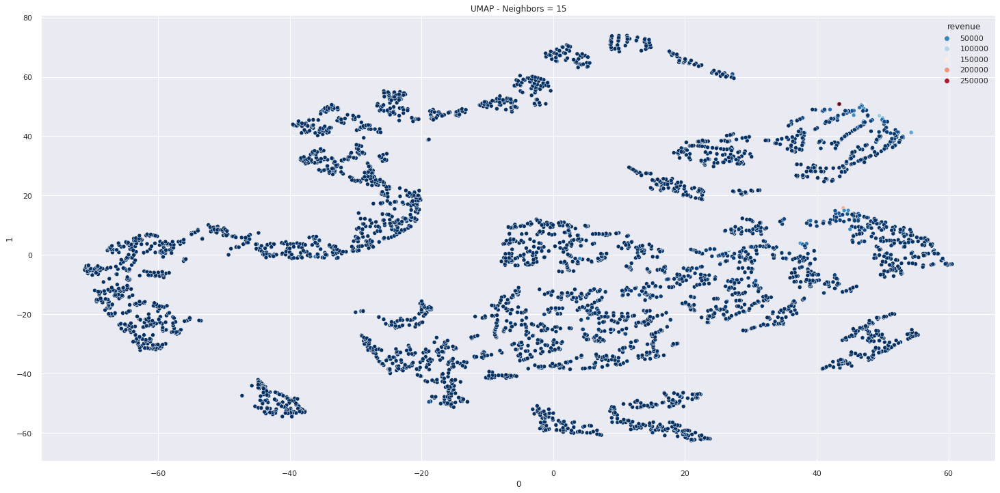

In [127]:
df_viz = df4.copy()
df_viz = pd.concat( [df_viz, df_tsne], axis = 1 )

cmap = sns.color_palette('RdBu_r', as_cmap=True)
plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_viz, x = 0, y = 1, palette = cmap, hue = 'revenue' );

Like in UMAP we sell good separation concerning recency, but not with respect to revenue

### 4.4.5 Tree Embedding

#### 4.4.4.1 Random Trees Embedding

In [4]:
from sklearn.ensemble import RandomTreesEmbedding

In [99]:
# reducing number of estimators

random_trees = RandomTreesEmbedding(n_estimators = 10, random_state = 42)

X = df4.drop(['country'], axis = 1 ).copy()

df_emb = random_trees.fit_transform(X)

df_emb = pd.DataFrame( df_emb.toarray() )

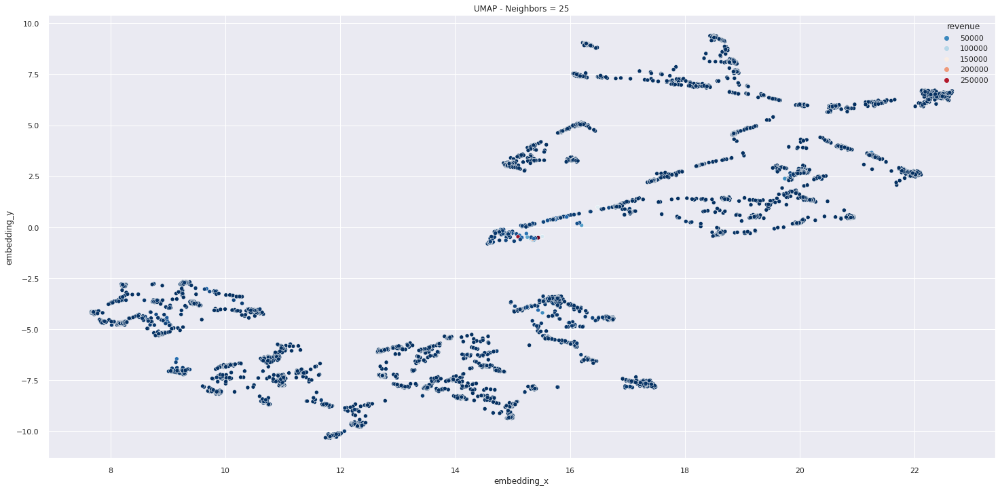

In [102]:
n_neighbors = 25

reducer = UMAP(n_neighbors=n_neighbors, random_state = 42)
embedding = reducer.fit_transform(df_emb)

df_tree = df4.copy()
df_tree['embedding_x'] = embedding[:,0]
df_tree['embedding_y'] = embedding[:,1]

cmap = sns.color_palette( 'RdBu_r', as_cmap= True)
plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', palette = cmap, hue = 'revenue'  );

In [103]:
# incrasing number of estimators

random_trees = RandomTreesEmbedding(n_estimators = 100, random_state = 42)

X = df4.drop(['country'], axis = 1 ).copy()

df_emb = random_trees.fit_transform(X)

df_emb = pd.DataFrame( df_emb.toarray() )

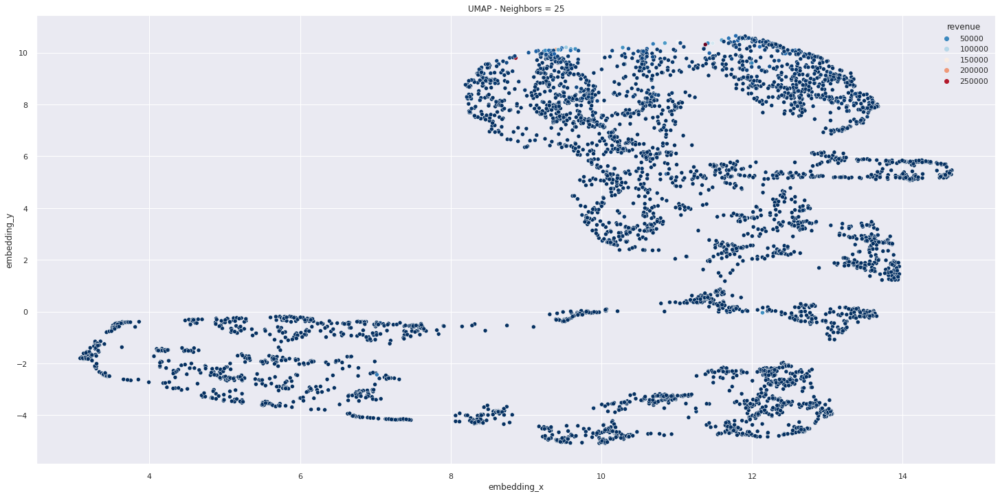

In [104]:
n_neighbors = 25

reducer = UMAP(n_neighbors=n_neighbors, random_state = 42)
reducer = UMAP(n_neighbors=n_neighbors, random_state = 42)
embedding = reducer.fit_transform(df_emb)

df_tree = df4.copy()
df_tree['embedding_x'] = embedding[:,0]
df_tree['embedding_y'] = embedding[:,1]

cmap = sns.color_palette( 'RdBu_r', as_cmap= True)
plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', palette = cmap, hue = 'revenue'  );

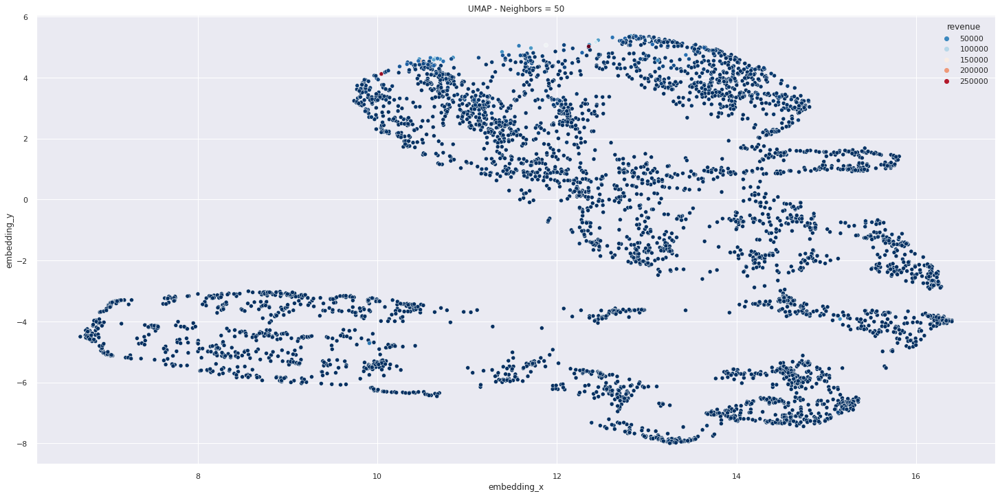

In [23]:
n_neighbors = 50

reducer = UMAP(n_neighbors=n_neighbors, random_state = 42)
embedding = reducer.fit_transform(df_emb)

df_tree = df4.copy()
df_tree['embedding_x'] = embedding[:,0]
df_tree['embedding_y'] = embedding[:,1]

cmap = sns.color_palette( 'RdBu_r', as_cmap= True)
plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', palette = cmap, hue = 'revenue'  );

#### Using rescaled data

In [25]:
random_trees = RandomTreesEmbedding(n_estimators = 100, random_state = 42)

tree_embedded = random_trees.fit_transform(df_proper)
tree_embedded = pd.DataFrame(tree_embedded.toarray())

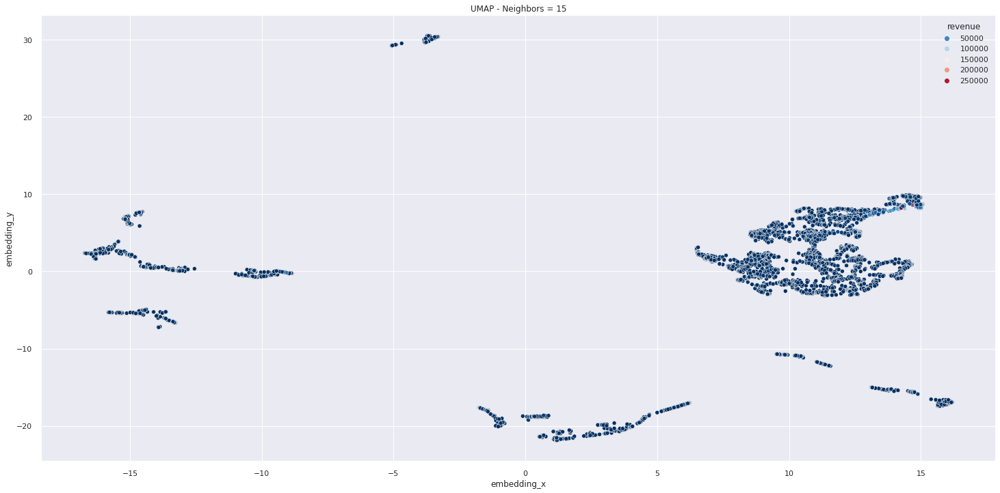

In [33]:
n_neighbors = 15

reducer = UMAP(n_neighbors=n_neighbors, random_state = 42)
embedding = reducer.fit_transform(tree_embedded)

df_tree = df4.copy()
df_tree['embedding_x'] = embedding[:,0]
df_tree['embedding_y'] = embedding[:,1]

cmap = sns.color_palette( 'RdBu_r', as_cmap= True)
plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', palette = cmap, hue = 'revenue'  ); # hue = 'cluster'

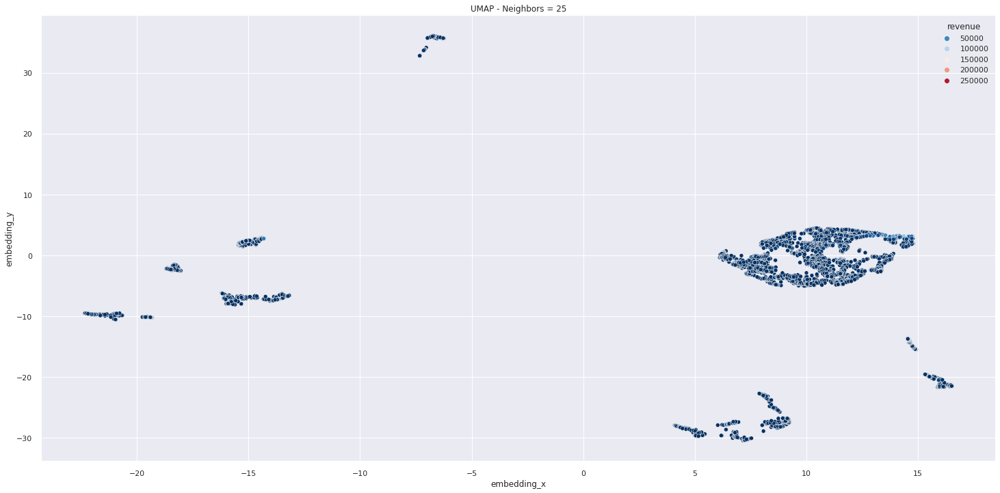

In [27]:
n_neighbors = 25

reducer = UMAP(n_neighbors=n_neighbors, random_state = 42)
embedding = reducer.fit_transform(tree_embedded)

df_tree = df4.copy()
df_tree['embedding_x'] = embedding[:,0]
df_tree['embedding_y'] = embedding[:,1]

cmap = sns.color_palette( 'RdBu_r', as_cmap= True)
plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', palette = cmap, hue = 'revenue'  ); # hue = 'cluster'

In [32]:
tree_embedded.shape
df_emb.shape

(4314, 1739)

#### 4.4.4.2 Random Forest Target Embedding

#### Most Features

In [128]:
df4.head()

,customer_id,country,recency,avg_days_bw_purchases,num_purchases,date_range,frequency,revenue,avg_ticket,qty_items,avg_basket_size,avg_unique_prods,returns_revenue,avg_return_revenue,num_returns,qty_returned
0,17850,United Kingdom,373,1.000000,34,1,34.000000,5288.63,155.547941,1693,48.371429,8.735294,-102.58,-6.838667,15.0,-40.0
1,13047,United Kingdom,57,52.833333,9,317,0.028391,3089.10,343.233333,1355,84.687500,19.000000,-143.49,-6.238696,23.0,-35.0
2,12583,France,3,26.500000,15,371,0.040431,6629.34,441.956000,4978,292.823529,15.466667,-76.04,-25.346667,3.0,-50.0
3,13748,United Kingdom,96,92.666667,5,278,0.017986,948.25,189.650000,439,87.800000,5.600000,0.00,0.000000,0.0,0.0
4,15100,United Kingdom,334,20.000000,3,40,0.075000,635.10,211.700000,58,9.666667,1.000000,-240.90,-80.300000,3.0,-22.0


In [129]:
# defining independent and dependent variable
X = df4.drop( ['customer_id', 'country', 'revenue'], axis = 1 ).copy()
y = df4['revenue']

rf = RandomForestRegressor(n_estimators = 100,  random_state = 42) #min_samples_leaf = 10,
rf.fit(X, y)

# get leafs for each observation
df_leaf = pd.DataFrame(rf.apply(X))

# droping country doesn't work
# increasing n_estimators to 1000 doesn't work
# reducing maxdepth 8

In [130]:
sorted( list(zip(rf.feature_importances_, rf.feature_names_in_)), reverse = True )

[(0.8820419964913292, 'qty_items'),
 (0.02408347693872147, 'avg_ticket'),
 (0.023692139428931062, 'num_returns'),
 (0.013879928205749972, 'returns_revenue'),
 (0.012695615882153522, 'avg_unique_prods'),
 (0.012038422078960961, 'qty_returned'),
 (0.006698409687289645, 'num_purchases'),
 (0.005324307342855562, 'recency'),
 (0.004930020847481924, 'frequency'),
 (0.004851673609335329, 'avg_return_revenue'),
 (0.004180456634495663, 'avg_basket_size'),
 (0.0029654413458839236, 'avg_days_bw_purchases'),
 (0.0026181115068117287, 'date_range')]

In [131]:
df_leaf.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,4592,4796,4798,4810,4900,4819,4630,4586,4777,5028,5024,4457,4820,4963,4792,4877,4717,4938,4567,4841,4828,4790,4914,4804,4400,4923,4437,4966,4797,4438,4349,5008,5039,4990,4591,4803,4835,5087,4943,4768,4755,4813,4240,4934,4951,4753,4846,4968,4733,4489,4888,4851,4716,4703,4789,5005,4738,4882,4961,4660,4957,5007,4764,4801,5109,4964,4939,4550,4961,4989,4469,4736,4831,4751,4962,4627,4574,4752,4764,5008,4456,4723,4953,4825,4996,4985,4394,4806,4683,4664,4786,4968,4707,4595,5088,4754,4363,4869,4747,5015
1,4656,4844,4530,4827,3982,4884,4377,4684,4821,4643,4632,4506,4259,4583,4750,4273,4687,4283,4680,4614,4450,4733,4382,4875,4433,4440,4382,4536,4686,4389,4458,4634,3910,4618,4150,4586,4513,4687,4544,4493,4566,4486,4761,4250,4681,4555,4763,3929,4780,4441,4575,4762,4612,4774,4774,4977,4173,4607,4514,4795,4471,4654,4138,4743,4367,4560,4209,4264,4598,4598,4758,4763,4427,4722,4564,4596,4363,4833,4391,4529,4490,4677,4585,4775,4502,4503,4652,4828,4669,4630,4774,4857,4165,4582,4540,4724,4428,4395,4654,4438
2,5105,5292,5150,5318,5259,5302,5143,5174,5259,5155,5222,5241,5180,5274,5217,5132,5179,5144,5149,5297,5082,5147,5069,5250,5285,5235,5224,5241,5168,5200,5307,5382,5146,5117,5131,5206,5250,5363,5109,5240,5071,5214,5225,5267,5341,5194,5264,5114,5181,5271,5375,5305,5222,5090,5177,5374,5270,4992,5226,5257,5271,5109,5254,5281,5238,5206,5229,5108,5019,5162,5205,5228,5177,5175,5092,5180,5223,5275,5289,5097,5171,5245,5280,5278,5254,5052,5178,5274,5173,5099,5297,5309,5226,5229,5232,5247,5294,5171,5252,5238
3,2741,3892,3614,3430,3357,2976,3353,3025,3523,3309,3268,3450,3390,3362,3372,3326,3346,3522,3038,2777,3536,3496,3325,3430,3515,3641,2663,3727,2553,3154,3569,2969,3674,3666,2859,3489,3766,3394,3264,3367,3612,3506,3421,3339,3504,3445,3103,3690,2848,3552,3471,3801,3345,3232,3320,2781,2777,2919,3496,3693,3706,3770,2760,3531,3264,3118,3403,3425,3241,2730,3591,3384,3607,3507,3718,2824,3564,3374,3432,3389,3683,3393,3578,2838,3415,3284,3441,3293,3350,3281,3151,2818,3160,3192,3312,3027,3375,3665,3664,3709
4,1466,1799,1395,1165,1061,1259,1099,1243,1171,712,1189,1150,1256,1146,1093,1023,1183,1174,742,741,1120,936,1314,1200,1082,1168,1440,1258,1883,1192,1220,1242,1143,1194,1909,1202,1218,1488,1182,1235,1233,1097,1386,1224,1164,1002,2096,1191,1133,1234,1172,1195,1208,1127,1197,822,1782,1928,1052,1053,1163,1260,1202,1219,2141,1505,768,896,1468,634,934,1170,1101,1157,1134,1964,1167,1264,1174,1118,1597,1512,1122,914,1111,1677,1153,1210,1078,1128,1053,707,1183,1234,993,1484,1118,1123,1197,1206


In [133]:
# df_tree.sort_values('num_purchases', ascending = False).head(10)

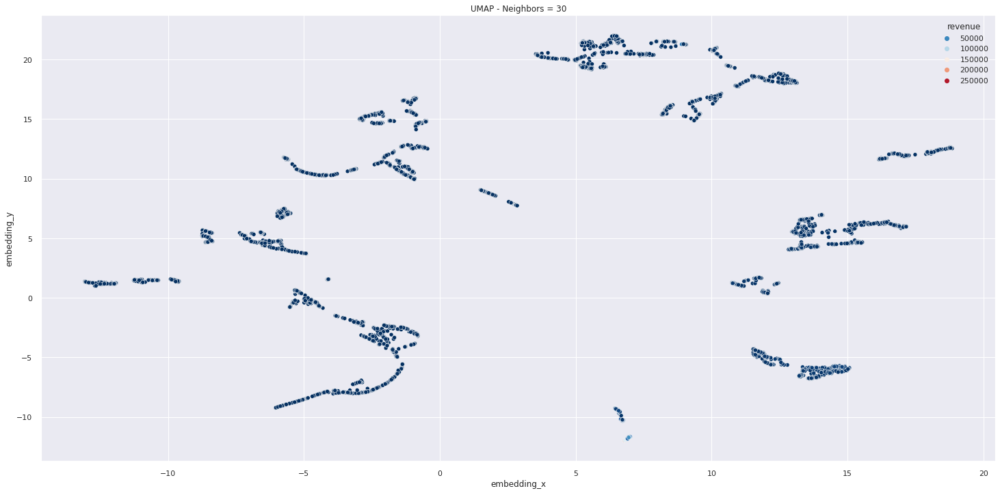

In [132]:
n_neighbors = 30
umap = UMAP(n_neighbors = n_neighbors, random_state = 42) 
res_umap = umap.fit_transform(df_leaf)

df_tree = df4.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);


/home/humberto/.pyenv/versions/3.8.0/envs/insiders/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:260: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


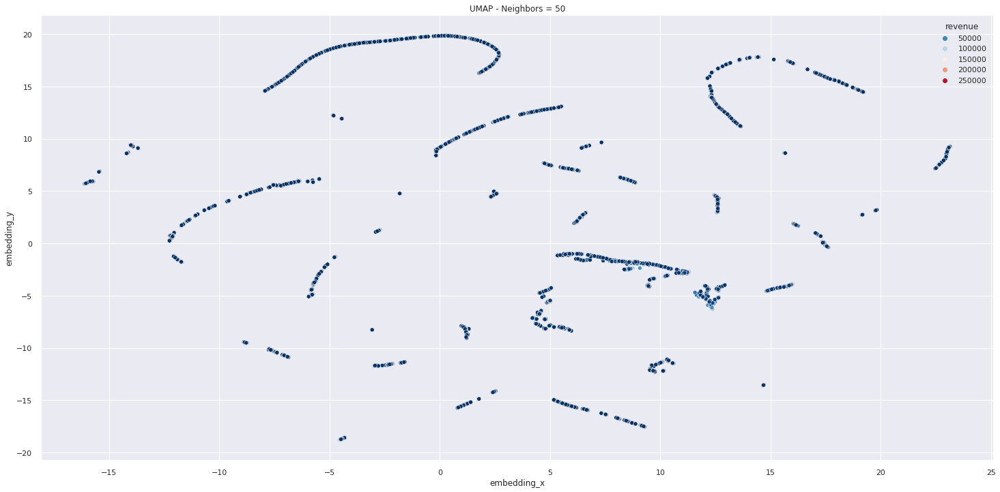

In [26]:
n_neighbors = 50
reducer = UMAP(n_neighbors = n_neighbors, random_state = 42) 
res_umap = reducer.fit_transform(df_leaf)

df_tree = df4.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);

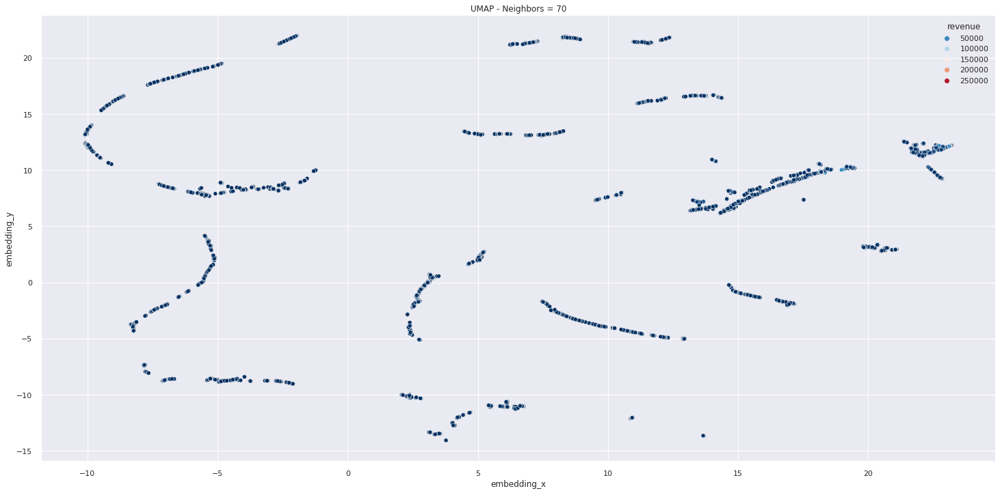

In [89]:
n_neighbors = 70
umap = UMAP(n_neighbors = n_neighbors, random_state = 42) 
res_umap = umap.fit_transform(df_leaf)

df_tree = df4.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);


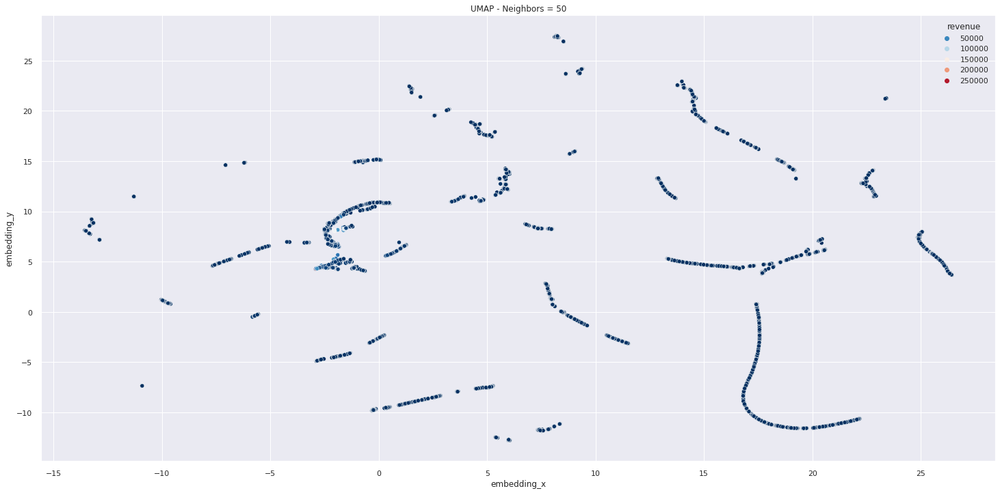

In [80]:
n_neighbors = 50
umap = UMAP(n_neighbors = n_neighbors, random_state = 42, metric = 'euclidean') 
res_umap = umap.fit_transform(leaf)

df_tree = df4.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);


In [ ]:
# recency_days	qtde_invoices	qtde_items	qtde_products	avg_ticket	avg_recency_days	frequency	qtde_returns	avg_basket_size	avg_unique_basket_size

# max leafs +- 3800

#### Less Features

Testing tree embedding with less features and other distance metrics

In [134]:
cols_selected = ['qty_items','avg_ticket','num_returns','returns_revenue','avg_unique_prods','qty_returned','num_purchases','recency','frequency']# defining independent and dependent variable
X = df4[cols_selected].copy()
y = df4['revenue']

rf = RandomForestRegressor(random_state = 42) #, min_samples_split = 20
rf.fit(X, y)

# get leafs for each observation
df_leaf = pd.DataFrame( rf.apply(X) )

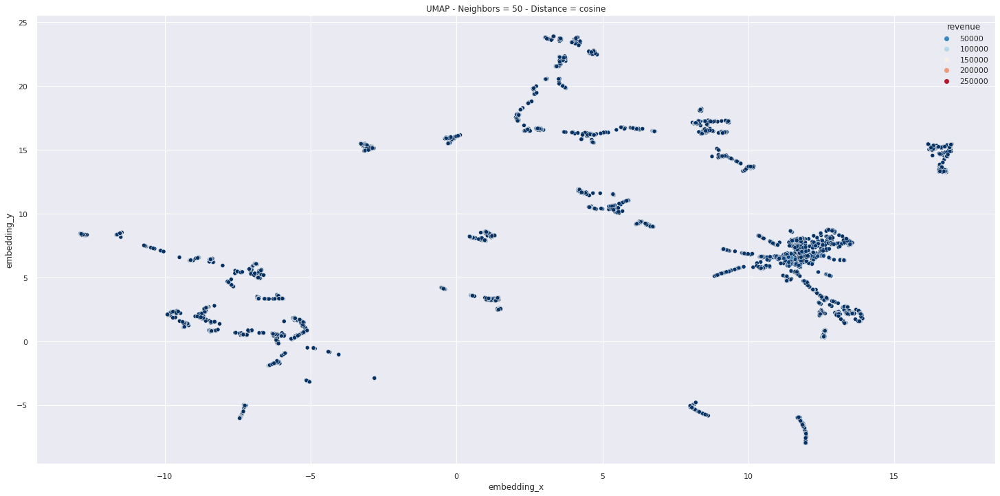

In [182]:
# Cosine Distance 
n_neighbors = 50
umap = UMAP(n_neighbors = n_neighbors, random_state = 42, metric = 'cosine')  # mahalanobis n funcionou
res_umap = umap.fit_transform(df_leaf)
metric = umap.metric

df_tree = df4.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {} - Distance = {}'.format(n_neighbors, metric) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);

In [178]:
df_tree.sort_values('revenue', ascending = False).head(10)

,customer_id,country,recency,avg_days_bw_purchases,num_purchases,date_range,frequency,revenue,avg_ticket,qty_items,avg_basket_size,avg_unique_prods,returns_revenue,avg_return_revenue,num_returns,qty_returned,embedding_x,embedding_y
844,14646,Netherlands,2,8.022727,73,353,0.206799,278778.02,3818.876986,197132,2663.945946,28.273973,-360.00,-180.000000,2.0,-288.0,11.502449,6.615453
419,18102,United Kingdom,1,14.680000,60,367,0.163488,259657.30,4327.621667,64124,1068.733333,7.183333,0.00,0.000000,0.0,0.0,11.540702,6.710783
372,17450,United Kingdom,9,13.807692,46,359,0.128134,189735.53,4124.685435,69041,1409.000000,7.304348,-4815.26,-1605.086667,3.0,-952.0,11.569393,6.699728
65,14911,EIRE,2,2.861538,199,372,0.534946,133007.13,668.377538,77181,317.617284,28.492462,-7443.59,-33.379327,223.0,-3332.0,11.522726,6.661098
912,12415,Australia,25,22.357143,20,313,0.063898,123638.18,6181.909000,77242,3218.416667,35.750000,-926.35,-15.186066,61.0,-427.0,11.591179,6.674881
199,14156,EIRE,10,8.619048,55,362,0.151934,114505.32,2081.914909,57026,877.323077,25.327273,-2874.31,-151.279474,19.0,-859.0,11.320277,6.731628
15,17511,United Kingdom,3,13.740741,31,371,0.083558,88138.20,2843.167742,63014,1400.311111,31.064516,-2924.18,-26.343964,111.0,-1535.0,11.398486,6.597251
800,16684,United Kingdom,5,23.600000,28,354,0.079096,65920.12,2354.290000,49391,1646.366667,9.892857,-733.44,-244.480000,3.0,-864.0,11.411681,6.603209
35,13694,United Kingdom,4,10.882353,50,370,0.135135,62924.10,1258.482000,61808,1084.350877,11.360000,-2115.52,-151.108571,14.0,-1504.0,11.511019,6.589230
8,15311,United Kingdom,1,4.191011,91,373,0.243968,59419.34,652.959780,37720,319.661017,25.901099,-1348.56,-12.040714,112.0,-474.0,11.650355,6.726884


In [181]:
# df_tree.sort_values('embedding_x', ascending = True).head(10)

/home/humberto/.pyenv/versions/3.8.0/envs/insiders/lib/python3.8/site-packages/umap/umap_.py:1802: UserWarning: gradient function is not yet implemented for jaccard distance metric; inverse_transform will be unavailable
  warn(


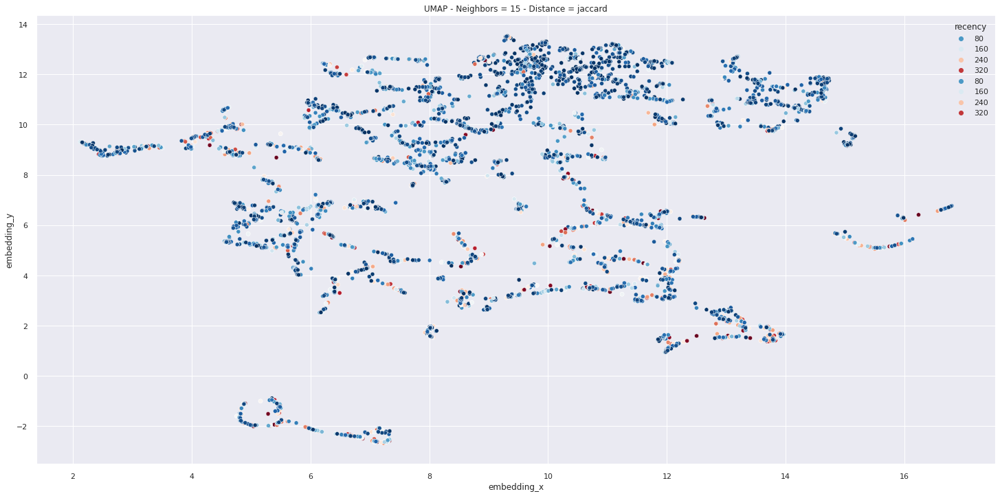

In [176]:
# Jaccard Distance

n_neighbors = 15
umap = UMAP(n_neighbors = n_neighbors, random_state = 42, metric = 'jaccard')  # mahalanobis n funcionou
res_umap = umap.fit_transform(df_leaf)
metric = umap.metric

df_tree = df4.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {} - Distance = {}'.format(n_neighbors, metric) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'recency', palette = cmap);

In [175]:
df_tree.sort_values('revenue', ascending = False).head(10)

,customer_id,country,recency,avg_days_bw_purchases,num_purchases,date_range,frequency,revenue,avg_ticket,qty_items,avg_basket_size,avg_unique_prods,returns_revenue,avg_return_revenue,num_returns,qty_returned,embedding_x,embedding_y
844,14646,Netherlands,2,8.022727,73,353,0.206799,278778.02,3818.876986,197132,2663.945946,28.273973,-360.00,-180.000000,2.0,-288.0,9.901376,13.257434
419,18102,United Kingdom,1,14.680000,60,367,0.163488,259657.30,4327.621667,64124,1068.733333,7.183333,0.00,0.000000,0.0,0.0,9.969779,13.313319
372,17450,United Kingdom,9,13.807692,46,359,0.128134,189735.53,4124.685435,69041,1409.000000,7.304348,-4815.26,-1605.086667,3.0,-952.0,9.896110,13.278388
65,14911,EIRE,2,2.861538,199,372,0.534946,133007.13,668.377538,77181,317.617284,28.492462,-7443.59,-33.379327,223.0,-3332.0,9.957540,13.315072
912,12415,Australia,25,22.357143,20,313,0.063898,123638.18,6181.909000,77242,3218.416667,35.750000,-926.35,-15.186066,61.0,-427.0,9.902721,13.246406
199,14156,EIRE,10,8.619048,55,362,0.151934,114505.32,2081.914909,57026,877.323077,25.327273,-2874.31,-151.279474,19.0,-859.0,9.912790,13.258581
15,17511,United Kingdom,3,13.740741,31,371,0.083558,88138.20,2843.167742,63014,1400.311111,31.064516,-2924.18,-26.343964,111.0,-1535.0,9.968837,13.297587
800,16684,United Kingdom,5,23.600000,28,354,0.079096,65920.12,2354.290000,49391,1646.366667,9.892857,-733.44,-244.480000,3.0,-864.0,9.873857,12.971510
35,13694,United Kingdom,4,10.882353,50,370,0.135135,62924.10,1258.482000,61808,1084.350877,11.360000,-2115.52,-151.108571,14.0,-1504.0,9.944322,13.268776
8,15311,United Kingdom,1,4.191011,91,373,0.243968,59419.34,652.959780,37720,319.661017,25.901099,-1348.56,-12.040714,112.0,-474.0,9.948548,13.297806


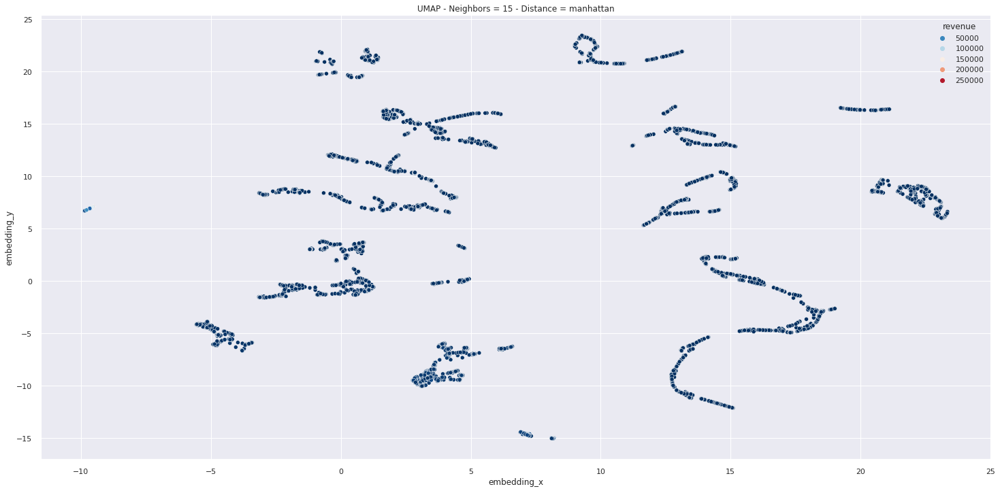

In [185]:
# Manhattan Distance

n_neighbors = 15
umap = UMAP(n_neighbors = n_neighbors, random_state = 42, metric = 'manhattan')  # mahalanobis n funcionou
res_umap = umap.fit_transform(df_leaf)
metric = umap.metric

df_tree = df4.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {} - Distance = {}'.format(n_neighbors, metric) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);

In [171]:
df_tree.sort_values('revenue', ascending = False).head(10)

,customer_id,country,recency,avg_days_bw_purchases,num_purchases,date_range,frequency,revenue,avg_ticket,qty_items,avg_basket_size,avg_unique_prods,returns_revenue,avg_return_revenue,num_returns,qty_returned,embedding_x,embedding_y
844,14646,Netherlands,2,8.022727,73,353,0.206799,278778.02,3818.876986,197132,2663.945946,28.273973,-360.00,-180.000000,2.0,-288.0,-9.527265,7.069028
419,18102,United Kingdom,1,14.680000,60,367,0.163488,259657.30,4327.621667,64124,1068.733333,7.183333,0.00,0.000000,0.0,0.0,-9.527138,7.068988
372,17450,United Kingdom,9,13.807692,46,359,0.128134,189735.53,4124.685435,69041,1409.000000,7.304348,-4815.26,-1605.086667,3.0,-952.0,-9.527414,7.068754
65,14911,EIRE,2,2.861538,199,372,0.534946,133007.13,668.377538,77181,317.617284,28.492462,-7443.59,-33.379327,223.0,-3332.0,-9.523754,7.073137
912,12415,Australia,25,22.357143,20,313,0.063898,123638.18,6181.909000,77242,3218.416667,35.750000,-926.35,-15.186066,61.0,-427.0,-9.533222,7.063769
199,14156,EIRE,10,8.619048,55,362,0.151934,114505.32,2081.914909,57026,877.323077,25.327273,-2874.31,-151.279474,19.0,-859.0,-9.541841,7.051040
15,17511,United Kingdom,3,13.740741,31,371,0.083558,88138.20,2843.167742,63014,1400.311111,31.064516,-2924.18,-26.343964,111.0,-1535.0,-9.520920,7.074093
800,16684,United Kingdom,5,23.600000,28,354,0.079096,65920.12,2354.290000,49391,1646.366667,9.892857,-733.44,-244.480000,3.0,-864.0,-9.549254,7.042093
35,13694,United Kingdom,4,10.882353,50,370,0.135135,62924.10,1258.482000,61808,1084.350877,11.360000,-2115.52,-151.108571,14.0,-1504.0,-9.534281,7.059819
8,15311,United Kingdom,1,4.191011,91,373,0.243968,59419.34,652.959780,37720,319.661017,25.901099,-1348.56,-12.040714,112.0,-474.0,-9.577688,7.007822


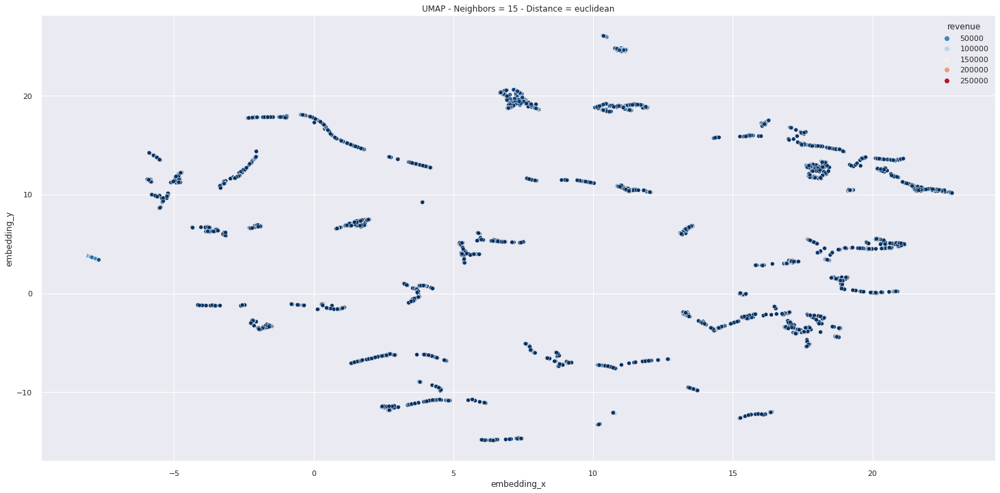

In [183]:
# Euclidean distance
n_neighbors = 15
umap = UMAP(n_neighbors = n_neighbors, random_state = 42) 
res_umap = umap.fit_transform(df_leaf)
metric = umap.metric 

df_tree = df4.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {} - Distance = {}'.format(n_neighbors, metric) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);


In [184]:
df_tree.sort_values('revenue', ascending = False).head(10)

,customer_id,country,recency,avg_days_bw_purchases,num_purchases,date_range,frequency,revenue,avg_ticket,qty_items,avg_basket_size,avg_unique_prods,returns_revenue,avg_return_revenue,num_returns,qty_returned,embedding_x,embedding_y
844,14646,Netherlands,2,8.022727,73,353,0.206799,278778.02,3818.876986,197132,2663.945946,28.273973,-360.00,-180.000000,2.0,-288.0,-8.196600,3.903471
419,18102,United Kingdom,1,14.680000,60,367,0.163488,259657.30,4327.621667,64124,1068.733333,7.183333,0.00,0.000000,0.0,0.0,-8.193848,3.900485
372,17450,United Kingdom,9,13.807692,46,359,0.128134,189735.53,4124.685435,69041,1409.000000,7.304348,-4815.26,-1605.086667,3.0,-952.0,-8.174791,3.881437
65,14911,EIRE,2,2.861538,199,372,0.534946,133007.13,668.377538,77181,317.617284,28.492462,-7443.59,-33.379327,223.0,-3332.0,-8.188792,3.895290
912,12415,Australia,25,22.357143,20,313,0.063898,123638.18,6181.909000,77242,3218.416667,35.750000,-926.35,-15.186066,61.0,-427.0,-8.197972,3.904573
199,14156,EIRE,10,8.619048,55,362,0.151934,114505.32,2081.914909,57026,877.323077,25.327273,-2874.31,-151.279474,19.0,-859.0,-8.170307,3.876618
15,17511,United Kingdom,3,13.740741,31,371,0.083558,88138.20,2843.167742,63014,1400.311111,31.064516,-2924.18,-26.343964,111.0,-1535.0,-8.183316,3.889865
800,16684,United Kingdom,5,23.600000,28,354,0.079096,65920.12,2354.290000,49391,1646.366667,9.892857,-733.44,-244.480000,3.0,-864.0,-8.123022,3.828737
35,13694,United Kingdom,4,10.882353,50,370,0.135135,62924.10,1258.482000,61808,1084.350877,11.360000,-2115.52,-151.108571,14.0,-1504.0,-8.166126,3.871918
8,15311,United Kingdom,1,4.191011,91,373,0.243968,59419.34,652.959780,37720,319.661017,25.901099,-1348.56,-12.040714,112.0,-474.0,-8.077497,3.782545


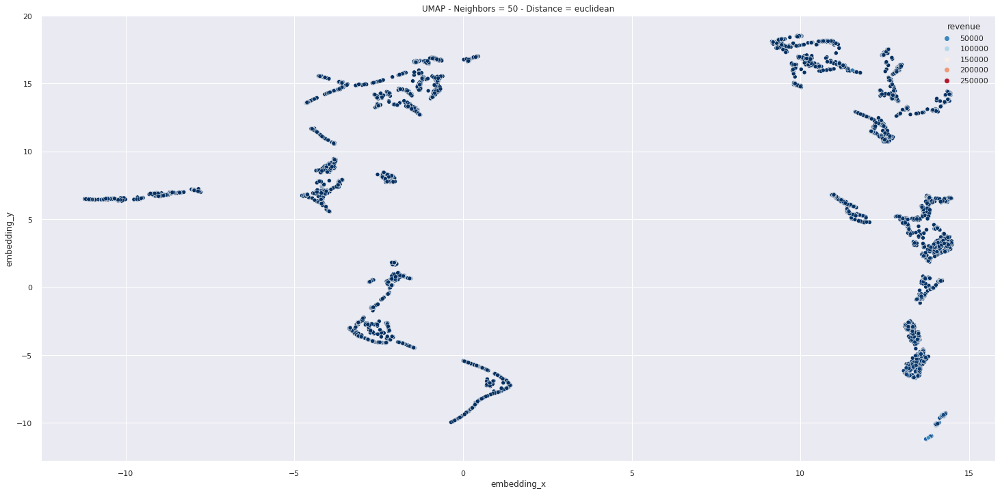

In [186]:
# Euclidean distance
n_neighbors = 50
umap = UMAP(n_neighbors = n_neighbors, random_state = 42) 
res_umap = umap.fit_transform(df_leaf)
metric = umap.metric 

df_tree = df4.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {} - Distance = {}'.format(n_neighbors, metric) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);


In [187]:
df_tree.sort_values('revenue', ascending = False).head()

,customer_id,country,recency,avg_days_bw_purchases,num_purchases,date_range,frequency,revenue,avg_ticket,qty_items,avg_basket_size,avg_unique_prods,returns_revenue,avg_return_revenue,num_returns,qty_returned,embedding_x,embedding_y
844,14646,Netherlands,2,8.022727,73,353,0.206799,278778.02,3818.876986,197132,2663.945946,28.273973,-360.00,-180.000000,2.0,-288.0,13.700754,-11.240726
419,18102,United Kingdom,1,14.680000,60,367,0.163488,259657.30,4327.621667,64124,1068.733333,7.183333,0.00,0.000000,0.0,0.0,13.704624,-11.248878
372,17450,United Kingdom,9,13.807692,46,359,0.128134,189735.53,4124.685435,69041,1409.000000,7.304348,-4815.26,-1605.086667,3.0,-952.0,13.704883,-11.232183
65,14911,EIRE,2,2.861538,199,372,0.534946,133007.13,668.377538,77181,317.617284,28.492462,-7443.59,-33.379327,223.0,-3332.0,13.696462,-11.240731
912,12415,Australia,25,22.357143,20,313,0.063898,123638.18,6181.909000,77242,3218.416667,35.750000,-926.35,-15.186066,61.0,-427.0,13.674103,-11.275383


The distance metrics that worked better are: euclidean, manhattan

### 4.4.6 Consultation 

In [ ]:
# testing wheter preprocessing changes embedded space
# defining columns to be transformed
log_cols = ['recency','avg_days_bw_purchases'] 
min_max_cols = ['num_purchases','date_range','frequency','revenue','avg_ticket','avg_basket_size','avg_unique_prods','returns_revenue','avg_return_revenue','num_returns','qty_returned']

log1p = FunctionTransformer(np.log1p)

# applying log and standard scaler to log cols
log_pipe = Pipeline(steps = [ ('log', log1p), ('std', StandardScaler()) ] )
ct_log = ColumnTransformer( transformers = [ ('log', log_pipe, log_cols) ] ) 

# applying min_max scaler to min_max cols
min_max_pipe = make_pipeline( MinMaxScaler() )

# Label Encoding and std_scaler to catgorical columns
label_pipe = make_pipeline( OrdinalEncoder(), MinMaxScaler() )

preprocessor = ColumnTransformer( 
    transformers=[ ('log', log_pipe, log_cols), 
    ('min_max', min_max_pipe, min_max_cols) ] )
df_proper = preprocessor.fit_transform(df4)

# Testing UMAP for 5, 15 and 25 neighbors
n_neighbors = 5
reducer = UMAP(n_neighbors = n_neighbors, random_state = 42)
embedding = reducer.fit_transform(df_proper)

df_viz_2 = df4.copy()
df_viz_2['embedding_x'] = embedding[:,0]
df_viz_2['embedding_y'] = embedding[:,1]

plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_viz_2, x = 'embedding_x', y = 'embedding_y', palette = 'bright' ); # hue = 'cluster'
df_unprep = df4.drop(['customer_id', 'country'], axis = 1).copy()
df_unprep.head()

# Testing UMAP for 5, 15 and 25 neighbors
n_neighbors = 5
reducer = UMAP(n_neighbors = n_neighbors, random_state = 42)
embedding = reducer.fit_transform(df_unprep)

df_viz_3 = df4.copy()
df_viz_3['embedding_x'] = embedding[:,0]
df_viz_3['embedding_y'] = embedding[:,1]

plt.title('UMAP - Neighbors = {}'.format(n_neighbors) )
sns.scatterplot( data = df_viz_3, x = 'embedding_x', y = 'embedding_y', palette = 'bright' ); # hue = 'cluster'
### 4.4.3 UMAP Embedding
# Testing UMAP for 5, 15 and 25 neighbors
n_neighbors = 5
reducer = UMAP(n_neighbors = n_neighbors, random_state = 42)
embedding = reducer.fit_transform(df_prep)

df_viz = df4.copy()
df_viz['embedding_x'] = embedding[:,0]
df_viz['embedding_y'] = embedding[:,1]

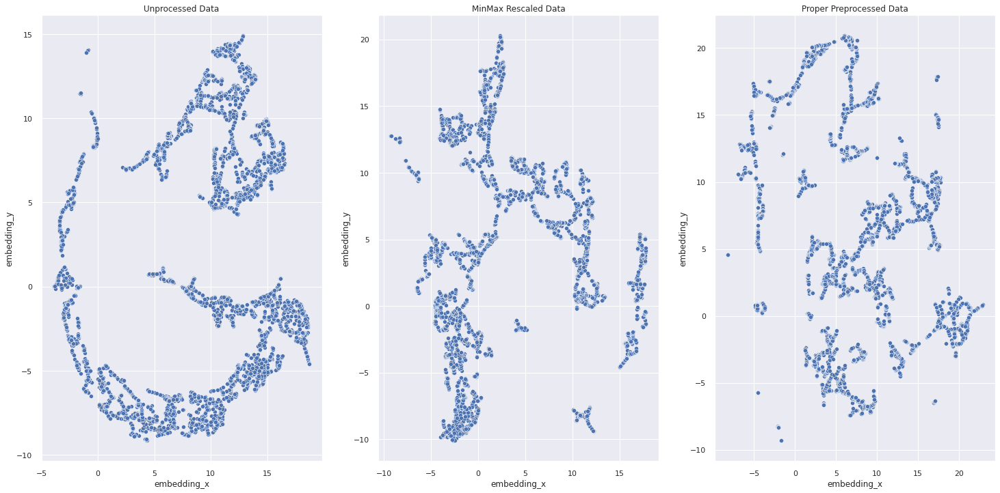

In [46]:
fig, ax = plt.subplots(1, 3)
sns.scatterplot( data = df_viz_3, x = 'embedding_x', y = 'embedding_y', palette = 'bright', ax=ax[0] ); # hue = 'cluster'
sns.scatterplot( data = df_viz, x = 'embedding_x', y = 'embedding_y', palette = 'bright', ax=ax[1] ); # hue = 'cluster' 
sns.scatterplot( data = df_viz_2, x = 'embedding_x', y = 'embedding_y', palette = 'bright', ax=ax[2] ); # hue = 'cluster'
ax[0].set_title('Unprocessed Data');
ax[1].set_title('MinMax Rescaled Data');
ax[2].set_title('Proper Preprocessed Data');
plt.show()

# 5.0 Data Preparation

## 5.1 Numerical Variables Preparation

In [3]:
df5 = pd.read_csv('../data/processed/df4_processed.csv')


### 5.1.1 Describing

In [4]:
# df3.hist();
num_att = df5.select_dtypes(include= ['int','float'])
d1 = pd.DataFrame( num_att.min() ).T
d2 = pd.DataFrame( num_att.max() ).T
d3 = pd.DataFrame( num_att.max() - num_att.min() ).T
d4 = pd.DataFrame( num_att.mean() ).T
d5 = pd.DataFrame( num_att.median() ).T
d6 = pd.DataFrame( num_att.std() ).T
d7 = pd.DataFrame( num_att.skew() ).T
d8 = pd.DataFrame( num_att.kurtosis() ).T

desc = pd.concat( [d1, d2, d3, d4, d5, d6, d7, d8] ).T
desc.columns = ['min', 'max', 'range', 'mean', 'median', 'std', 'skew', 'kurtosis' ]
desc.style.format( "{:,.2f}" )

,min,max,range,mean,median,std,skew,kurtosis
customer_id,"12,347.00","18,287.00","5,940.00","15,301.83","15,300.50","1,720.16",0.00,-1.20
recency,1.00,374.00,373.00,93.05,51.00,100.17,1.25,0.43
avg_days_bw_purchases,0.00,366.00,366.00,50.57,31.09,65.32,1.99,4.65
num_purchases,1.00,206.00,205.00,4.26,2.00,7.66,11.95,244.12
date_range,1.00,374.00,373.00,187.22,191.00,115.01,0.01,-1.33
frequency,0.00,34.00,34.00,0.05,0.02,0.54,58.77,"3,681.78"
revenue,3.75,"278,778.02","278,774.27","1,922.49",655.34,"8,326.44",21.49,594.95
avg_ticket,3.75,"13,206.50","13,202.75",371.22,283.27,465.09,10.65,202.58
qty_items,1.00,"197,132.00","197,131.00","1,133.25",373.50,"4,701.25",22.96,778.32
avg_basket_size,0.25,"7,824.00","7,823.75",200.17,140.00,269.91,10.01,193.40


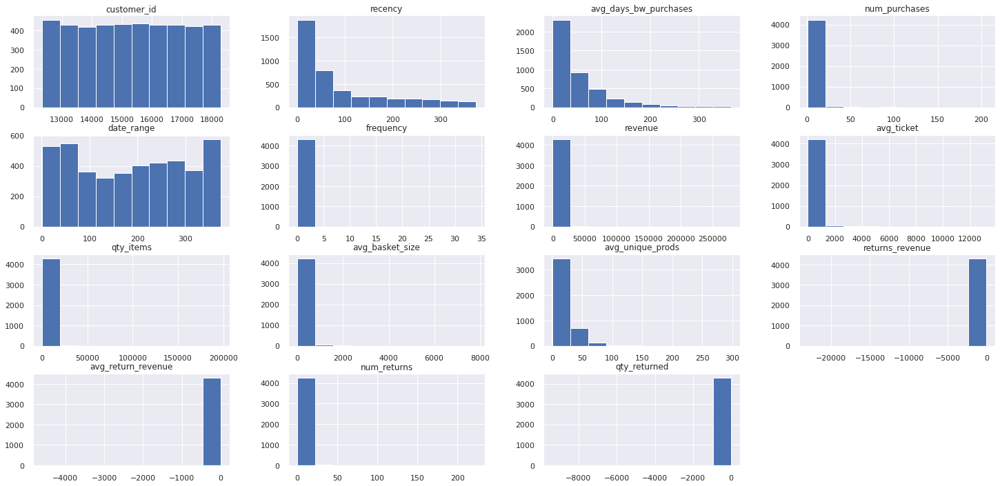

In [5]:
df5.hist();

## 5.2 Preprocessing

In [4]:
# selecting numerical cols, removing customer_id and country
numerical_cols = df5.select_dtypes(include = ['int', 'float'] ).columns.tolist()
numerical_cols.remove('customer_id')

# applying min max transform
ct = make_column_transformer( (MinMaxScaler(), numerical_cols) )
df_minmax = ct.fit_transform(df5)

In [4]:
# defining columns to be transformed
log_cols = ['recency','avg_days_bw_purchases'] 
min_max_cols = ['num_purchases','date_range','frequency','revenue','qty_items', 'avg_ticket','avg_basket_size','avg_unique_prods','returns_revenue','avg_return_revenue','num_returns','qty_returned']

log1p = FunctionTransformer(np.log1p)

# applying log and standard scaler to log cols
log_pipe = Pipeline(steps = [ ('log', log1p), ('std', StandardScaler()) ] )
ct_log = ColumnTransformer( transformers = [ ('log', log_pipe, log_cols) ] ) 

# applying min_max scaler to min_max cols
min_max_pipe = make_pipeline( MinMaxScaler() )

# Label Encoding and std_scaler to catgorical columns
label_pipe = make_pipeline( OrdinalEncoder(), MinMaxScaler() )

preprocessor = ColumnTransformer( 
    transformers=[ ('log', log_pipe, log_cols), 
    ('min_max', min_max_pipe, min_max_cols) ] )
df_prep = preprocessor.fit_transform(df5)

# building a dataframe with all columns used rescaled
all_cols = log_cols + min_max_cols

df_prep = pd.DataFrame(df_prep, columns = all_cols)
df_prep.head()

,recency,avg_days_bw_purchases,num_purchases,date_range,frequency,revenue,qty_items,avg_ticket,avg_basket_size,avg_unique_prods,returns_revenue,avg_return_revenue,num_returns,qty_returned
0,1.582374,-0.929401,0.160976,0.000000,1.000000,0.018958,0.008583,0.011497,0.006151,0.026055,0.995540,0.998513,0.067265,0.995726
1,0.156618,0.669072,0.039024,0.847185,0.000756,0.011068,0.006869,0.025713,0.010792,0.060630,0.993761,0.998644,0.103139,0.996261
2,-1.889019,0.342990,0.068293,0.991957,0.001111,0.023767,0.025247,0.033191,0.037396,0.048729,0.996694,0.994489,0.013453,0.994658
3,0.550016,0.937940,0.019512,0.742627,0.000450,0.003388,0.002222,0.014080,0.011190,0.015494,1.000000,1.000000,0.000000,1.000000
4,1.498132,0.212081,0.009756,0.104558,0.002127,0.002265,0.000289,0.015751,0.001204,0.000000,0.989525,0.982542,0.013453,0.997650


# 6.0 Feature Selection

## 6.1 Manual Feature Selection

In [5]:
# I won't implement a feature selection method in this cycle since I invested a lot of time embedding data, 
# and I think embedded data will perform better than rescaled data.
# Selecting all columns that are not obtained through a mean of other

cols_selected = ['recency',
                 'num_purchases',
                 'frequency',
                 'revenue',
                 'qty_items',
                 'returns_revenue',
                 'qty_returned']

df6 = df_prep[cols_selected].copy()

## 6.2 Tree-Embedding Space Selection

### 6.2.1 Space with most important features

In [13]:
# selecting most important features. Removing ('avg_basket_size', 'avg_days_bw_purchases', 'avg_return_revenue', 'date_range)
cols_selected = ['qty_items','avg_ticket','num_returns','returns_revenue','avg_unique_prods','qty_returned','num_purchases','recency','frequency']

# defining independent and dependent variable
X = df5[cols_selected].copy()
y = df5['revenue']

# defining random forest regresor for embedding
rf = RandomForestRegressor(random_state = 42, min_samples_split = 20) 
rf.fit(X, y)

# get leafs for each observation
df_leaf = pd.DataFrame( rf.apply(X) )

df_leaf.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,388,411,415,419,425,415,395,403,422,440,450,380,436,421,410,435,406,410,396,422,409,409,416,408,368,411,370,427,393,355,408,424,418,416,428,414,425,430,428,381,428,408,399,441,426,422,406,422,405,382,415,406,409,416,392,431,406,401,430,378,417,423,425,387,443,415,413,446,433,415,394,410,410,420,432,396,424,395,397,451,388,412,428,418,427,417,424,401,398,406,410,441,418,430,444,397,402,420,412,438
1,392,413,384,420,378,420,369,401,423,384,402,379,393,386,407,380,381,373,408,396,365,406,382,411,372,360,362,378,382,350,390,391,377,376,398,384,398,392,391,381,386,375,396,396,397,393,403,334,410,369,384,402,377,417,389,428,383,376,387,389,376,389,398,385,394,378,378,374,398,383,403,413,381,418,393,390,387,402,362,405,385,402,385,411,380,372,420,404,397,389,408,435,388,396,398,396,408,374,393,381
2,438,463,455,472,456,463,445,453,459,450,472,458,468,448,451,462,446,432,460,470,435,438,429,446,463,444,452,455,433,429,462,473,429,427,473,455,469,466,445,451,436,454,438,469,470,457,445,431,453,449,466,445,432,452,433,464,454,410,458,442,446,436,466,434,452,443,434,468,440,438,441,457,442,460,457,454,467,451,445,465,435,461,465,470,456,425,467,449,446,432,464,489,460,455,461,456,457,457,450,464
3,228,336,310,291,288,245,274,233,306,268,288,288,290,280,283,280,279,292,251,246,290,291,275,289,290,295,240,314,233,257,299,266,307,297,265,294,333,286,269,282,300,295,286,287,295,296,252,311,280,292,291,321,271,275,263,254,257,225,300,298,314,313,284,288,267,259,281,295,284,231,300,282,303,301,314,256,308,275,277,295,303,288,304,283,275,278,297,272,286,276,268,261,257,276,287,246,284,309,306,323
4,124,148,129,101,97,112,97,103,114,61,105,107,107,101,94,92,105,102,83,67,96,105,111,104,94,92,115,113,152,91,103,108,101,95,169,101,109,127,105,109,100,94,117,105,101,110,172,105,94,104,104,99,103,104,96,68,146,157,96,90,105,110,102,108,178,130,69,104,125,59,109,106,98,103,109,163,105,111,97,94,139,133,103,80,93,148,104,99,98,97,93,60,99,111,97,120,101,104,104,110


In [14]:
# feature importance
sorted( list(zip(rf.feature_importances_, rf.feature_names_in_)), reverse = True )

[(0.9803227381833893, 'qty_items'),
 (0.009798597189382887, 'avg_ticket'),
 (0.0031602274021194253, 'num_purchases'),
 (0.002071331841339211, 'qty_returned'),
 (0.0015236435648503597, 'returns_revenue'),
 (0.001087134430142177, 'avg_unique_prods'),
 (0.0009989510275736112, 'frequency'),
 (0.0008828629021963739, 'recency'),
 (0.00015451345900651523, 'num_returns')]

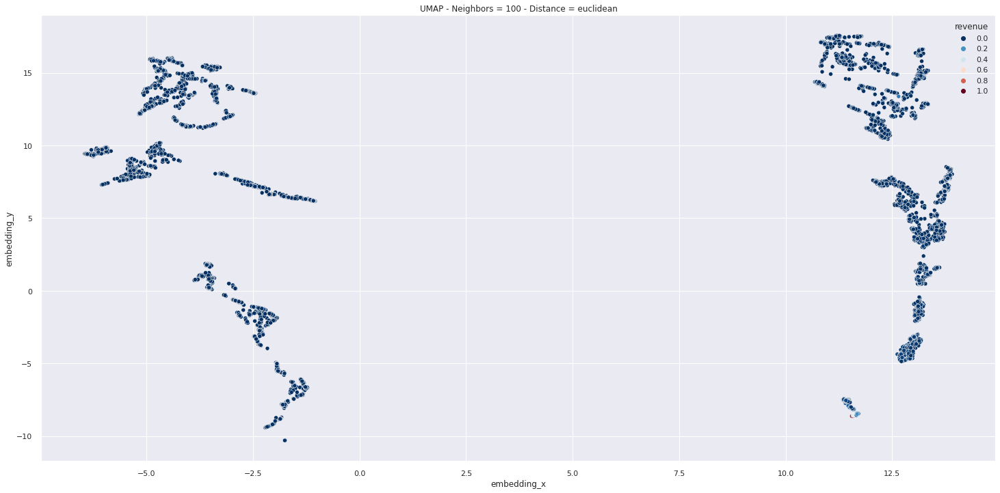

In [17]:
# Euclidean Distance 
n_neighbors = 100
umap = UMAP(n_neighbors = n_neighbors, random_state = 42, metric = 'euclidean')  
res_umap = umap.fit_transform(df_leaf)
metric = umap.metric

df_tree = df6.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {} - Distance = {}'.format(n_neighbors, metric) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);

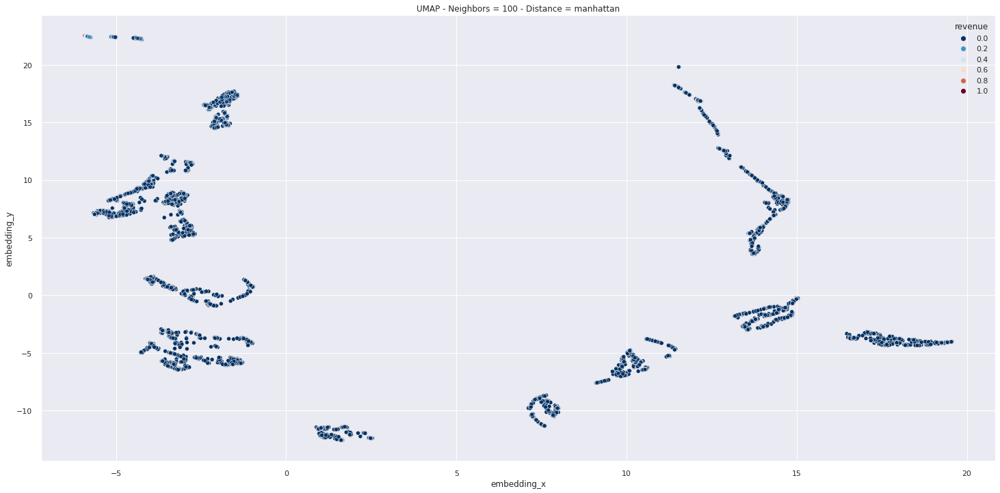

In [18]:
# Manhattan Distance 
n_neighbors = 100
umap = UMAP(n_neighbors = n_neighbors, random_state = 42, metric = 'manhattan')  
res_umap = umap.fit_transform(df_leaf)
metric = umap.metric

df_tree = df6.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {} - Distance = {}'.format(n_neighbors, metric) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);

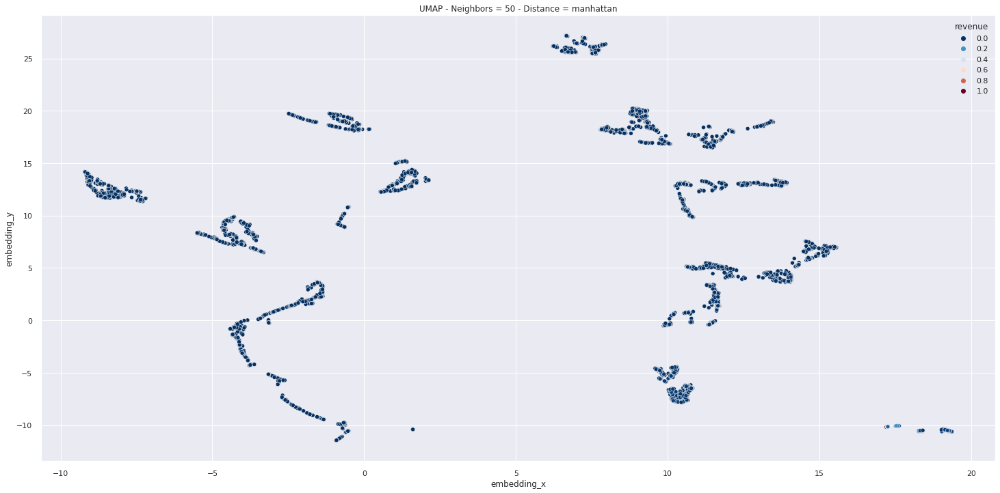

In [19]:
n_neighbors = 50
umap = UMAP(n_neighbors = n_neighbors, random_state = 42, metric = 'manhattan')  
res_umap = umap.fit_transform(df_leaf)
metric = umap.metric

df_tree = df6.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {} - Distance = {}'.format(n_neighbors, metric) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);

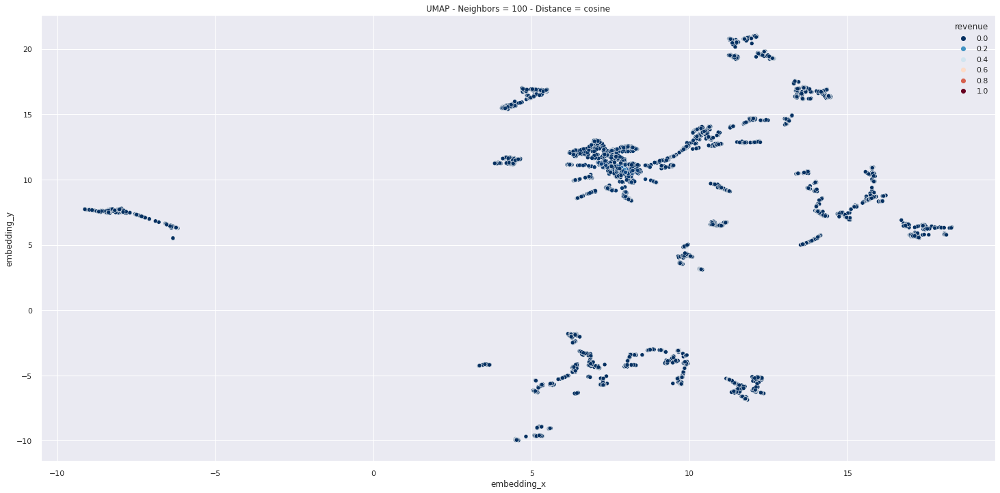

In [108]:
n_neighbors = 100
umap = UMAP(n_neighbors = n_neighbors, random_state = 42, metric = 'cosine')  
res_umap = umap.fit_transform(df_leaf)
metric = umap.metric

df_tree = df6.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {} - Distance = {}'.format(n_neighbors, metric) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);

### 6.2.2 Space with less features

In [154]:
# cols_selected = ['qty_items','avg_ticket','num_returns','returns_revenue','avg_unique_prods','qty_returned','num_purchases','recency','frequency']# defining independent and dependent variable
cols_selected = ['recency',
                 'num_purchases',
                 'avg_ticket',
                 'frequency',
                 'revenue',
                 'qty_items',
                 'returns_revenue',
                 'qty_returned']

X = df5[cols_selected].drop(['revenue'], axis = 1).copy()
y = df5['revenue']

rf = RandomForestRegressor(random_state = 42, min_samples_split = 10) 
rf.fit(X, y)

# get leafs for each observation
df_leaf = pd.DataFrame( rf.apply(X) )

In [155]:
# Feature importance
sorted( list(zip(rf.feature_importances_, rf.feature_names_in_)), reverse = True )

[(0.9589475988313737, 'qty_items'),
 (0.019725297900651317, 'avg_ticket'),
 (0.00592589765997691, 'returns_revenue'),
 (0.00516721090138476, 'qty_returned'),
 (0.004285281452449522, 'num_purchases'),
 (0.004199579770241277, 'frequency'),
 (0.001749133483922551, 'recency')]

In [156]:
df_leaf.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,788,807,810,831,848,845,792,803,837,903,878,737,864,854,815,847,814,830,806,850,847,824,854,834,769,835,766,886,813,745,838,834,894,878,814,834,825,844,845,803,858,864,819,878,859,822,832,868,805,782,806,824,843,804,804,855,824,817,848,798,840,865,836,813,882,875,859,851,879,838,810,828,831,814,878,795,838,811,816,871,807,822,853,838,865,850,832,827,808,835,830,859,868,856,882,799,796,824,866,869
1,800,811,756,833,751,859,746,801,847,819,794,734,760,784,805,747,773,738,830,777,767,818,776,838,759,740,751,778,790,734,802,770,807,796,754,780,764,773,771,803,788,780,808,792,807,772,825,687,812,756,748,810,778,808,800,850,781,768,763,824,752,782,769,800,788,790,790,728,809,775,826,833,775,811,800,770,762,822,732,790,797,806,782,826,771,762,826,831,806,792,828,841,803,786,768,795,807,744,797,761
2,880,896,882,923,920,935,896,895,934,930,896,896,929,927,901,894,894,873,926,930,896,893,880,916,934,890,912,925,893,909,936,916,922,900,871,907,902,905,870,931,880,935,909,931,935,897,904,890,893,921,904,913,889,874,878,931,928,840,906,919,898,895,914,912,905,927,907,891,897,893,909,918,912,904,907,893,906,903,917,894,900,912,914,927,915,863,917,928,893,893,926,932,934,909,915,906,904,889,915,923
3,460,650,602,594,565,511,570,493,606,587,554,562,583,585,568,562,566,585,517,513,615,599,545,583,592,610,494,655,486,518,624,526,643,633,507,586,639,561,544,578,608,611,575,578,589,576,527,643,565,609,568,652,563,543,555,513,529,475,592,636,607,636,561,589,540,525,580,577,567,463,601,587,615,605,643,516,602,571,568,582,618,567,607,580,562,549,581,554,575,572,534,513,544,539,556,504,562,612,628,633
4,247,323,243,209,193,224,197,220,217,131,204,191,217,210,192,176,207,191,163,127,199,217,215,208,186,192,231,229,319,194,215,206,197,212,334,217,209,251,199,221,204,194,243,211,193,210,360,213,194,226,192,206,207,198,208,148,306,317,178,188,201,212,207,208,355,253,141,209,255,117,209,206,180,199,215,317,199,221,203,194,273,268,197,154,187,273,201,209,198,202,187,124,211,205,175,253,192,196,206,210


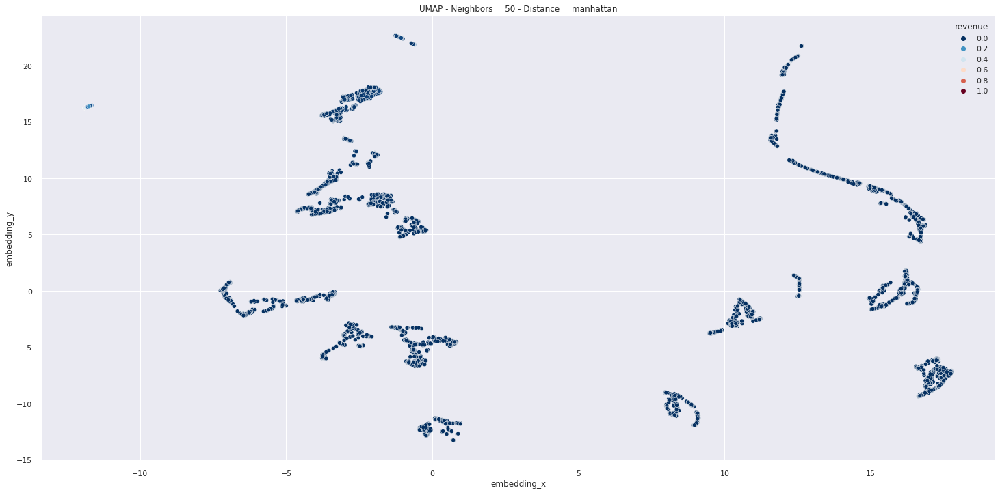

In [158]:
# Manhattan Distance 
n_neighbors = 50
umap = UMAP(n_neighbors = n_neighbors, random_state = 42, metric = 'manhattan')  
res_umap = umap.fit_transform(df_leaf)
metric = umap.metric

df_tree = df7.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {} - Distance = {}'.format(n_neighbors, metric) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);

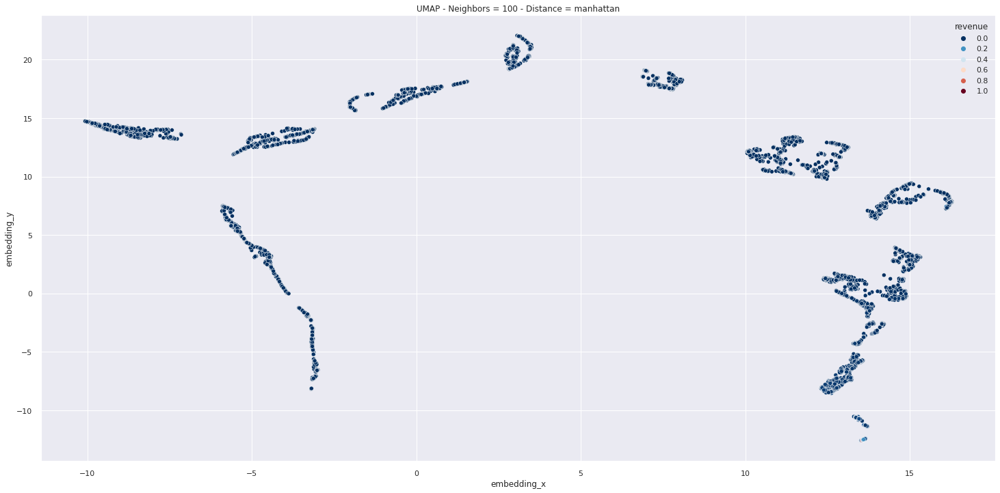

In [159]:
# Manhattan Distance 
n_neighbors = 100
umap = UMAP(n_neighbors = n_neighbors, random_state = 42, metric = 'manhattan')  
res_umap = umap.fit_transform(df_leaf)
metric = umap.metric

df_tree = df7.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {} - Distance = {}'.format(n_neighbors, metric) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);

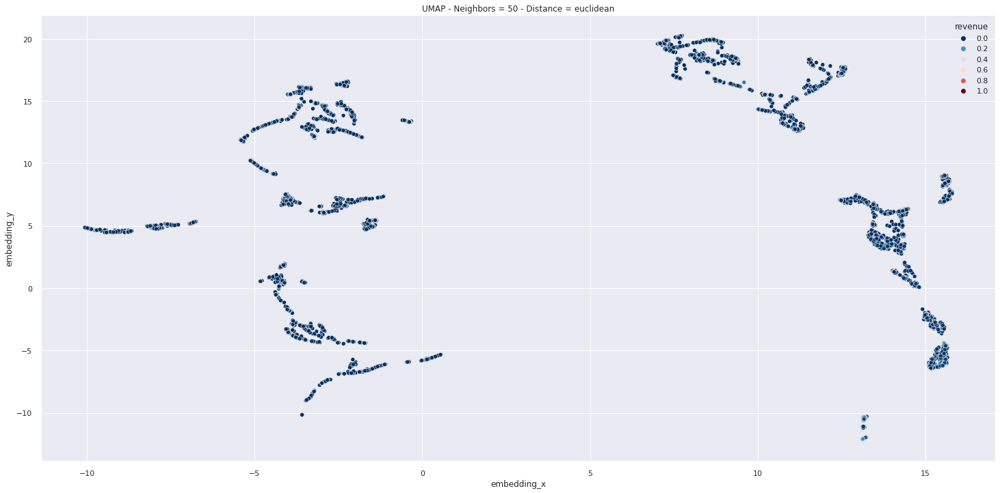

In [161]:
# Cosine Distance 
n_neighbors = 50
umap = UMAP(n_neighbors = n_neighbors, random_state = 42, metric = 'euclidean')  
res_umap = umap.fit_transform(df_leaf)
metric = umap.metric
metric = umap.metric

df_tree = df7.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {} - Distance = {}'.format(n_neighbors, metric) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);

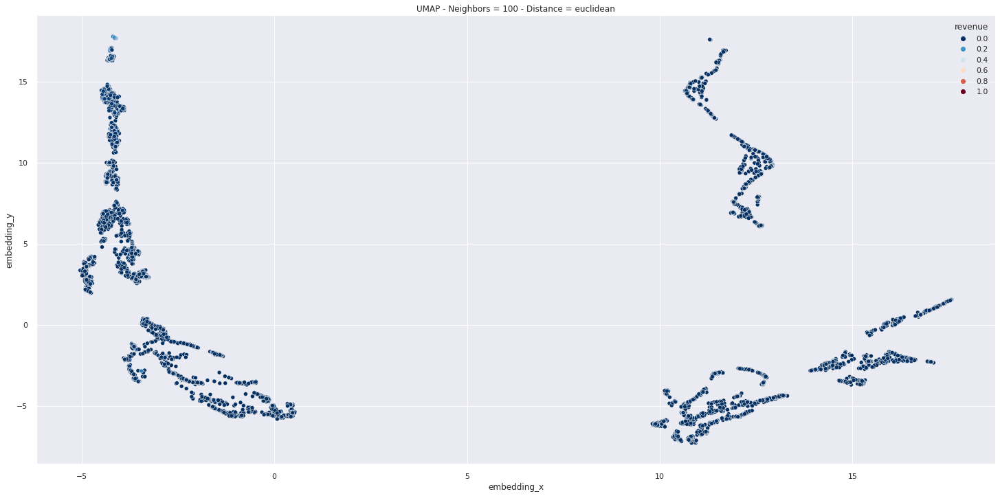

In [162]:
n_neighbors = 100
umap = UMAP(n_neighbors = n_neighbors, random_state = 42, metric = 'euclidean')  
res_umap = umap.fit_transform(df_leaf)
metric = umap.metric
metric = umap.metric

df_tree = df7.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {} - Distance = {}'.format(n_neighbors, metric) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);

### 6.2.3 Space with less features and min_sample_split = 20

In [181]:
# cols_selected = ['qty_items','avg_ticket','num_returns','returns_revenue','avg_unique_prods','qty_returned','num_purchases','recency','frequency']# defining independent and dependent variable
cols_selected = ['recency',
                 'num_purchases',
                 'frequency',
                 'revenue',
                 'qty_items',
                 'returns_revenue',
                 'qty_returned']

X = df7[cols_selected].drop(['revenue'], axis = 1).copy()
y = df7['revenue']

rf = RandomForestRegressor(random_state = 42, min_samples_split = 20) 
rf.fit(X, y)

# get leafs for each observation
df_leaf = pd.DataFrame( rf.apply(X) )

In [182]:
df_leaf.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,571,608,595,611,526,563,570,542,585,625,581,502,584,602,579,623,543,579,547,593,591,571,606,557,527,579,538,626,556,523,549,639,625,613,577,561,558,617,613,554,609,585,581,593,610,554,622,600,612,552,609,594,616,585,606,607,585,563,591,578,614,606,612,573,606,603,600,612,559,599,615,560,547,553,601,615,620,603,585,645,582,566,627,560,616,609,579,613,565,576,562,582,587,628,601,584,582,583,584,639
1,559,600,569,605,518,558,558,542,585,569,521,501,529,560,565,526,499,519,541,545,539,569,565,550,522,519,530,558,511,517,524,603,568,562,533,519,516,555,567,554,577,545,566,529,573,512,617,480,594,543,566,569,566,576,603,596,563,498,538,564,554,566,571,565,552,540,522,557,514,551,604,552,513,535,541,592,571,599,548,573,569,522,576,504,562,552,541,568,552,544,556,568,562,577,536,575,582,535,553,539
2,620,657,643,666,622,610,640,612,628,641,590,575,619,624,621,667,589,605,607,641,617,616,621,591,625,619,634,659,589,615,611,681,641,627,616,603,616,668,628,627,615,623,628,626,651,591,663,629,661,634,659,659,647,624,653,643,637,595,619,642,646,619,677,615,620,636,639,636,570,620,665,601,579,604,617,691,663,656,642,659,641,623,669,616,647,618,622,645,629,615,612,633,644,657,608,667,654,615,620,660
3,352,489,469,427,374,364,424,374,444,428,390,396,390,386,405,474,387,429,367,396,414,400,431,388,419,422,374,482,343,373,403,431,462,450,355,379,449,418,438,424,450,425,435,391,436,410,407,451,417,436,456,358,412,410,425,370,379,353,407,439,475,472,439,416,400,372,401,417,386,376,444,415,406,398,439,399,460,427,421,461,448,422,467,390,420,379,441,460,400,416,387,381,400,400,390,376,424,452,440,473
4,66,117,108,94,76,94,95,113,142,104,121,86,124,48,88,104,53,66,71,108,79,90,43,46,44,35,78,49,92,76,50,42,37,106,116,68,42,77,126,40,73,87,95,91,83,40,78,80,72,70,38,128,47,63,58,34,96,90,83,138,62,110,94,87,84,38,102,117,36,85,54,84,85,76,70,39,80,104,106,90,95,41,107,40,88,105,101,92,77,101,97,117,94,94,59,83,90,84,38,102


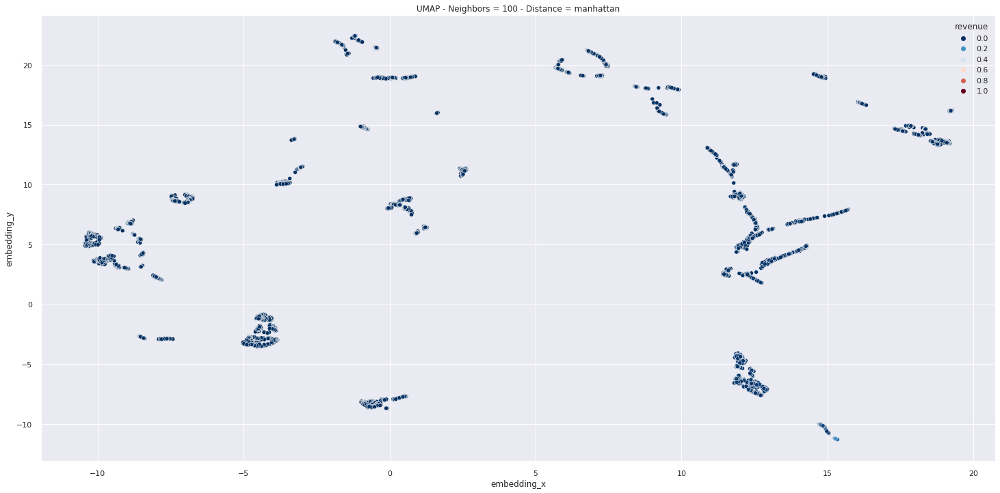

In [183]:
# Manhattan Distance 
n_neighbors = 100
umap = UMAP(n_neighbors = n_neighbors, random_state = 42, metric = 'manhattan')  
res_umap = umap.fit_transform(df_leaf)
metric = umap.metric

df_tree = df7.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {} - Distance = {}'.format(n_neighbors, metric) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);

In [176]:
# cols_selected = ['qty_items','avg_ticket','num_returns','returns_revenue','avg_unique_prods','qty_returned','num_purchases','recency','frequency']# defining independent and dependent variable
cols_selected = ['recency',
                 'num_purchases',
                 'frequency',
                 'revenue',
                 'qty_items',
                 'returns_revenue',
                 'qty_returned']

X = df5[cols_selected].drop(['revenue'], axis = 1).copy()
y = df5['revenue']

rf = RandomForestRegressor(random_state = 42, min_samples_split = 20) 
rf.fit(X, y)

# get leafs for each observation
df_leaf2 = pd.DataFrame( rf.apply(X) )

In [177]:
df_leaf2.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,571,608,595,611,526,563,570,542,585,625,581,502,584,605,579,623,543,579,547,593,591,571,606,557,527,579,538,626,556,523,549,639,625,613,577,561,558,617,613,554,609,585,581,593,610,554,622,600,612,552,609,594,616,585,606,607,585,563,591,578,614,606,612,573,606,603,600,612,559,599,615,560,547,553,601,615,620,603,585,645,582,566,627,560,616,609,579,613,565,576,562,582,587,628,601,584,582,585,584,637
1,559,600,569,605,518,558,558,542,585,569,521,501,529,560,565,526,499,519,541,545,539,569,565,550,522,519,530,558,511,517,524,603,568,562,533,519,516,555,567,554,577,545,566,529,573,512,617,480,594,543,566,569,566,576,603,596,563,498,538,564,554,566,571,565,552,540,522,557,514,551,604,552,513,535,541,592,571,599,548,573,569,522,576,504,562,552,541,568,552,544,556,568,562,577,536,575,582,535,553,539
2,620,657,643,666,622,610,640,612,628,641,590,575,619,624,621,667,589,605,607,641,617,616,621,591,625,619,634,660,589,615,611,681,641,627,616,603,616,667,628,627,615,623,628,626,651,591,663,629,661,634,659,659,647,624,653,643,637,595,619,642,646,619,677,615,620,636,639,636,570,620,665,600,579,604,617,690,663,656,642,659,641,623,669,616,647,618,622,645,629,615,612,633,644,657,608,666,654,615,620,660
3,352,489,469,427,374,364,424,374,444,428,390,396,390,386,405,474,387,429,367,396,414,400,431,388,419,422,374,482,343,373,403,431,462,450,355,379,449,418,438,424,450,425,435,391,436,410,407,451,417,436,456,358,412,410,425,370,379,353,407,439,475,472,439,416,400,372,401,417,386,376,444,415,406,398,439,399,460,427,421,461,448,422,467,390,420,379,441,460,400,416,387,381,400,400,390,376,424,452,440,473
4,66,117,108,94,76,94,95,113,142,104,121,86,124,48,88,104,53,66,71,108,79,90,43,46,44,35,78,49,92,76,50,42,37,106,116,68,42,77,126,40,73,87,95,91,83,40,78,80,72,70,38,113,47,63,58,34,96,90,83,138,62,110,94,87,83,38,102,117,36,85,54,84,85,76,70,39,80,104,106,97,95,41,107,40,88,105,101,92,77,101,97,117,94,94,59,83,90,84,38,102


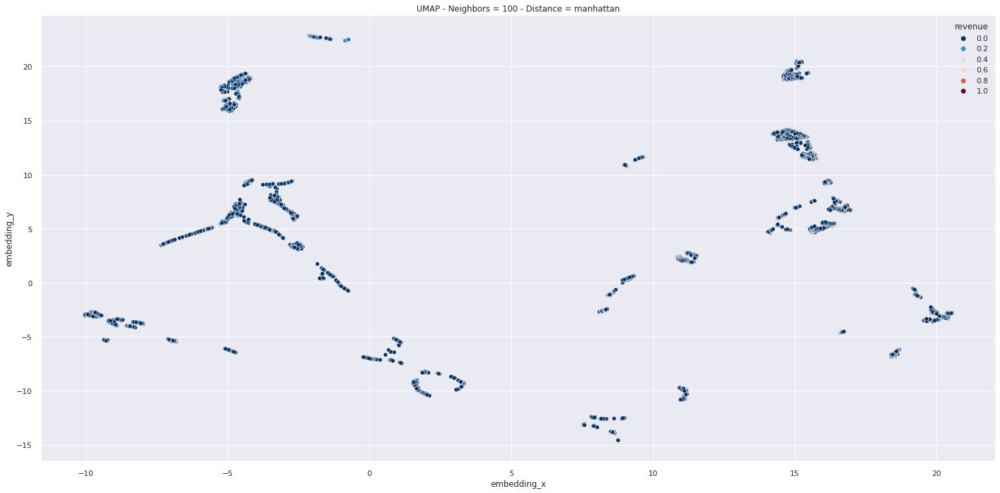

In [180]:
# Manhattan Distance 
n_neighbors = 100
umap = UMAP(n_neighbors = n_neighbors, random_state = 42, metric = 'manhattan')  
res_umap = umap.fit_transform(df_leaf)
metric = umap.metric

df_tree = df7.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {} - Distance = {}'.format(n_neighbors, metric) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);

## 6.3 Selected Embedding Space

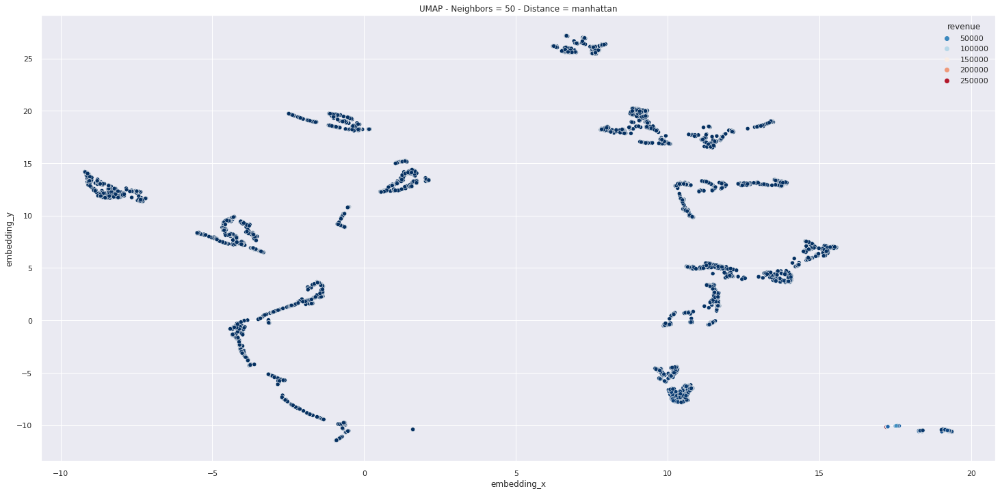

In [6]:
# selecting most important features. Removing ('avg_basket_size', 'avg_days_bw_purchases', 'avg_return_revenue', 'date_range)
cols_selected = ['qty_items','avg_ticket','num_returns','returns_revenue','avg_unique_prods','qty_returned','num_purchases','recency','frequency']

# defining independent and dependent variable
X = df5[cols_selected].copy()
y = df5['revenue']

# defining random forest regresor for embedding
rf = RandomForestRegressor(random_state = 42, min_samples_split = 20) 
rf.fit(X, y)

# get leafs for each observation
df_leaf = pd.DataFrame( rf.apply(X) )

# defining umap algorithm
n_neighbors = 50
umap = UMAP(n_neighbors = n_neighbors, random_state = 42, metric = 'manhattan')  
res_umap = umap.fit_transform(df_leaf)
metric = umap.metric

# storing embedding results on a dataframe
df_tree = df5.copy()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

# ploting results
cmap = sns.color_palette('RdBu_r', as_cmap = True)
plt.title('UMAP - Neighbors = {} - Distance = {}'.format(n_neighbors, metric) )
sns.scatterplot( data = df_tree, x = 'embedding_x', y = 'embedding_y', hue = 'revenue', palette = cmap);

# 7.0 Model Testing

In [7]:
# defining two spaces of data (embedded and rescaled) to test models

# tree embedded data
df_tree = pd.DataFrame()
df_tree['embedding_x'] =  res_umap[:,0]
df_tree['embedding_y'] =  res_umap[:,1]

# rescaled data
df7 = df6.copy()

## 7.1 KMeans

### 7.1.1 Rescaled Data

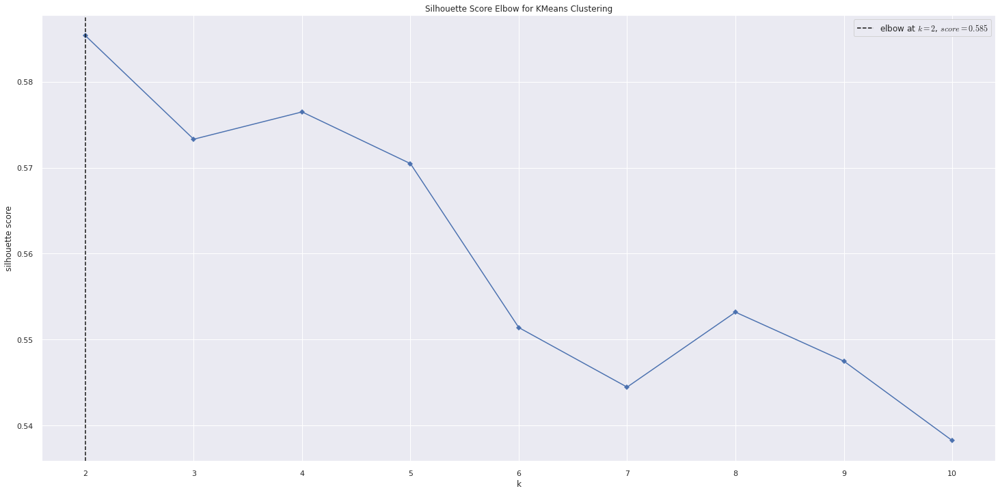

In [204]:
kmeans = KMeans( random_state = 42)
visualizer = KElbowVisualizer(kmeans, k=(2,11), timings = False, metric = 'silhouette' )
visualizer.fit(df7)
visualizer.finalize();

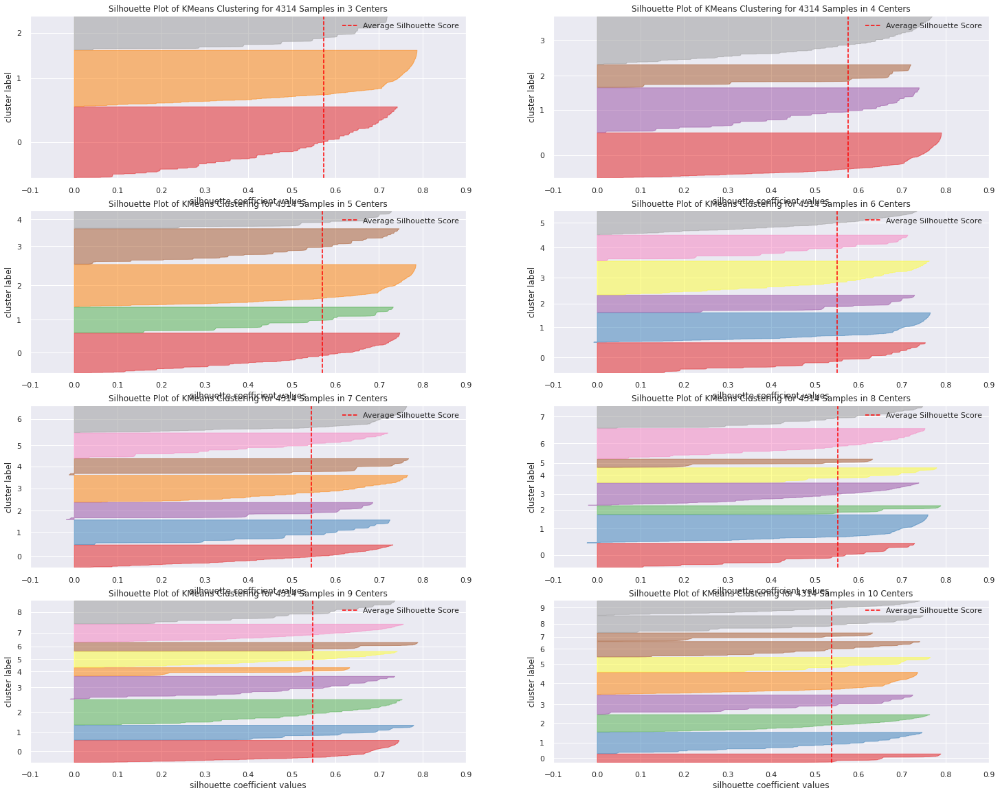

In [219]:
clusters = np.arange(3, 11)

# figure to plot
fig, ax = plt.subplots(4,2, figsize = (25,20) )
kmeans_silhouette = []

for idx, n_clusters in enumerate(clusters):
    # defining model
    kmeans = KMeans(n_clusters = n_clusters, random_state = 42)
    
    # getting row and col
    row, col = divmod(idx, 2)
    
    # calculating silhouette score
    labels = kmeans.fit_predict(df7.values)
    sil = silhouette_score( df7, labels)
    kmeans_silhouette.append(sil)
    
    # applying model
    model = SilhouetteVisualizer( kmeans, ax = ax[row][col] )
    model.fit(df7.values)
    model.finalize()

In [8]:
# calculating silhouette score for evaluation
kmeans_silhouette = []
for n_clusters in range(2,13):
    # defining model
    kmeans = KMeans(n_clusters = n_clusters, random_state = 42)
      
    # calculating silhouette score
    labels = kmeans.fit_predict(df7.values)
    sil = silhouette_score( df7, labels)
    kmeans_silhouette.append(sil)

### 7.1.2 Embedded Data

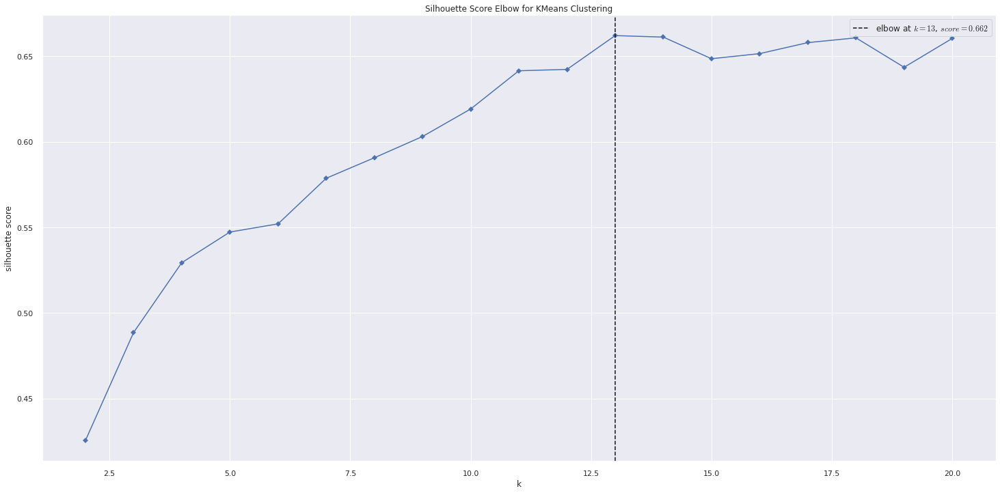

In [38]:
kmeans = KMeans( random_state = 42)
visualizer = KElbowVisualizer(kmeans, k=(2,21), timings = False, metric = 'silhouette' )
visualizer.fit(df_tree)
visualizer.finalize();

In [66]:
# calculating silhouette score for evaluation
n_max = 20

clusters = np.arange(2, n_max+1, 1)

kmeans_silhouette_emb = []
for n_clusters in clusters:
    # defining model
    kmeans = KMeans(n_clusters = n_clusters, random_state = 42)
      
    # calculating silhouette score
    labels = kmeans.fit_predict(df_tree.values)
    sil = silhouette_score( df_tree, labels)
    kmeans_silhouette_emb.append(sil)

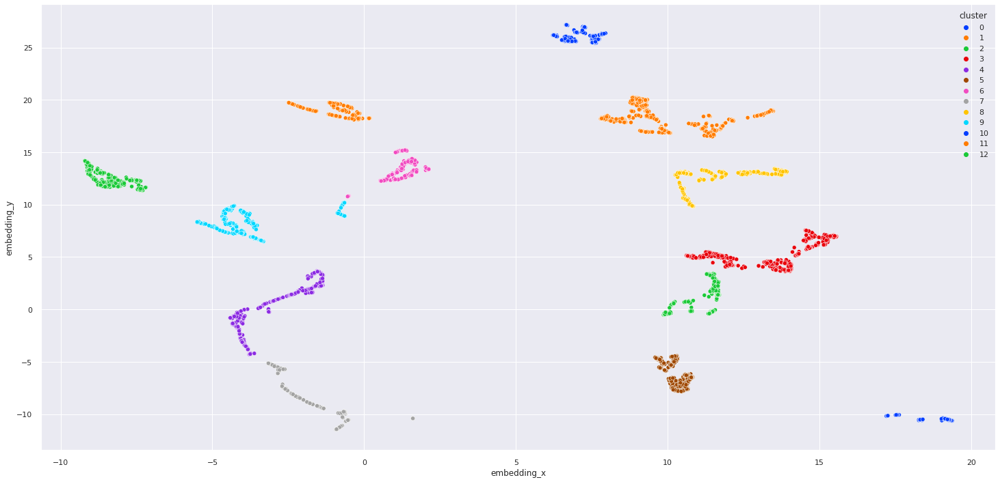

In [276]:
n_clusters = 13

kmeans = KMeans(n_clusters = n_clusters, random_state = 42)

labels = kmeans.fit_predict(df_tree)

df_res = df_tree.copy()
df_res['cluster'] = labels

sns.scatterplot(data = df_res, x = 'embedding_x', y = 'embedding_y', hue = 'cluster', palette = 'bright');

## 7.2 Hierarchical Clustering


### 7.2.1 Rescaled Data

In [220]:
# defining model 
hc_model = hc.linkage( pd.DataFrame(df7), 'ward' )

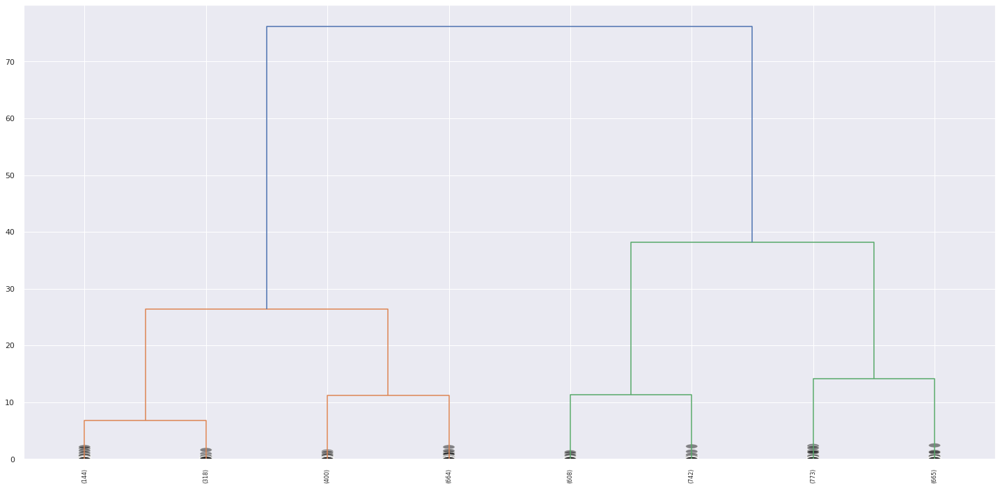

In [221]:
hc.dendrogram( hc_model, truncate_mode='lastp', p = 8,  leaf_rotation = 90, leaf_font_size = 8,  show_contracted=True)

plt.plot();

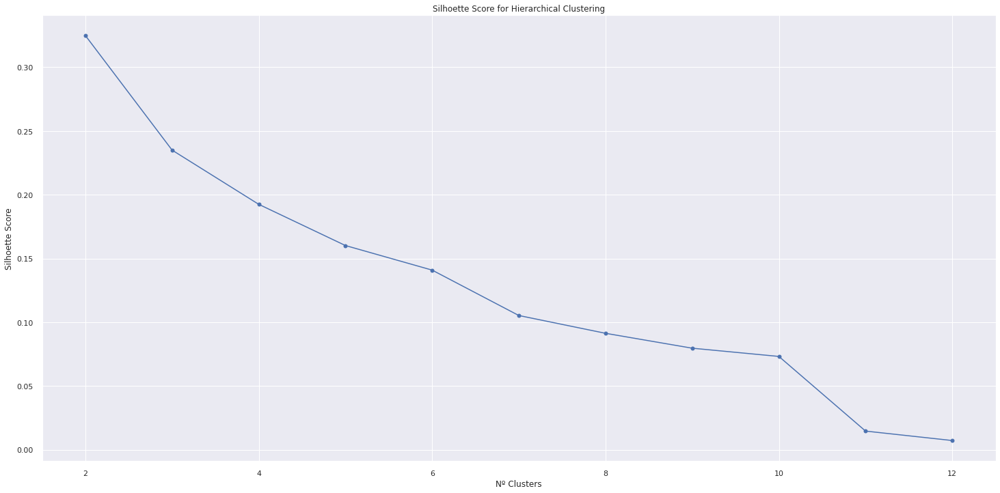

In [20]:
# HC
n_max = 12

hc_silhouette = []
for n_clusters in range(2, n_max + 1):
    # define model
    hc_model = hc.linkage(df7, 'ward')

    labels = hc.fcluster(hc_model, t = n_clusters, criterion = 'maxclust')
    # get labels

    # metric
    sil = silhouette_score(df_prep, labels)
    hc_silhouette.append(sil)

# ploting silhouette
plt.title('Silhoette Score for Hierarchical Clustering')
plt.xlabel('Nº Clusters')
plt.ylabel('Silhoette Score')
plt.plot( range(2, n_max + 1) , hc_silhouette, marker = 'o', color = 'b');

### 7.2.2 Embedded Data

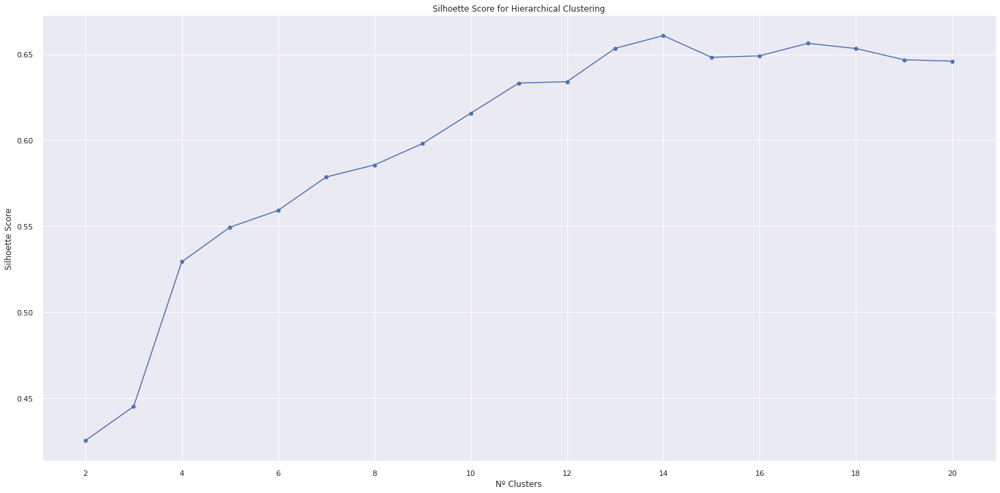

In [67]:
# HC
n_max = 20

hc_silhouette_emb = []
for n_clusters in range(2, n_max + 1):
    # define model
    hc_model = hc.linkage(df_tree, 'ward')

    labels = hc.fcluster(hc_model, t = n_clusters, criterion = 'maxclust')
    # get labels

    # metric
    sil = silhouette_score(df_tree, labels)
    hc_silhouette_emb.append(sil)

# ploting silhouette
plt.title('Silhoette Score for Hierarchical Clustering')
plt.xlabel('Nº Clusters')
plt.ylabel('Silhoette Score')
plt.xticks(np.arange(2, n_max+1, 2) )
plt.plot( range(2, n_max + 1) , hc_silhouette_emb, marker = 'o', color = 'b');

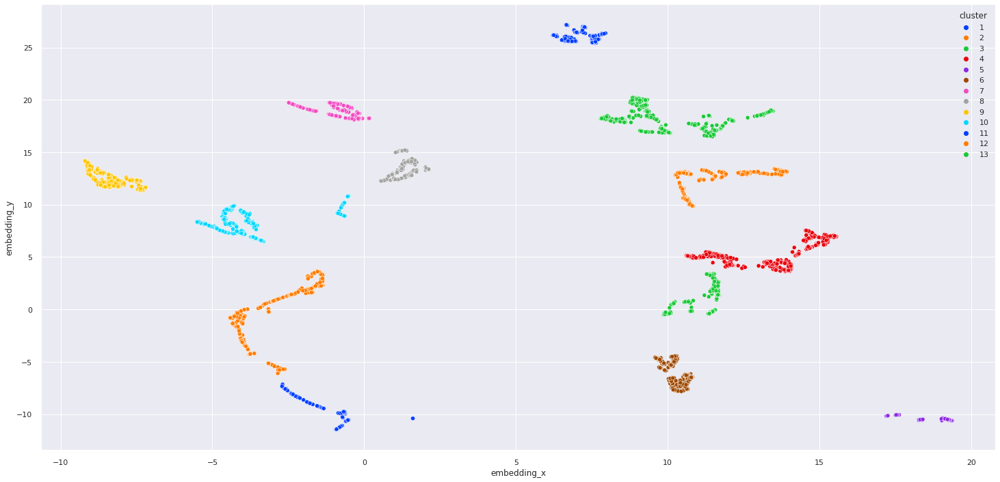

In [277]:
# plotting embedded space with clusters
n_clusters = 13

hc_model = hc.linkage(df_tree, 'ward')

labels = hc.fcluster(hc_model, t = n_clusters, criterion = 'maxclust')

df_res = df_tree.copy()
df_res['cluster'] = labels

sns.scatterplot(data = df_res, x = 'embedding_x', y = 'embedding_y', hue = 'cluster', palette = 'bright');

## 7.3 DBSCAN

### 7.3.1 Rescaled Data

In [128]:
# hyperparameters
eps = 0.3
min_samples = 20

# defining model
db_model = DBSCAN( eps = eps, min_samples = min_samples, metric = 'euclidean')
labels = db_model.fit_predict(df7)

print( 'Silhouette Score: {:,.4f}'.format(silhouette_score(df7, labels)) )
print( 'Number of Clusters: {}'.format(len(np.unique(labels))) )
print( 'Clusters: {}'.format(np.unique(labels)) )

Silhouette Score: 0.3581
Number of Clusters: 3
Clusters: [-1  0  1]


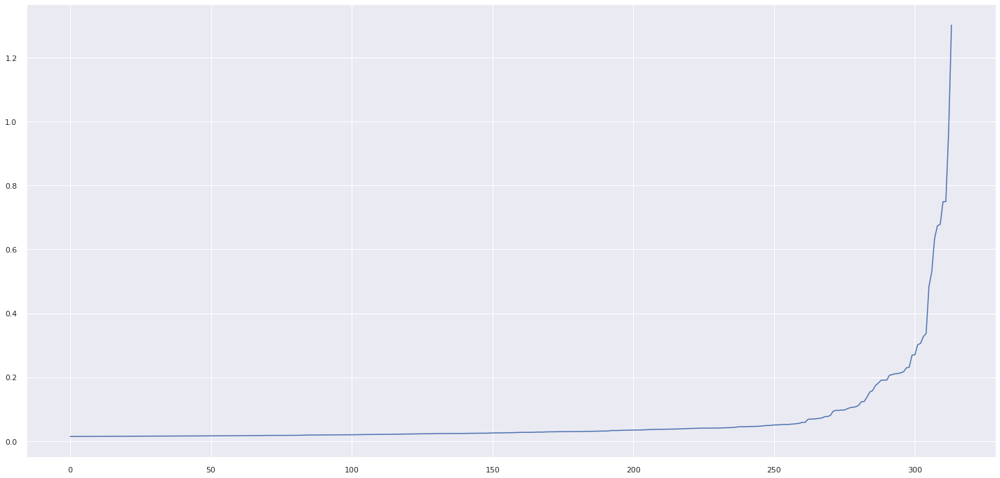

In [173]:
# Tuning DBSAN

from sklearn.neighbors import NearestNeighbors

nbrs = NearestNeighbors(n_neighbors = 2)

nbrs.fit(df7)

dist, idx = nbrs.kneighbors(df7)

distances = np.sort(dist, axis = 0)

# # full distances array for the last neighbor
# plt.plot(distances[:, 9]);

# distances array for the last neighbor starting from the 4000th neighbor
plt.plot(distances[4000:, 1]);



In [179]:
# hyperparameters
eps = 0.2
min_samples = 20

# defining model
db_model = DBSCAN( eps = eps, min_samples = min_samples, metric = 'euclidean')
labels = db_model.fit_predict(df7)

print( 'Silhouette Score: {:,.4f}'.format(silhouette_score(df7, labels)) )
print( 'Number of Clusters: {}'.format(len(np.unique(labels))) )
print( 'Clusters: {}'.format(np.unique(labels)) )

# the results were not satisfactory using the proposed method

Silhouette Score: 0.3405
Number of Clusters: 4
Clusters: [-1  0  1  2]


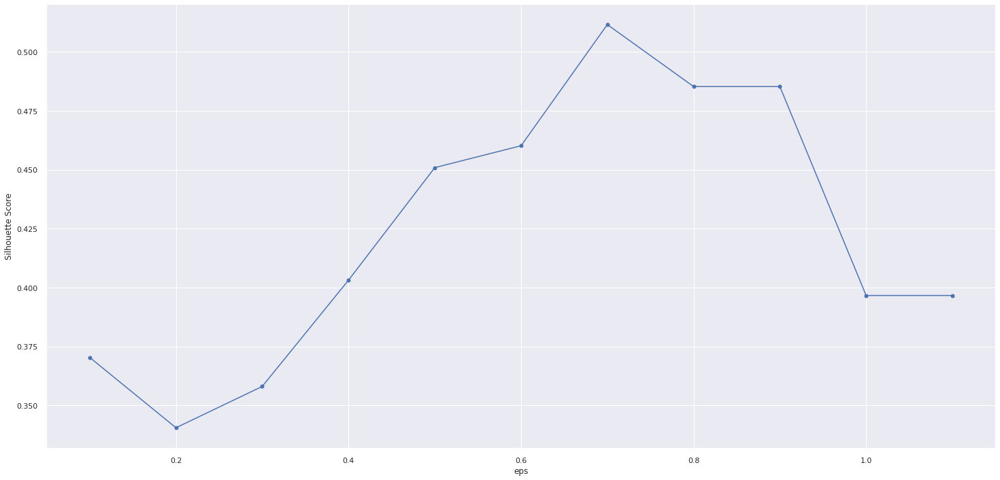

In [247]:
# DBSCAN
# testing multiple values for eps
max_eps = 1.1

dbscan_silhouette = []
n_clust = []

for eps in np.arange(0.1 , max_eps+ 0.1, 0.1):
    # define model
    db_model = DBSCAN(eps = eps, min_samples = 20)
    # get labels
    labels = db_model.fit_predict(df7)

    # n_clusters
    current_nclust = len( np.unique(labels) )
    # metric
    sil = silhouette_score(df7, labels)
    dbscan_silhouette.append(sil)
    n_clust.append(current_nclust)

# ploting silhouette
plt.plot( np.arange(0.1 , max_eps+ 0.1, 0.1) , dbscan_silhouette, marker = 'o', color = 'b');
plt.xlabel('eps')
plt.ylabel('Silhouette Score')
plt.show();

In [263]:
# DBSCAN
max_eps = 0.2

dbscan_silhouette = []
n_clust = []

for eps in np.arange(0.01 , max_eps+ 0.01, 0.01):
    # define model
    db_model = DBSCAN(eps = eps, min_samples = 20)
    # get labels
    labels = db_model.fit_predict(df7)

    # n_clusters
    current_nclust = len( np.unique(labels) )
    # metric
    sil = silhouette_score(df7, labels)
    dbscan_silhouette.append(sil)
    n_clust.append(current_nclust)

# ploting silhouette
plt.plot( np.arange(0.01 , max_eps+ 0.01, 0.1) , dbscan_silhouette, marker = 'o', color = 'b');
plt.xlabel('eps')
plt.ylabel('Silhouette Score')
plt.show();

KeyboardInterrupt: 

### 7.3.2 Embedded Data

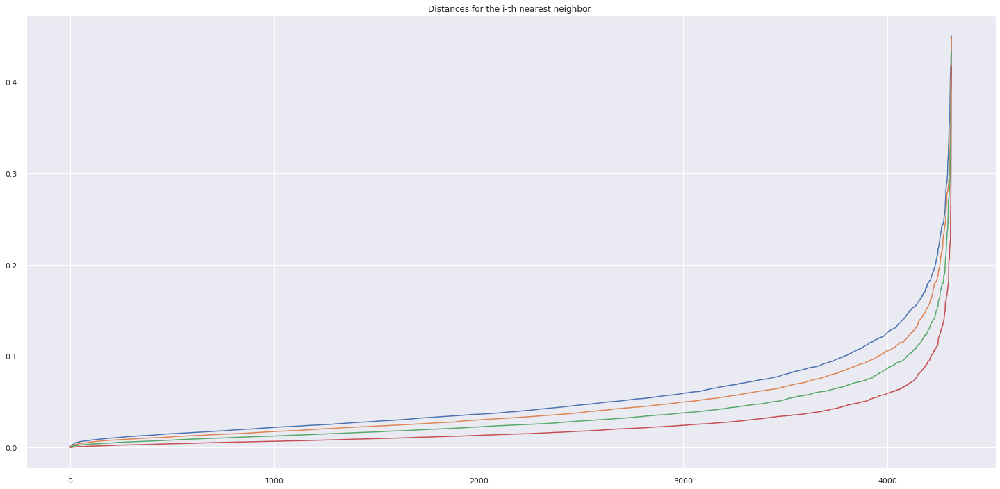

In [126]:
# testing proposed tuning method
nn = NearestNeighbors(n_neighbors = 5)
nn.fit(df_tree)

dist, _ = nn.kneighbors(df_tree)

distances = np.sort(dist, axis = 0)

plt.title('Distances for the i-th nearest neighbor ')
plt.plot(distances[:, 4]);
plt.plot(distances[:, 3]);
plt.plot(distances[:, 2]);
plt.plot(distances[:, 1]);

# this method suggested an eps value that led to houdreds of clusters

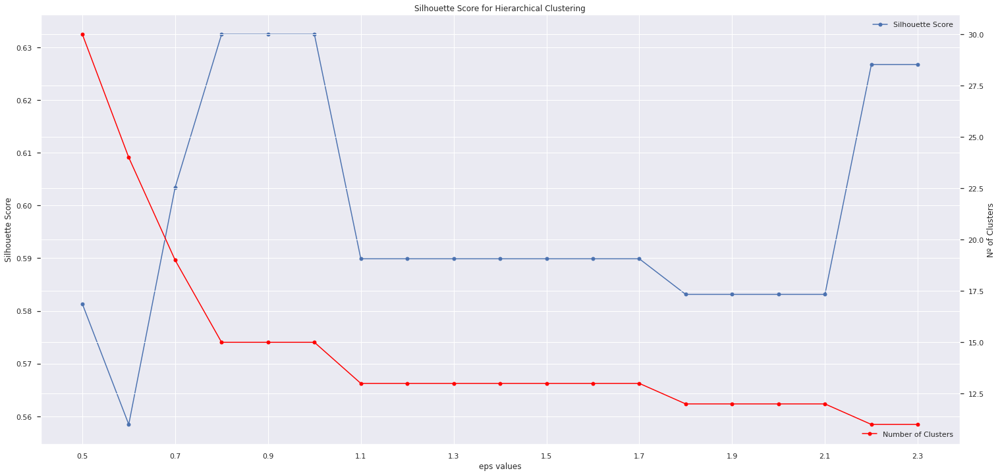

In [256]:
# testing dbscan for a few epd values

eps_list = np.arange(0.5, 2.4, 0.1)

db_silhouette_emb = []
n_clusters = []

for eps in eps_list:
    # define model
    db_model = DBSCAN(eps = eps, min_samples = 5, metric = 'euclidean' )
    
    # get labels
    labels = db_model.fit_predict(df_tree)

    # metric
    sil = silhouette_score(df_tree, labels)
    db_silhouette_emb.append(sil)
    
    #nº of clusters
    n_clusters.append( len(np.unique(labels)) )

# ploting silhouette
fig, ax1 = plt.subplots( )

x = eps_list
ax1.set_title('Silhouette Score for Hierarchical Clustering')
ax1.set_xlabel('eps values')
ax1.set_ylabel('Silhouette Score')
ax1.set_xticks( np.arange(0.5, 2.4, 0.2) )
ax1.plot( x , db_silhouette_emb, marker = 'o', color = 'b', label = 'Silhouette Score');
ax1.legend(loc = 'upper right');

ax2 = ax1.twinx()
ax2.set_ylabel('Nº of Clusters')
ax2.plot(x, n_clusters, marker = 'o', color = 'red', label = 'Number of Clusters')
ax2.legend( loc = 'lower right');
ax2.set_yscale('linear')

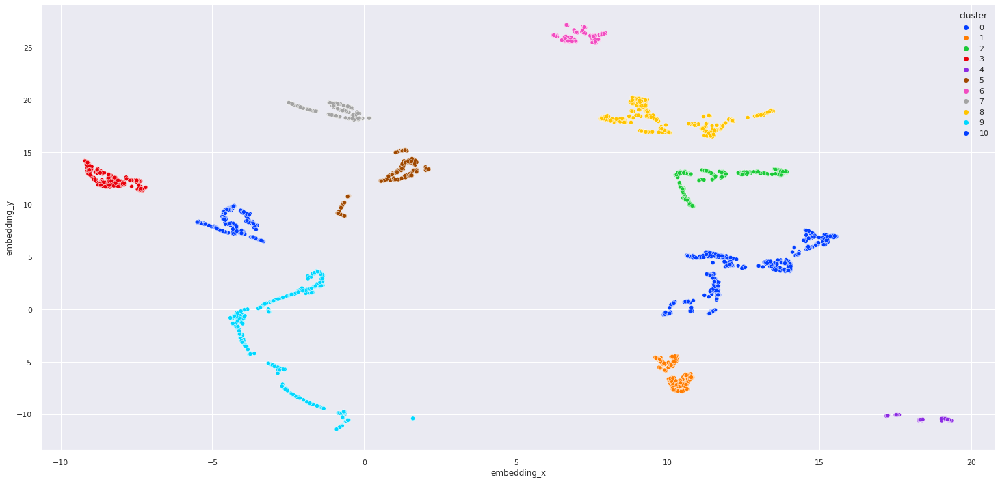

In [252]:
db_model = DBSCAN(eps = 2.3, min_samples=5)

labels = db_model.fit_predict(df_tree)

df_res = df_tree.copy()
df_res['cluster'] = labels

sns.scatterplot(data = df_res, x = 'embedding_x', y = 'embedding_y', hue = 'cluster', palette = 'bright');

## 7.4 AffinityPropagation


In [84]:
# hyperparameters
damping = 0.8

# defining model
ap_model = AffinityPropagation( damping = damping, random_state=42)
labels = ap_model.fit_predict(df7)

print( 'Silhouette Score: {:,.4f}'.format(silhouette_score(df_prep, labels)) )
print( 'Number of Clusters: {}'.format(len(np.unique(labels))) )
print( 'Clusters: {}'.format(np.unique(labels)) )


Silhouette Score: 0.3130
Number of Clusters: 46
Clusters: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45]


In [249]:
# hyperparameters
damping = 0.8

# defining model
ap_model = AffinityPropagation( damping = damping, random_state=42)
labels = ap_model.fit_predict(df7)

print( 'Silhouette Score: {:,.4f}'.format(silhouette_score(df_prep, labels)) )
print( 'Number of Clusters: {}'.format(len(np.unique(labels))) )
print( 'Clusters: {}'.format(np.unique(labels)) )


Silhouette Score: -0.0430
Number of Clusters: 29
Clusters: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28]


This one did not converge or returned too many clusters (i.e. 46)

## 7.5 SpectralClustering


### 7.5.1 Rescaled Data

In [251]:
# hyperparameters
n_clusters = 5
random_state = 42
affinity = 'rbf' # rbf, polynomial, poly, laplacian
n_jobs = -1

# defining model
sp_model = SpectralClustering(n_clusters = n_clusters, random_state = random_state, affinity = affinity, n_jobs = n_jobs)
labels = sp_model.fit_predict(df7)

# Checking Performance
print( 'Silhouette Score: {:,.4f}'.format(silhouette_score(df7, labels)) )
print( 'Number of Clusters: {}'.format(len(np.unique(labels))) )
print( 'Clusters: {}'.format(np.unique(labels)) )

Silhouette Score: 0.4902
Number of Clusters: 5
Clusters: [0 1 2 3 4]


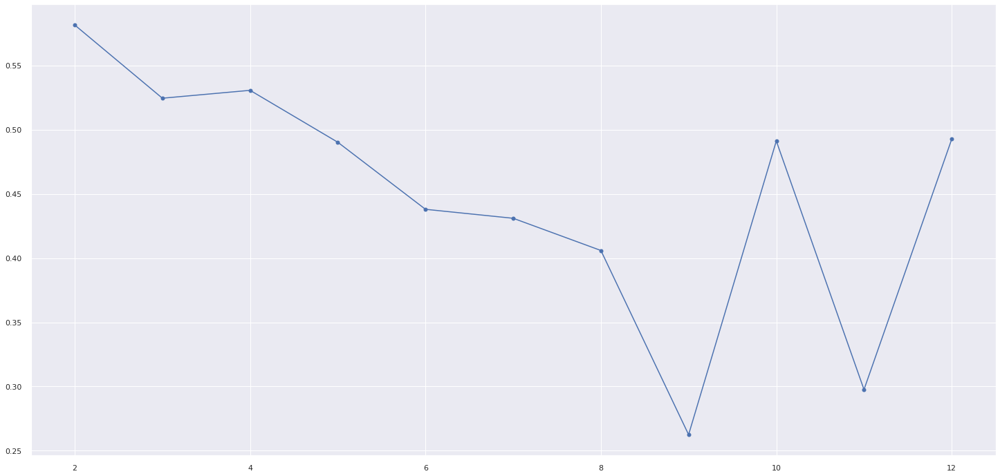

In [21]:
# Spectral
n_max = 12

# hyperparameters
affinity = 'rbf' # rbf, polynomial, poly, laplacian

spc_silhouette = []
for n_clusters in range(2, n_max + 1):
    # define model
    sp_model = SpectralClustering(n_clusters = n_clusters, random_state = 42, affinity = affinity, n_jobs = -1)
    
    # get labels
    labels = sp_model.fit_predict(df7)

    # metric
    sil = silhouette_score(df7, labels)
    spc_silhouette.append(sil)

# ploting silhouette
plt.plot( range(2, n_max + 1) , spc_silhouette, marker = 'o', color = 'b');

In [264]:
n_clusters = 12
affinity = 'rbf'
sp_model = SpectralClustering(n_clusters = n_clusters, random_state = 42, affinity = affinity, n_jobs = -1)
    
# get labels
labels = sp_model.fit_predict(df7)

# metric
sil = silhouette_score(df7, labels)
sil

0.4925401732463315

For n_clusters = 2 the average silhouette_score is : 0.5815
For n_clusters = 3 the average silhouette_score is : 0.5244
For n_clusters = 4 the average silhouette_score is : 0.5306
For n_clusters = 5 the average silhouette_score is : 0.4902
For n_clusters = 6 the average silhouette_score is : 0.4380
For n_clusters = 7 the average silhouette_score is : 0.4310


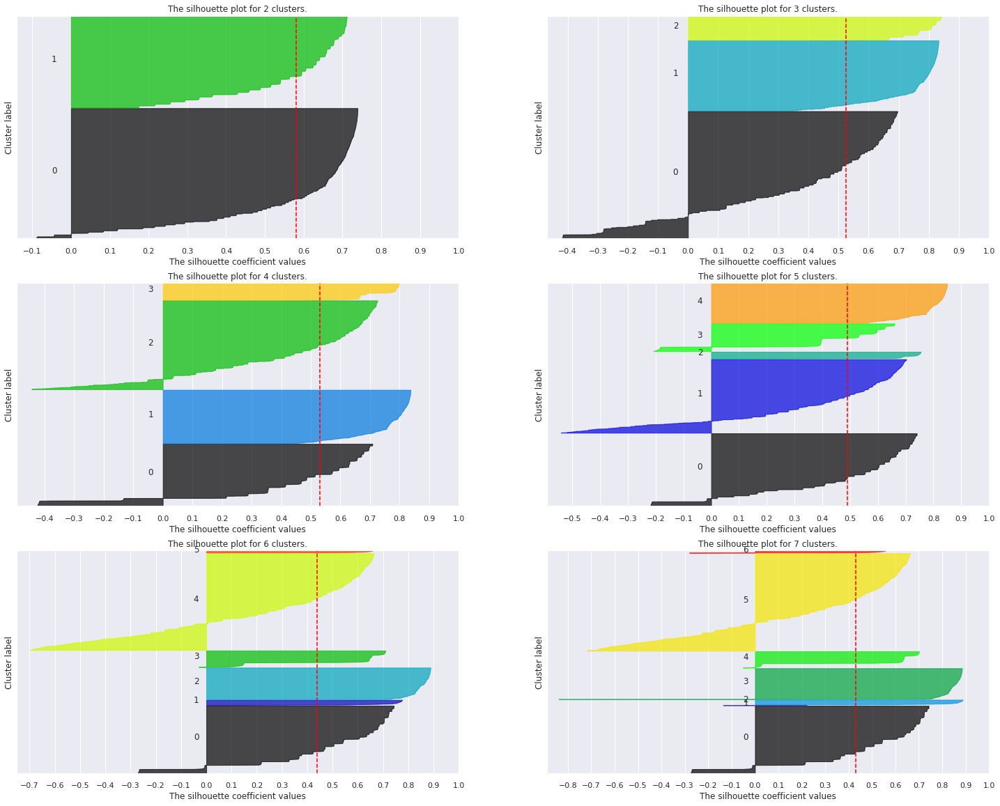

In [265]:
clusters = np.arange(2,8)

n_rows = math.ceil( len(clusters)/2 )
fig, ax = plt.subplots(n_rows, 2, figsize = (25,20) )

for idx, n_clusters in enumerate( clusters ):
    # defining model
    affinity = 'rbf'
    sp_model = SpectralClustering(n_clusters = n_clusters, random_state = 42, affinity = affinity, n_jobs = -1)
    
    labels = sp_model.fit_predict(df7)

    # ploting silhouette
    row, col = divmod(idx, 2)
    plot_silhouette( df7, labels, ax[row][col] )

plt.show()

For n_clusters = 8 the average silhouette_score is : 0.4059
For n_clusters = 9 the average silhouette_score is : 0.2625
For n_clusters = 10 the average silhouette_score is : 0.4911
For n_clusters = 11 the average silhouette_score is : 0.2976
For n_clusters = 12 the average silhouette_score is : 0.4925
For n_clusters = 13 the average silhouette_score is : 0.4412
For n_clusters = 14 the average silhouette_score is : 0.3639
For n_clusters = 15 the average silhouette_score is : 0.4674


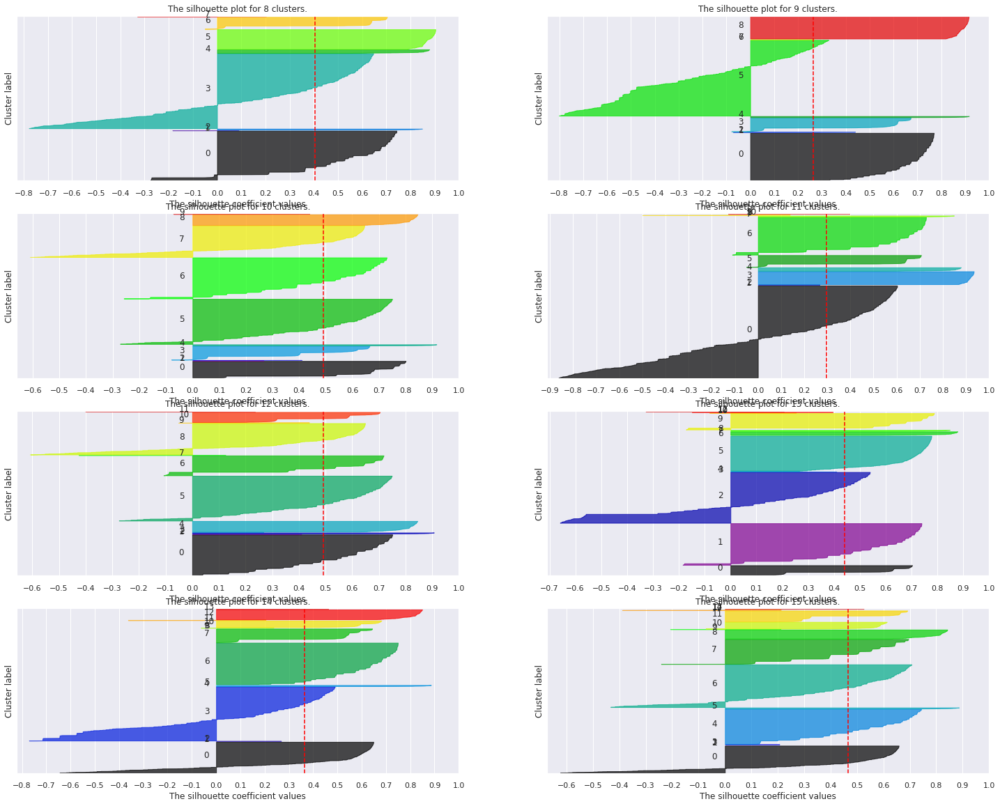

In [266]:
clusters = np.arange(8,16)

n_rows = math.ceil( len(clusters)/2 )
fig, ax = plt.subplots(n_rows, 2, figsize = (25,20) )

for idx, n_clusters in enumerate( clusters ):
    # defining model
    affinity = 'rbf'
    sp_model = SpectralClustering(n_clusters = n_clusters, random_state = 42, affinity = affinity, n_jobs = -1)
    
    labels = sp_model.fit_predict(df7)

    # ploting silhouette
    row, col = divmod(idx, 2)
    plot_silhouette( df7, labels, ax[row][col] )

plt.show()

### 7.5.2 Embedded Data

In [34]:
# rescaling df_tree using minmax in order to the spectral clustering algorithm work properly. 
# (The algorithm did not work with data on it's normal range, but worked on 0-1 range. May be due to the eigen_solver or rbf affinity)
pipe = make_pipeline( MinMaxScaler() )
df_tree_min_max = pd.DataFrame(pipe.fit_transform(df_tree))

sp_model = SpectralClustering(n_clusters = 5, random_state = 42, affinity = 'rbf')

# get labels
labels = sp_model.fit_predict(df_tree_min_max)

# metric
silhouette_score(df_tree_min_max, labels)

0.5172048

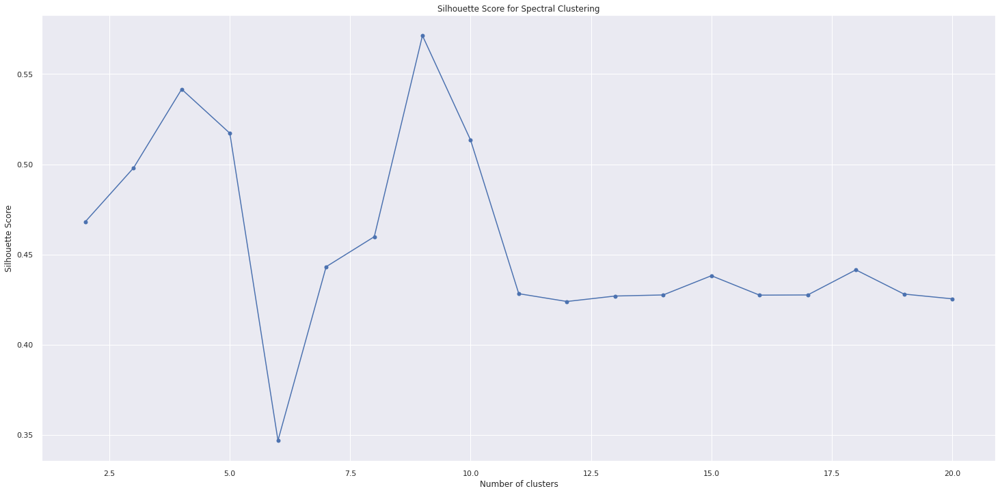

In [36]:
# Spectral
n_max = 20

# hyperparameters
affinity = 'rbf' # rbf, polynomial, poly, laplacian

spc_silhouette_emb = []
for n_clusters in range(2, n_max + 1):
    # define model
    sp_model = SpectralClustering(n_clusters = n_clusters, random_state = 42, affinity = affinity, n_jobs = -1)
    
    # get labels
    labels = sp_model.fit_predict(df_tree_min_max)

    # metric
    sil = silhouette_score(df_tree_min_max, labels)
    spc_silhouette_emb.append(sil)

# ploting silhouette
plt.title('Silhouette Score for Spectral Clustering')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
# plt.xticks( np.arange(2, n_max+1, 2) )
plt.plot( range(2, n_max + 1) , spc_silhouette_emb, marker = 'o', color = 'b');

In [40]:
n_clusters = 14

sp_model = SpectralClustering(n_clusters = n_clusters, random_state = 42, affinity = affinity, n_jobs = -1)

# get labels
labels = sp_model.fit_predict(df_tree_min_max)

# metric
sil = silhouette_score(df_tree_min_max, labels)

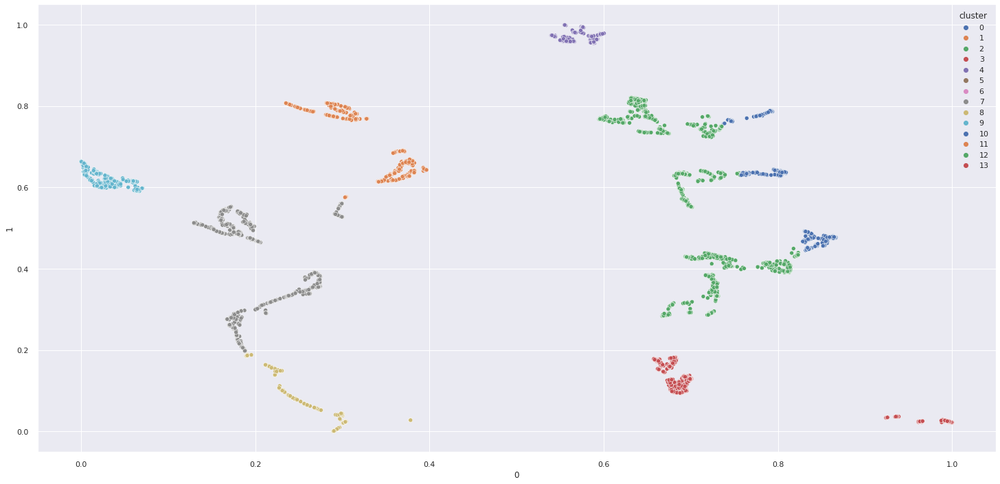

In [41]:
df_res = df_tree_min_max.copy()
df_res['cluster'] = labels

sns.scatterplot(data = df_res, x = 0, y = 1, hue = 'cluster', palette = 'deep');

## 7.6 Gaussian Mixture


### 7.6.1 Rescaled Data

In [267]:
# hyperparameters
n_components = 5
random_state = 42

# defining model
gm_model = GaussianMixture( n_components = n_components, random_state = random_state)
labels = gm_model.fit_predict(df7)

# Checking Performance
print( 'Silhouette Score: {:,.4f}'.format(silhouette_score(df7, labels)) )
print( 'Number of Clusters: {}'.format(len(np.unique(labels))) )

Silhouette Score: 0.0197
Number of Clusters: 5


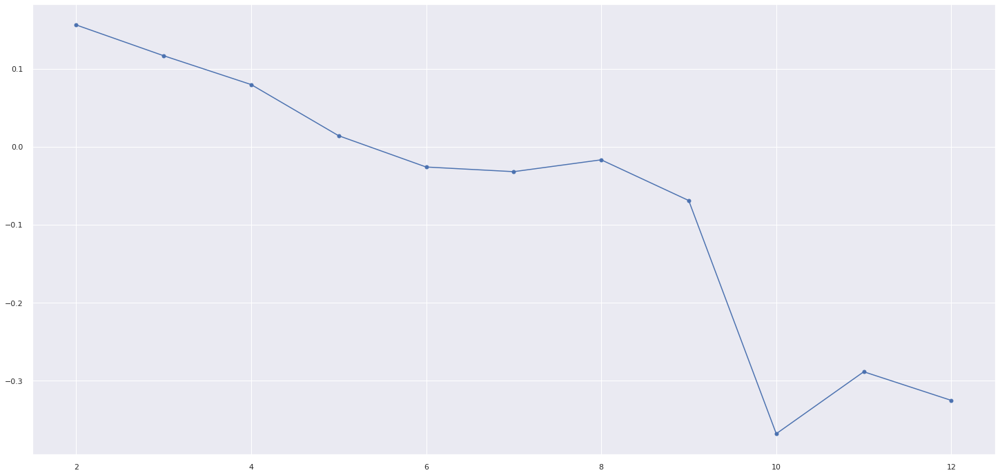

In [22]:
# GMM 
n_max = 12

gmm_silhouette = []
for n_components in range(2, n_max + 1):
    # define model
    gmm = GaussianMixture(n_components = n_components)
    # get labels
    labels = gmm.fit_predict(df7)

    # metric
    sil = silhouette_score(df7, labels)
    gmm_silhouette.append(sil)

# ploting silhouette
plt.plot( range(2, n_max + 1) , gmm_silhouette, marker = 'o', color = 'b');

For n_clusters = 2 the average silhouette_score is : 0.1561
For n_clusters = 3 the average silhouette_score is : 0.1166
For n_clusters = 4 the average silhouette_score is : 0.0427
For n_clusters = 5 the average silhouette_score is : 0.0197
For n_clusters = 6 the average silhouette_score is : -0.0262
For n_clusters = 7 the average silhouette_score is : -0.0232


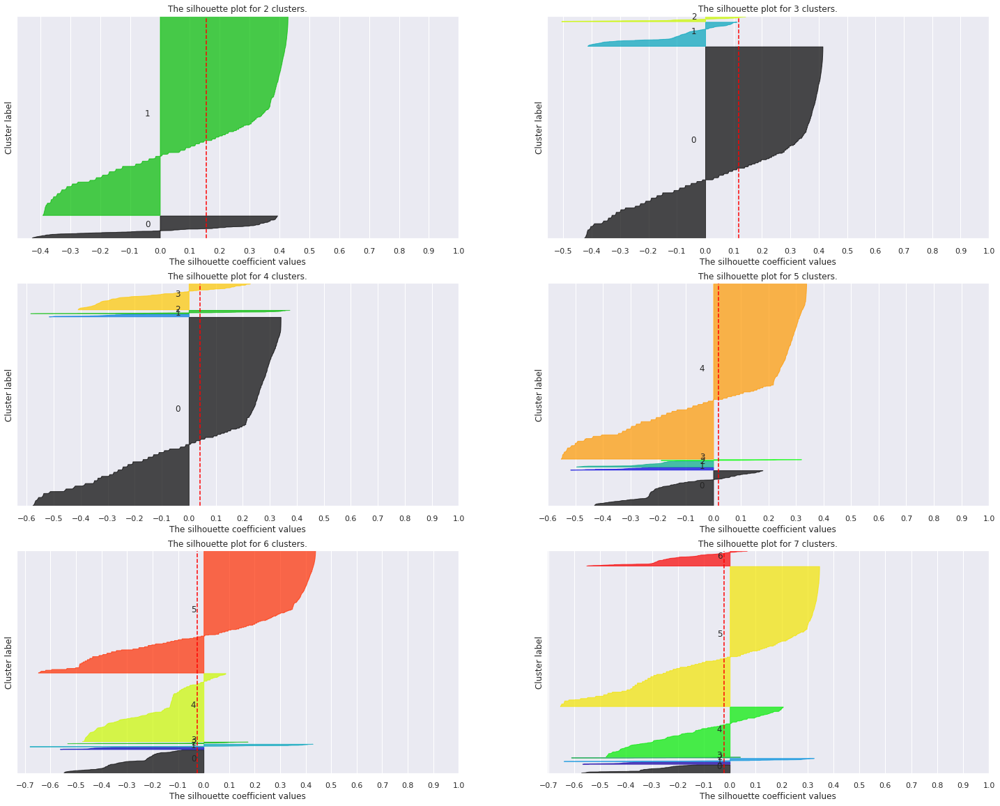

In [269]:
# Taking a look at the results with our personalized function

clusters = np.arange(2,8)

# setting number of rows and defining a subplots instance
n_rows = math.ceil( len(clusters)/2 )
figg, ax = plt.subplots(n_rows, 2, figsize = (25,20))

for idx, n_clusters in enumerate(clusters):

    clusterer = GaussianMixture(n_components=n_clusters, random_state=42)
    cluster_labels = clusterer.fit_predict(df7)

    # since we are using 2 + figures subplots returns a 2d axes list (matrix)
    row, col = divmod(idx, 2)
    plot_silhouette(df7, cluster_labels, ax[row][col] )
    

For n_clusters = 8 the average silhouette_score is : -0.0118
For n_clusters = 9 the average silhouette_score is : -0.2224
For n_clusters = 10 the average silhouette_score is : -0.1431
For n_clusters = 11 the average silhouette_score is : -0.1371
For n_clusters = 12 the average silhouette_score is : -0.2024
For n_clusters = 13 the average silhouette_score is : -0.1716


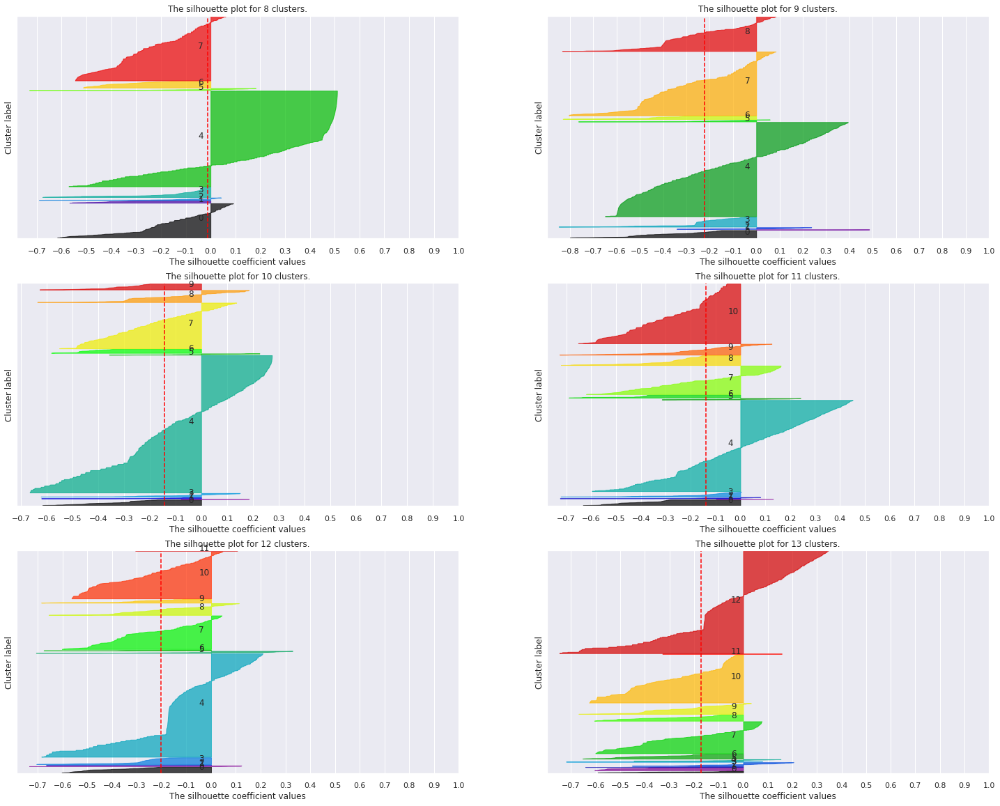

In [270]:
# Taking a look at the results with our personalized function

clusters = np.arange(8,14)

# setting number of rows and defining a subplots instance
n_rows = math.ceil( len(clusters)/2 )
figg, ax = plt.subplots(n_rows, 2, figsize = (25,20))

for idx, n_clusters in enumerate(clusters):

    clusterer = GaussianMixture(n_components=n_clusters, random_state=42)
    cluster_labels = clusterer.fit_predict(df7)

    # since we are using 2 + figures subplots returns a 2d axes list (matrix)
    row, col = divmod(idx, 2)
    plot_silhouette(df7, cluster_labels, ax[row][col] )
    

### 7.6.2 Embedded Data

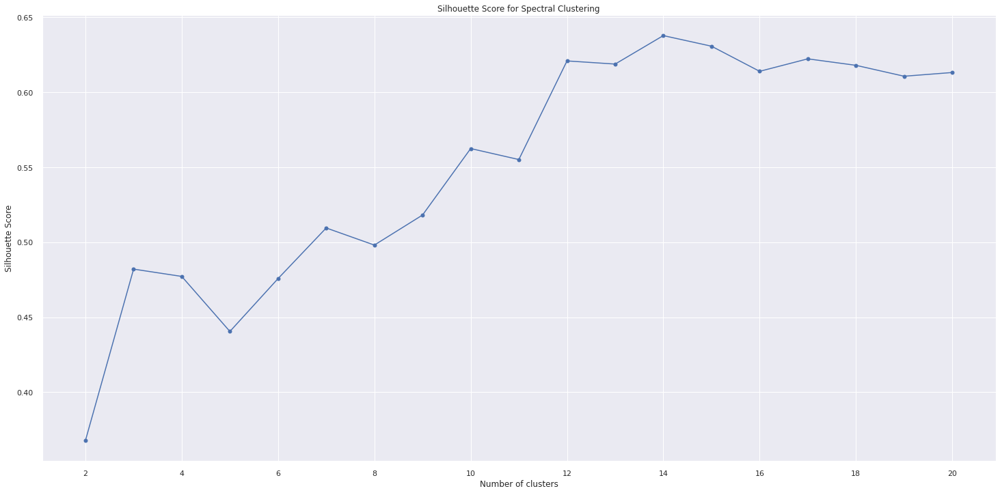

In [57]:
# Gaussian Mixture
n_max = 20

# hyperparameters

gmm_silhouette_emb = []
for n_clusters in range(2, n_max + 1):
    # define model
    sp_model = GaussianMixture(n_components= n_clusters, random_state = 42)
    
    # get labels
    labels = sp_model.fit_predict(df_tree_min_max)

    # metric
    sil = silhouette_score(df_tree_min_max, labels)
    gmm_silhouette_emb.append(sil)

# ploting silhouette
plt.title('Silhouette Score for Spectral Clustering')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.xticks( np.arange(2, n_max+1, 2) )
plt.plot( range(2, n_max + 1) , gmm_silhouette_emb, marker = 'o', color = 'b');

In [271]:
# hyperparameters
n_components = 14

# defining model
gm_model = GaussianMixture( n_components = n_components, random_state = 42)
labels = gm_model.fit_predict(df_tree_min_max)

# Checking Performance
print( 'Silhouette Score: {:,.4f}'.format(silhouette_score(df_tree_min_max, labels)) )
print( 'Number of Clusters: {}'.format(len(np.unique(labels))) )

Silhouette Score: 0.6378
Number of Clusters: 14


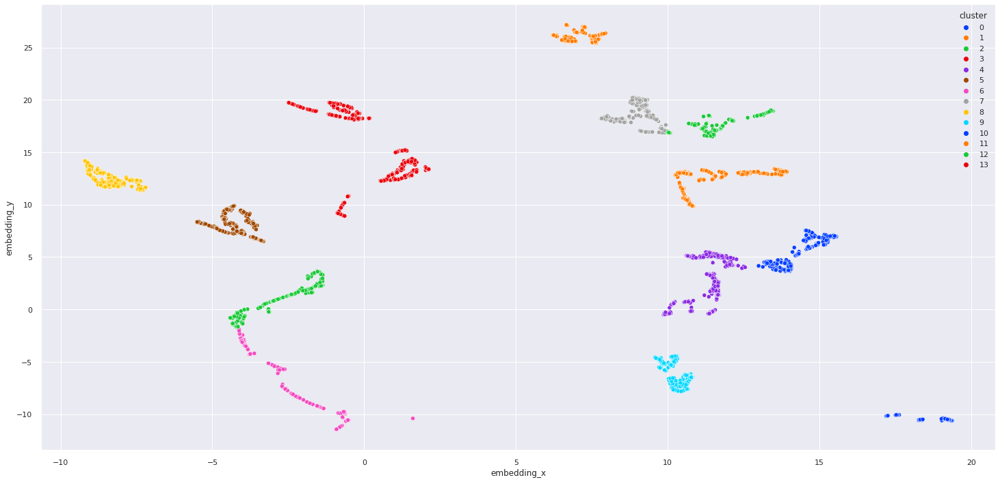

In [272]:
df_res = df_tree.copy()
df_res['cluster'] = labels

sns.scatterplot(data = df_res, x = 'embedding_x', y = 'embedding_y', hue = 'cluster', palette = 'bright');

## 7.7 Comparing Model's Performances

### 7.7.1 Rescaled Data

In [23]:
results = pd.DataFrame( { 'KMeans' : kmeans_silhouette,
                        #   'DBScan' : dbscan_silhouette,
                          'GMM' : gmm_silhouette,
                          'HC' : hc_silhouette,
                          'Spectral' : spc_silhouette } )
          
results = results.T
results.style.highlight_max( color='blue', axis=1 )

,0,1,2,3,4,5,6,7,8,9,10
KMeans,0.585361,0.573309,0.576484,0.570473,0.551406,0.544480,0.553197,0.547502,0.538266,0.534843,0.532392
GMM,0.156115,0.116607,0.079612,0.013965,-0.026162,-0.032127,-0.016947,-0.069148,-0.368317,-0.288803,-0.325535
HC,0.324804,0.234984,0.192467,0.160162,0.140895,0.105296,0.091346,0.079664,0.073204,0.014661,0.007257
Spectral,0.581471,0.524447,0.530588,0.490176,0.437967,0.430978,0.405917,0.262540,0.491135,0.297635,0.492540


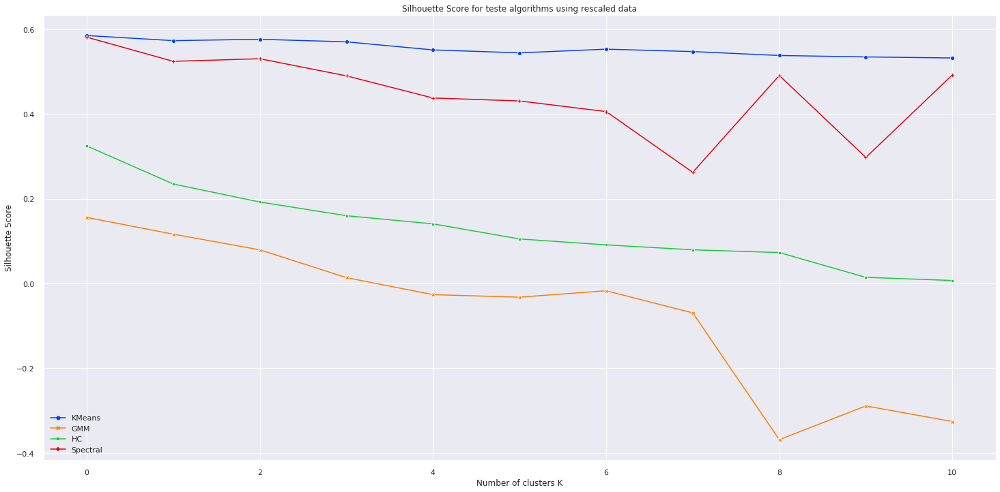

In [62]:
plt.title('Silhouette Score for teste algorithms using rescaled data')
plt.xlabel('Number of clusters K')
plt.ylabel('Silhouette Score')
sns.lineplot(data = results.T, markers = True, palette = 'bright', dashes = False);
# sns.relplot(data = results.T, palette = 'bright', dashes = False);


### 7.7.2 Embedded Data

In [274]:
results_emb = pd.DataFrame( { 'KMeans' : kmeans_silhouette_emb,
                          'DBScan' : db_silhouette_emb,
                          'GMM' : gmm_silhouette_emb,
                          'HC' : hc_silhouette_emb,
                          'Spectral' : spc_silhouette_emb } )
results_emb = results_emb.set_axis(np.arange(2,21, 1) )          
results_emb = results_emb.T
results_emb.style.highlight_max( color='blue', axis=1 )

,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
KMeans,0.425433,0.488546,0.529328,0.547252,0.552025,0.578673,0.590655,0.603078,0.619148,0.641481,0.642280,0.662028,0.661147,0.648527,0.651492,0.657925,0.660709,0.643515,0.660375
DBScan,0.581334,0.558461,0.603458,0.632480,0.632480,0.632480,0.589893,0.589893,0.589893,0.589893,0.589893,0.589893,0.589893,0.583138,0.583138,0.583138,0.583138,0.626738,0.626738
GMM,0.367719,0.482064,0.477187,0.440488,0.475739,0.509511,0.498092,0.518130,0.562486,0.555152,0.620939,0.618839,0.637826,0.630762,0.613998,0.622322,0.617998,0.610724,0.613208
HC,0.425433,0.445175,0.529328,0.549449,0.559241,0.578673,0.585658,0.598081,0.615738,0.633287,0.634086,0.653477,0.660877,0.648256,0.649118,0.656393,0.653370,0.646819,0.646025
Spectral,0.468141,0.497928,0.541605,0.517205,0.346760,0.443147,0.459801,0.571344,0.513367,0.428203,0.423876,0.426900,0.427509,0.438169,0.427398,0.427498,0.441416,0.427987,0.425360


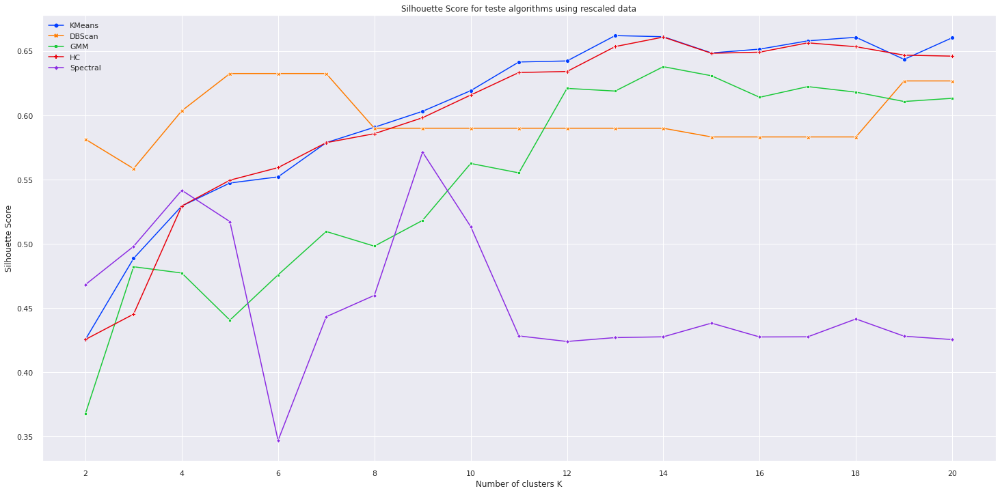

In [275]:
plt.title('Silhouette Score for teste algorithms using rescaled data')
plt.xlabel('Number of clusters K')
plt.ylabel('Silhouette Score')
plt.xticks(np.arange(2,21, 2))
sns.lineplot(data = results_emb.T, markers = True, palette = 'bright', dashes = False);
# sns.relplot(data = results.T, palette = 'bright', dashes = False);

# sidenote: DBSCAN xaxis is not number of clusters, but eps. I just ploted it this way to compare silhouette coefficient.


## Final thoughts on the used algorithms
KMEANS, Hierarchical Clustering, and GMM performed well in terms of silhouette coefficient however they did not separate clusters well.

Regarding KMEANS and Gaussian Mixture it happened probably because clusters are not spherical, nor form clear Gaussians.

Spectral Clustering should have performed well since it relies on connections between data points and not their shape however, the algorithm was very slow and I couldn't afford the time to tune it properly.

Finally, DBSCAN was the best algorithm concerning proper cluster separation (even though its silhouette score was a bit lower than that of its pairs because silhouette coefficient is negatively affected by non-spherical clusters). I believe this algorithm performed well, given that it works based on densities no matter the form of the clusters.

# 8.0 Model Training

In [16]:
# selecting data

df8 = df_tree.copy()

df_aux = df5.copy()
df_aux = pd.concat( [df_aux, df_tree], axis = 1 )

In [36]:
# defining model
db_model = DBSCAN(eps = 2.3, min_samples=5)

# predicting cluster labels
labels = db_model.fit_predict(df_tree)

# storing labels on auxiliar dataset
df_aux['cluster'] = labels.astype(str)

# sns.scatterplot(data = df_res, x = 'embedding_x', y = 'embedding_y', hue = 'cluster', palette = 'bright');

# 9.0 Cluster Analysis

## 9.1 Visual Inspection - Metrics

In [43]:
# Evaluating Silhouette Score
silhouette_score(df_tree, labels)

0.6267377

For n_clusters = 11 the average silhouette_score is : 0.6267


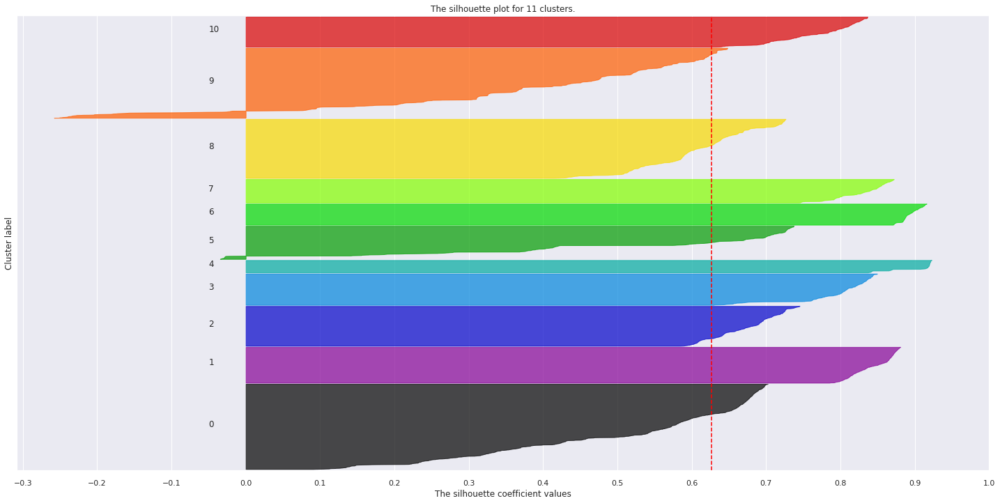

In [45]:
plot_silhouette(df_tree, labels);

## 9.2 Pairploting Features

In [51]:
# columns from pipeline
# cols = ['recency', 'num_transactions', 'frequency', 'revenue', 'avg_ticket', 'num_returns', 'date_range', 'return_revenue', 'avg_return_revenue', 'country']

# df_viz = pd.DataFrame(df_prep, columns = cols)
df_viz = pd.DataFrame(df_prep)

df_viz['cluster'] = labels
# df_viz.head()

In [47]:
# sns.pairplot(data = df_viz, hue = 'cluster' );

## 9.3 Visual Inspection - UMAP

In [48]:
px.scatter(data_frame = df_aux, x = 'embedding_x', y = 'embedding_y', color = 'cluster', hover_data=['revenue', 'num_purchases', 'avg_ticket', 'qty_items'])

## 9.4 Business Perspective

In [53]:
# number of customers per cluster
n_cust = df_aux.copy()
n_cust = n_cust.groupby('cluster').count().reset_index().rename(columns = {'customer_id' : 'num_of_customers'})
n_cust['perc_of_customer'] = n_cust['num_of_customers']/n_cust['num_of_customers'].sum()*100
n_cust = n_cust[['cluster', 'num_of_customers', 'perc_of_customer']]

In [77]:
# calculating mean values for each cluster attribute

df_res = df_aux.copy()

# calculating mothly frequency
df_res['frequency'] = df_res['frequency']*30

# add cluster to df
# df_res =pd.concat( [df_res, pd.DataFrame( { 'cluster' : labels} ) ], axis = 1 )
result = df_res.groupby('cluster').mean().reset_index()
result

# add nº of customers
result = result.merge( n_cust, on = 'cluster', how = 'inner')
result = result[['cluster', 'num_of_customers', 'perc_of_customer', 'num_purchases', 'date_range', 'frequency', 'recency', 'revenue', 'avg_ticket', 'num_returns', 'avg_return_revenue' ]]

# converting cluster to int to sort it
result['cluster'] = result['cluster'].astype(int)
result.sort_values('revenue', ascending = False )

,cluster,num_of_customers,perc_of_customer,num_purchases,date_range,frequency,recency,revenue,avg_ticket,num_returns,avg_return_revenue
5,4,122,2.828002,28.319672,315.704918,4.216134,19.893443,26919.612541,1190.967567,16.393443,-105.774531
1,1,350,8.113120,10.774286,283.831429,1.304213,29.420000,4807.843571,663.648830,5.745714,-15.990815
0,0,832,19.286045,5.933894,231.454327,2.220941,44.183894,2081.876791,447.670658,2.514423,-10.809519
3,2,390,9.040334,4.410256,199.241026,1.159664,54.907692,1229.507103,358.422533,1.733333,-10.260330
9,8,577,13.375058,2.024263,135.192374,1.332675,93.417678,777.658839,440.048120,0.741768,-4.978410
7,6,206,4.775151,3.713592,183.577670,1.475518,69.383495,604.851311,168.244465,1.844660,-9.237072
8,7,230,5.331479,2.000000,129.313043,1.687273,90.582609,481.550435,240.775217,0.521739,-2.857373
6,5,324,7.510431,1.000000,139.441358,0.677090,139.441358,396.901204,396.901204,0.311728,-1.982865
2,10,294,6.815021,1.095238,162.758503,0.585821,165.180272,379.410000,348.322347,0.397959,-2.766372
4,3,306,7.093185,2.526144,144.503268,2.010196,101.297386,300.953072,123.893084,0.575163,-8.796140


In [83]:
# Generating a report of some attributes for each cluster

# ordering by cluster
result = result.sort_values('cluster').reset_index(drop = True)

for i in range( len(np.unique(labels)) ):
    print('Cluster {}'.format(result.loc[i, 'cluster']))
    print(' - Number of customers {} ({:,.2f} % of total)'.format(result.loc[i, 'num_of_customers'], result.loc[i, 'perc_of_customer']) )
    print(' - Average nº of transactions: {:.2f} '.format(result.loc[i, 'num_purchases']) )
    print(' - Average tenure in days {:.2f} '.format(result.iloc[i, 4]) )
    print(' - Average amount spent in total ${:,.2f} '.format(result.loc[i, 'revenue']) )
    print(' - Mean values for average ticket ${:,.2f} \n'.format(result.loc[i, 'avg_ticket']) )

    

Cluster 0
 - Number of customers 832 (19.29 % of total)
 - Average nº of transactions: 5.93 
 - Average tenure in days 231.45 
 - Average amount spent in total $2,081.88 
 - Mean values for average ticket $447.67 

Cluster 1
 - Number of customers 350 (8.11 % of total)
 - Average nº of transactions: 10.77 
 - Average tenure in days 283.83 
 - Average amount spent in total $4,807.84 
 - Mean values for average ticket $663.65 

Cluster 2
 - Number of customers 390 (9.04 % of total)
 - Average nº of transactions: 4.41 
 - Average tenure in days 199.24 
 - Average amount spent in total $1,229.51 
 - Mean values for average ticket $358.42 

Cluster 3
 - Number of customers 306 (7.09 % of total)
 - Average nº of transactions: 2.53 
 - Average tenure in days 144.50 
 - Average amount spent in total $300.95 
 - Mean values for average ticket $123.89 

Cluster 4
 - Number of customers 122 (2.83 % of total)
 - Average nº of transactions: 28.32 
 - Average tenure in days 315.70 
 - Average amount

# 10 Model Deployment

### TODO
- perform EDA and evaluate business hypothesis on clusters
- deploy model